# Photon Subtraction in Graph State
2026\. 05\. 19.  Make the pseudo code

## 1. Set the graph state

##### Initial parameters, modules and functions

In [38]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
# Graph: paper-style 6-node graph, labels 1-6 1-2-3-4-5-6 graph
Adj = np.array([[0, 1, 0, 0, 0, 0, 0],
                [1, 0, 1, 0, 0, 0, 0],
                [0, 1, 0, 1, 0, 0, 0],
                [0, 0, 1, 0, 1, 0, 0],
                [0, 0, 0, 1, 0, 1, 0],
                [0, 0, 0, 0, 1, 0, 1],
                [0, 0, 0, 0, 0, 1, 0]], dtype=float)
m = Adj.shape[0]

# Phase-space convention: q = (x1, ..., xm, p1, ..., pm)
I_m = np.eye(m)
Z_m = np.zeros((m, m))
Omega = np.block([[Z_m, I_m], [-I_m, Z_m]]) # [0, I; -I, 0] symplectic form
J = Omega.T # [0, -I; I, 0] symplectic form in Mattia's convention

# CZ symplectic matrix
G = np.block([[I_m, Z_m], [Adj, I_m]])

# Input covariance, paper convention: vacuum variance = 1
squeezing_db = np.full(m, 10, dtype=float) # 단위는 dB 
#squeezing_db = np.array([3, 4, 12, 5, 3, 5], dtype=float) # mode별로 squeezing 다르게 주는 경우

s = 10 ** (squeezing_db / 10) # 단위 변환
V0 = np.diag(np.concatenate([s, 1 / s])) # diag(s_1, ..., s_m, 1/s_1, ..., 1/s_m)


# Graph-state covariance
V = G @ V0 @ G.T # maybe later we adjust this code to general mixed case.

# Photon-subtraction mode
# annhilation operator 기준으로 photon subtraction을 설명하기 위한 f이다. 복소수가 가능하며 C^(m)이다.
# a(f) = f1 a1 + f2 a2 + ... + fm am 이다.

f_sub = np.array([1, 0, 0, 0, 0, 0, 0], dtype=complex) # a(f_sub) = sum f_sub[i] a_i
#f_sub = np.array([1, 0, 0, 0, 0, 0, 1], dtype=complex)
f_sub = f_sub / np.linalg.norm(f_sub) # 정규화

# mattia convention으로 표현, g_sub이 전부 실수 R^(2m)이다. -> 이는 quadrature 기준으로 중첩을 설명하기 위한 convention이다.
# 수식적으로는 g = (Re(f), -Im(f))^T)이고, Q(g) = x(g), Q(Jg) = p(g)이다.

g_sub = np.concatenate([np.real(f_sub), -np.imag(f_sub)]) # g_sub = (Re(f_sub), -Im(f_sub)) in phase space , a(f_sub) = 1/2 (Q(g_sub)+iQ(Jg_sub)) 
Jg_sub = J @ g_sub
Pi_g = np.outer(g_sub, g_sub) + np.outer(Jg_sub, Jg_sub) # Πg =ggT + Jg(Jg)T , projection matrix for the subtracted mode

sub_node = 1
sub_label = rf"$g=e_{{{sub_node}}}$"
#sub_label = rf"$g=\frac{{e_{{{sub_node}}}+e_{{6}}}}{{\sqrt{{2}}}}$"

##### graph plotting function

In [39]:
from matplotlib.colors import LinearSegmentedColormap

blue = LinearSegmentedColormap.from_list(
    "blue",
    ["#3f5f87", "#7b8a70", "#fffbe6"]
)

red = LinearSegmentedColormap.from_list(
    "red",
    ["#18051f", "#5b2a86", "#d44a1c", "#ffc247", "#fffbe6"]
)

In [40]:
def plot_graph_from_matrix(
    W,
    node_values=None,
    title="",
    threshold=1e-6,
    pos=None,
    cmap=blue,
    vmin=None,
    vmax=None,
    colorbar_label="",
    draw_labels=None,
    labels=None
):
    """
    W: weighted adjacency matrix 
    node_values: optional node color values, e.g. kurtosis, purity, nullifier_var
    """

    W_plot = np.array(W, dtype=float).copy()
    G_plot = nx.from_numpy_array(W_plot)

    # automatic layout - 어느정도 정렬된 그래프를 그려준다. 더 깔끔하게 그리고 싶을때는 pos를 직접 지정
    if pos is None:
        pos = nx.kamada_kawai_layout(G_plot)


    # label이 주어지지 않으면 기본적으로 1부터 시작
    if labels is None:
        labels = {i: i + 1 for i in range(W_plot.shape[0])}

    # node_values가 있으면 논문 figure처럼 label을 기본적으로 끔
    if draw_labels is None:
        draw_labels = node_values is None

    # plotting // 사이즈 고정
    plt.figure(figsize=(4.2, 3.2), dpi=180)
    
    
    # graph edge(선) 그리기
    nx.draw_networkx_edges(
        G_plot,
        pos,
        edge_color="#5b668a",
        width=1.4,
        alpha=0.75
    )

    # graph node(노드) 그리기
    if node_values is None:
        nx.draw_networkx_nodes(
            G_plot,
            pos,
            node_color="white",
            edgecolors="black",
            linewidths=1.1,
            node_size=700
        )

    else:
        node_values_plot = np.asarray(node_values, dtype=float)

        # colorbar range를 node_values에서 자동 설정
        if vmin is None:
            vmin = np.nanmin(node_values_plot)
        if vmax is None:
            vmax = np.nanmax(node_values_plot)

        # 모든 node value가 같은 경우 colorbar error 방지
        if np.isclose(vmin, vmax):
            vmin -= 1e-9
            vmax += 1e-9

        nodes = nx.draw_networkx_nodes(
            G_plot,
            pos,
            node_color=node_values_plot,
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
            edgecolors="#444444",
            linewidths=1.1,
            node_size=500
        )

        cbar = plt.colorbar(nodes, fraction=0.045, pad=0.03)
        if colorbar_label:
            cbar.set_label(colorbar_label, fontsize=9)
        cbar.ax.tick_params(labelsize=8)

    # graph label 그리기
    if draw_labels:
        nx.draw_networkx_labels(
            G_plot,
            pos,
            labels=labels,
            font_color="black",
            font_size=9
        )

    plt.title(title, fontsize=10, pad=6)
    plt.axis("equal")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return pos

##### matrix visualization function

In [41]:
def show_mat(M, name="M", digits=3, tol=1e-10):
    M_show = np.array(M, dtype=float).copy()
    M_show[np.abs(M_show) < tol] = 0

    n, m = M_show.shape
    df = pd.DataFrame(
        M_show,
        index=[f"{i+1}" for i in range(n)],
        columns=[f"{j+1}" for j in range(m)]
    )

    print(name)
    display(df.style.format(f"{{:.{digits}f}}"))

In [42]:
def draw_mat(M, title="", cmap="bwr", label=False, digits=2,
             vlim=None, figsize=(5, 4.5), grid=False):
    M = np.asarray(M)
    n, m = M.shape

    vmax = np.percentile(np.abs(M), 95) if vlim is None else vlim
    vmax = vmax if vmax > 0 else 1

    fig, ax = plt.subplots(figsize=figsize, dpi=180)
    im = ax.imshow(
        M,
        cmap=cmap,
        vmin=-vmax,
        vmax=vmax,
        interpolation="nearest",
        aspect="equal"
    )

    ax.set_xticks(range(m), labels=range(1, m + 1))
    ax.set_yticks(range(n), labels=range(1, n + 1))
    ax.tick_params(
        top=True, labeltop=True,
        bottom=False, labelbottom=False,
        labelsize=8
    )

    # grid for every matrix cell
    if grid:
        ax.set_xticks(np.arange(-0.5, m, 1), minor=True)
        ax.set_yticks(np.arange(-0.5, n, 1), minor=True)
        ax.grid(which="minor", color="k", linewidth=0.18, alpha=0.15)
        ax.tick_params(which="minor", bottom=False, left=False)

    if label:
        for i in range(n):
            for j in range(m):
                ax.text(
                    j, i, f"{M[i, j]:.{digits}f}",
                    ha="center", va="center", fontsize=6
                )

    ax.set_title(title)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()

In [43]:
from matplotlib.colors import TwoSlopeNorm, PowerNorm, Normalize
import numpy as np
import matplotlib.pyplot as plt

def draw_phase_matrix(
    M,
    title="",
    mode_labels=None,
    cmap="Reds",
    positive=True,
    vmin=None,
    vmax=None,
    gamma=1.5,
    tick_step=1,
    figsize=(5, 4.5),
    grid=True,
):
    """
    M: 2m x 2m phase-space matrix
       ordering = (x1,...,xm,p1,...,pm)

    positive=True:
        use Reds colormap with PowerNorm.
        Good when A_minus is nonnegative or mostly positive.

    positive=False:
        use diverging colormap centered at 0 only when vmin < 0 < vmax.
        If the requested range does not contain 0, use regular Normalize.
    """

    M = np.asarray(M, dtype=float)
    N = M.shape[0]
    assert M.shape[0] == M.shape[1], "M must be square."
    assert N % 2 == 0, "M must be 2m x 2m."

    m = N // 2

    if mode_labels is None:
        mode_labels = np.arange(1, m + 1)

    labels = (
        [rf"$x_{{{i}}}$" for i in mode_labels]
        + [rf"$p_{{{i}}}$" for i in mode_labels]
    )

    fig, ax = plt.subplots(figsize=figsize, dpi=170)

    if positive:
        if vmin is None:
            vmin = 0
        if vmax is None:
            vmax = np.nanmax(M)

        if np.isclose(vmin, vmax):
            vmax = vmin + 1

        norm = PowerNorm(gamma=gamma, vmin=vmin, vmax=vmax)

        im = ax.imshow(
            M,
            cmap=cmap,
            norm=norm,
            interpolation="nearest",
            aspect="equal"
        )

    else:
        if vmin is None and vmax is None:
            a = max(abs(np.nanmin(M)), abs(np.nanmax(M)))
            a = a if a > 0 else 1
            vmin = -a
            vmax = a

        elif vmin is None:
            a = abs(vmax)
            vmin = -a
            vmax = a

        elif vmax is None:
            a = abs(vmin)
            vmin = -a
            vmax = a

        if np.isclose(vmin, vmax):
            vmax = vmin + 1

        if vmin < 0 < vmax:
            norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
        else:
            norm = Normalize(vmin=vmin, vmax=vmax)

        im = ax.imshow(
            M,
            cmap=cmap,
            norm=norm,
            interpolation="nearest",
            aspect="equal"
        )

    # tick labels
    ticks = np.arange(0, N, tick_step)
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)

    if tick_step == 1 and N <= 30:
        ax.set_xticklabels([labels[i] for i in ticks], fontsize=8)
        ax.set_yticklabels([labels[i] for i in ticks], fontsize=8)
    else:
        ax.set_xticklabels(ticks + 1, fontsize=8)
        ax.set_yticklabels(ticks + 1, fontsize=8)

    ax.tick_params(
        top=True,
        labeltop=True,
        bottom=False,
        labelbottom=False,
        length=3
    )

    # cell grid
    if grid:
        ax.set_xticks(np.arange(-0.5, N, 1), minor=True)
        ax.set_yticks(np.arange(-0.5, N, 1), minor=True)
        ax.grid(which="minor", color="k", linewidth=0.18, alpha=0.12)
        ax.tick_params(which="minor", bottom=False, left=False)

    # x/p block separator
    ax.axhline(m - 0.5, color="k", linewidth=1.0, alpha=0.55)
    ax.axvline(m - 0.5, color="k", linewidth=1.0, alpha=0.55)

    ax.set_title(title, fontsize=13, pad=8)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=9)

    plt.tight_layout()
    plt.show()
    print(f"vmin={vmin:.3g}, vmax={vmax:.3g}")

##### Graph-State Sanity

In [44]:
print("m =", m)

print("Adj =\n", Adj)
print("V =\n", V)

print("f_sub =", f_sub)
print("f_sub shape =", f_sub.shape)

eigvals_physical = np.linalg.eigvalsh(V + 1j * Omega)
print("physical covariance(V + iOmega):", np.min(eigvals_physical) >= -1e-10)
#print("min eigenvalue of V + iOmega =", np.min(eigvals_physical))

m = 7
Adj =
 [[0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0.]]
V =
 [[10.   0.   0.   0.   0.   0.   0.   0.  10.   0.   0.   0.   0.   0. ]
 [ 0.  10.   0.   0.   0.   0.   0.  10.   0.  10.   0.   0.   0.   0. ]
 [ 0.   0.  10.   0.   0.   0.   0.   0.  10.   0.  10.   0.   0.   0. ]
 [ 0.   0.   0.  10.   0.   0.   0.   0.   0.  10.   0.  10.   0.   0. ]
 [ 0.   0.   0.   0.  10.   0.   0.   0.   0.   0.  10.   0.  10.   0. ]
 [ 0.   0.   0.   0.   0.  10.   0.   0.   0.   0.   0.  10.   0.  10. ]
 [ 0.   0.   0.   0.   0.   0.  10.   0.   0.   0.   0.   0.  10.   0. ]
 [ 0.  10.   0.   0.   0.   0.   0.  10.1  0.  10.   0.   0.   0.   0. ]
 [10.   0.  10.   0.   0.   0.   0.   0.  20.1  0.  10.   0.   0.   0. ]
 [ 0.  10.   0.  10.   0.   0.   0.  10.   0.  20.1  0.  10.   0.   0. ]
 [ 0.   0.  10.   0.  10.   0.   0.   0.  10.   0.  20.1  0.  10.   0. ]
 [ 0.   0.

chosen: p - Γx
nullifier variances = [0.1 0.1 0.1 0.1 0.1 0.1 0.1]
below vacuum: [ True  True  True  True  True  True  True]
Adj_eff =
 [[0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0.]]


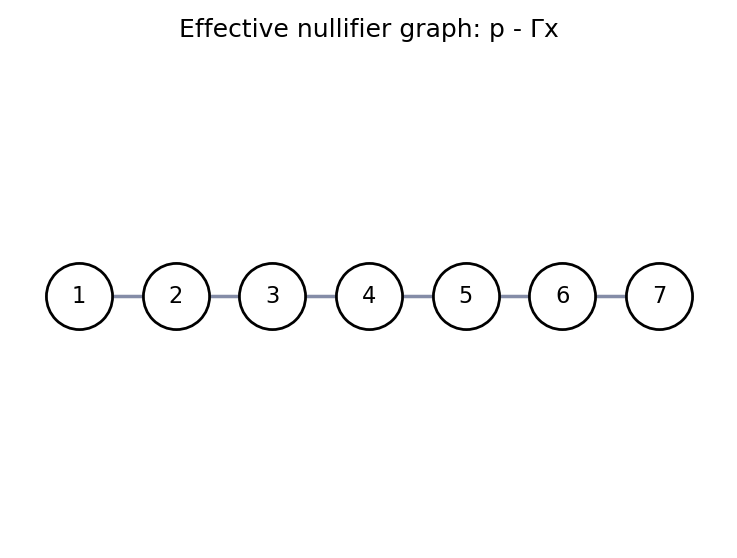

In [45]:
# Effective nullifier graph from V
V_xx = V[:m, :m]
V_xp = V[:m, m:]
V_px = V[m:, :m]
V_pp = V[m:, m:]

# nullfier 1 -> delta1 = p - Gamma1 x 꼴인 경우
Gamma1 = V_px @ np.linalg.pinv(V_xx)
Vd1 = V_pp - Gamma1 @ V_xp - V_px @ Gamma1.T + Gamma1 @ V_xx @ Gamma1.T


# nullfier 2 -> delta2 = x - Gamma2 p 꼴인 경우
Gamma2 = V_xp @ np.linalg.pinv(V_pp)
Vd2 = V_xx - Gamma2 @ V_px - V_xp @ Gamma2.T + Gamma2 @ V_pp @ Gamma2.T

# choose better nullifier
if np.trace(Vd1) <= np.trace(Vd2):
    Gamma_eff = Gamma1
    V_delta = Vd1
    nullifier_type = "p - Γx"
else:
    Gamma_eff = Gamma2
    V_delta = Vd2
    nullifier_type = "x - Γp"

nullifier_var = np.diag(V_delta)




print("chosen:", nullifier_type)
# nullifier variances 출력
print("nullifier variances =", nullifier_var)

# check nullifier variances below vacuum
print("below vacuum:", nullifier_var < 1)

# 해당 nullifer variances로 나온 effective adjacency matrix 출력
print("Adj_eff =\n", Gamma_eff)


# plot the graph using the graph plotting function defined above 
# plot_graph_from_matrix (W=Gamma_eff, node_values=kurtosis같은 노드별 값(기본은 none), title=f"(제목)", pos=pos(기본은 none))
pos = plot_graph_from_matrix(
    Gamma_eff,
    node_values=None,
    title=f"Effective nullifier graph: {nullifier_type}",
    pos=  
    {
    0: (0.0, 0.0),
    1: (1.5, 0.0),
    2: (3, 0.0),
    3: (4.5, 0.0),
    4: (6, 0.0),
    5: (7.5, 0.0),
    6: (9, 0.0),
    }
)

## 2. Photon Subtraction on the graph

##### A Matrix for Photon Subtraction

Pi_g projector check: True
A_minus symmetric check: True
A_minus = 


,1,2,3,4,5,6,7,8,9,10,11,12,13,14
1,8.950,0.000,0.000,0.000,0.000,0.000,0.000,0.000,9.945,0.000,0.000,0.000,0.000,0.000
2,0.000,11.050,0.000,0.000,0.000,0.000,0.000,10.055,0.000,11.050,0.000,0.000,0.000,0.000
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
8,0.000,10.055,0.000,0.000,0.000,0.000,0.000,9.150,0.000,10.055,0.000,0.000,0.000,0.000
9,9.945,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.050,0.000,0.000,0.000,0.000,0.000
10,0.000,11.050,0.000,0.000,0.000,0.000,0.000,10.055,0.000,11.050,0.000,0.000,0.000,0.000


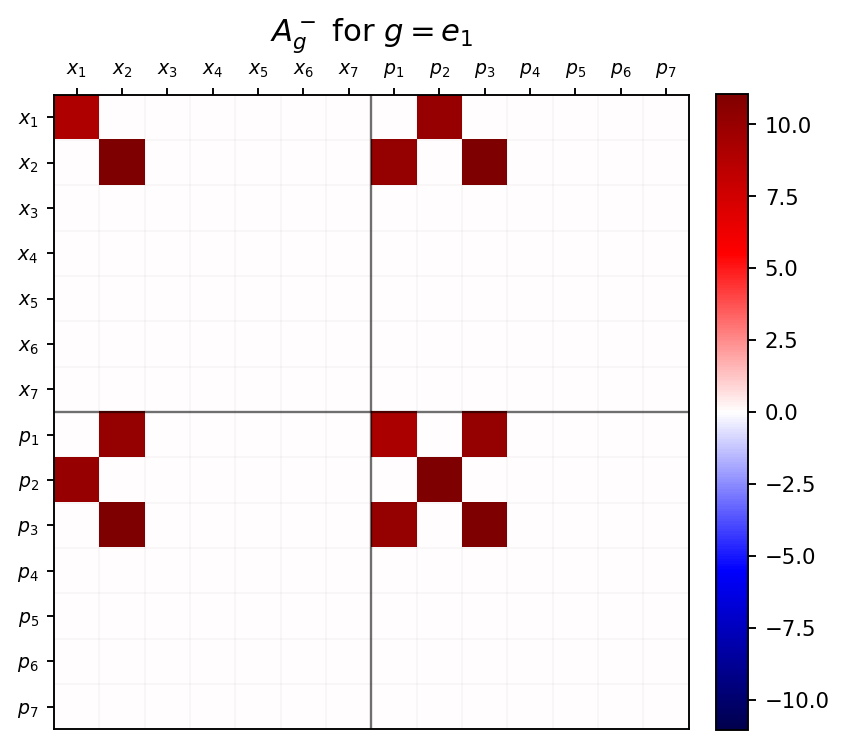

vmin=-11, vmax=11


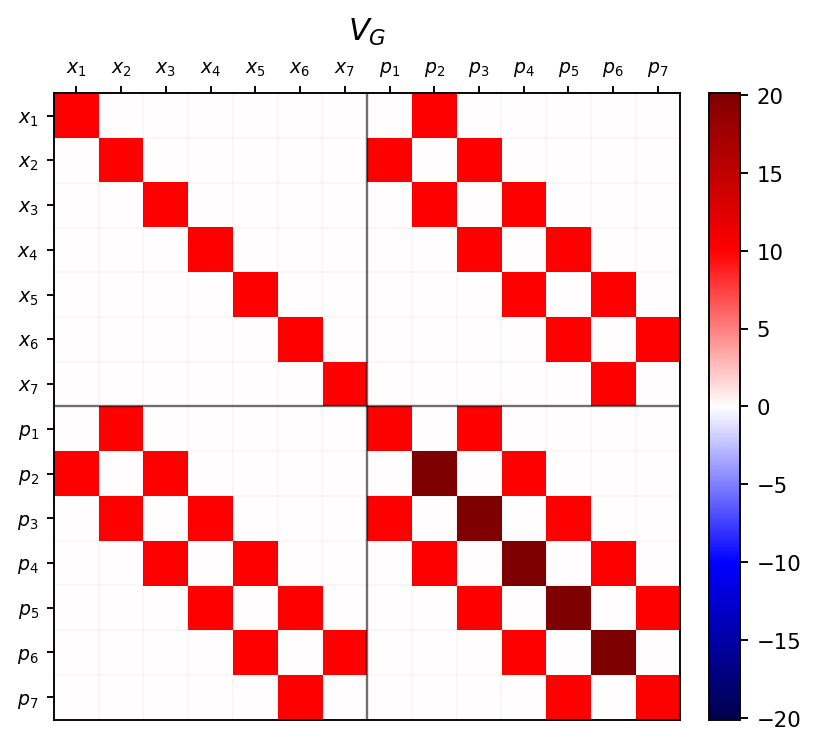

vmin=-20.1, vmax=20.1


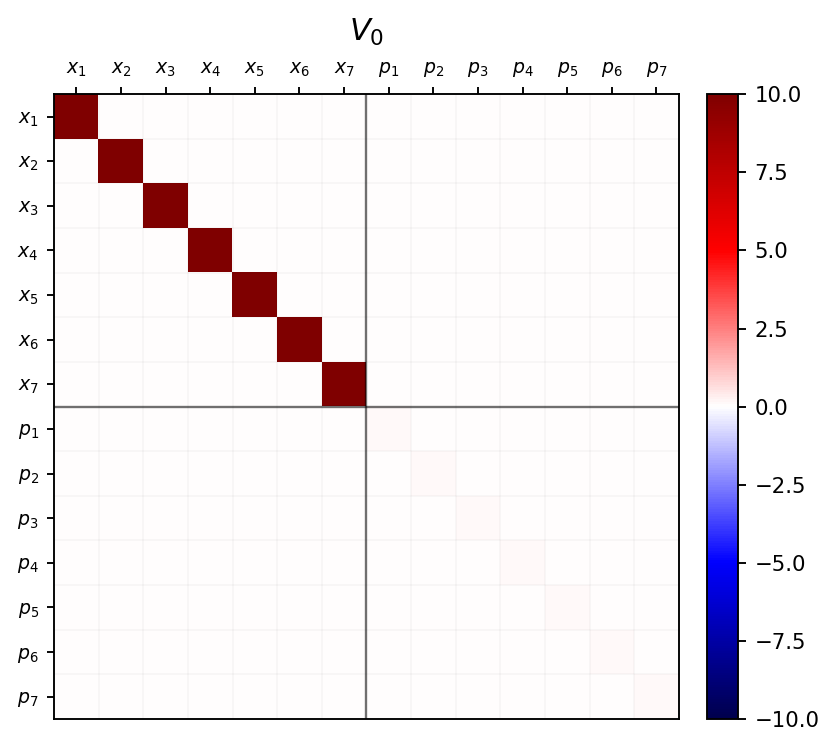

vmin=-10, vmax=10


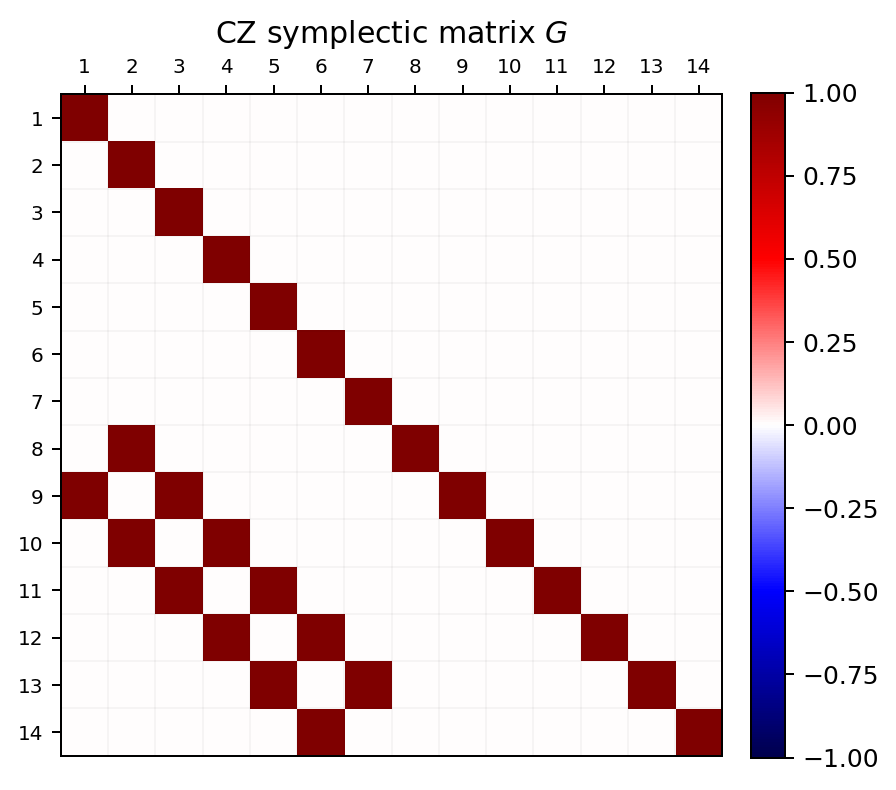

In [46]:
# A_minus matrix
# A_minus = 2 (V - I) Πg (V - I) / Tr[(V - I) Πg]

I_2m = np.eye(2 * m) # 2m x 2m identity matrix, m은 모드 수

denom = np.trace((V - I_2m) @ Pi_g) # 분모 계산, Tr[(V - I) Πg] , 이거의 4배값이 photon subtraction의 성공확률

# print("denom =", denom)
# 예외처리
if np.isclose(denom, 0):
    raise ValueError("denom is close to zero: photon subtraction mode may be vacuum-like.")

A_minus = 2 * (V - I_2m) @ Pi_g @ (V - I_2m) / denom

print("Pi_g projector check:", bool(np.linalg.norm(Pi_g @ Pi_g - Pi_g))<1e-10)
print("A_minus symmetric check:", bool(np.linalg.norm(A_minus - A_minus.T) < 1e-10))
#print("A_minus =\n", A_minus)
show_mat(A_minus, name="A_minus = ")

#draw_mat(A_minus, r"$A_g^-$")
draw_phase_matrix(
    A_minus,
    title = rf"$A_g^-$ for {sub_label}",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True,
    #vmax = 11, vmin = -11
)
draw_phase_matrix(
    V,
    title=r"$V_G$",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)
draw_phase_matrix(
    V0,
    title=r"$V_0$",
    positive=False,
    cmap="seismic",
    vmin = None,
    vmax = 10,
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)
draw_mat(G, title=r"CZ symplectic matrix $G$", cmap="seismic", label=False, digits=1,grid=True)

v_p = [10.1 20.1 20.1 20.1 20.1 20.1 10.1]
a_p = [ 9.15027624 11.04972376 11.04972376  0.          0.          0.
  0.        ]
K_ex_p = [-0.67782211 -0.37749891 -0.37749891 -0.         -0.         -0.
 -0.        ]


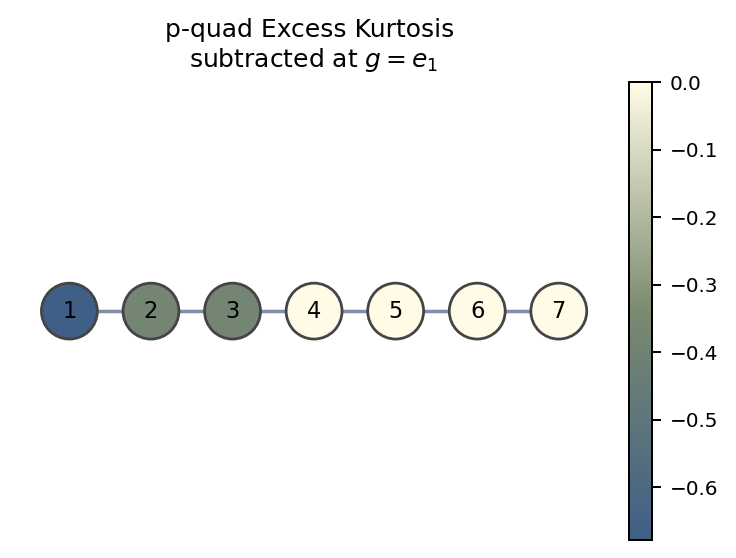

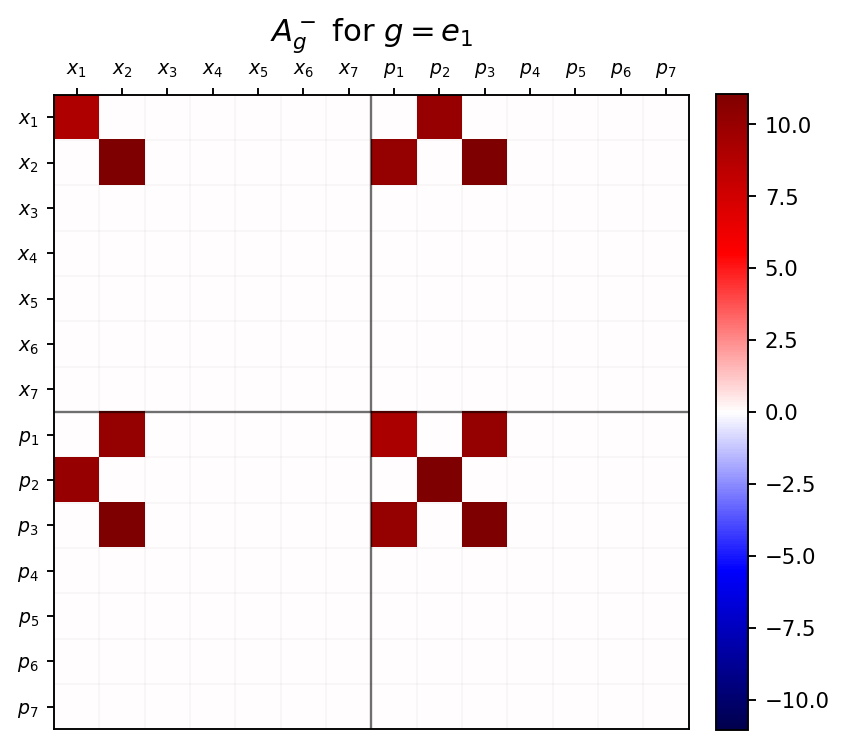

vmin=-11, vmax=11
v_x = [10. 10. 10. 10. 10. 10. 10.]
a_x = [ 8.95027624 11.04972376  0.          0.          0.          0.
  0.        ]
K_ex_x = [-0.66921096 -0.82666832 -0.         -0.         -0.         -0.
 -0.        ]


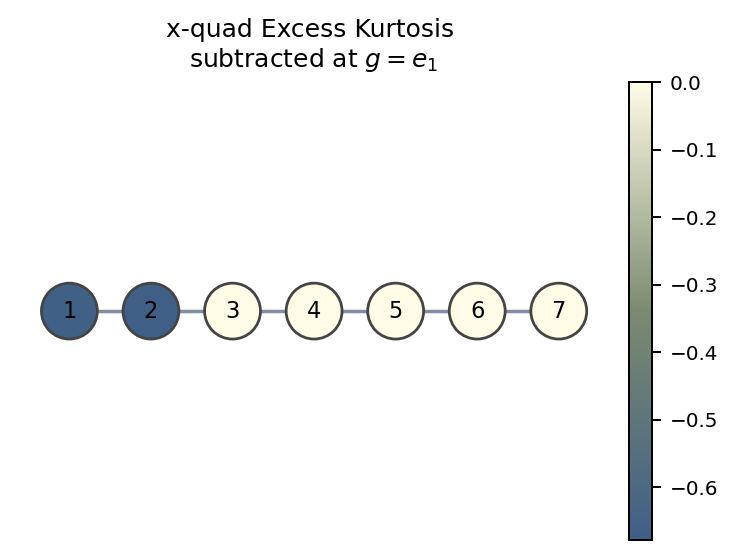

In [47]:
# Node-wise p-quadrature excess kurtosis
x_indices = np.arange(0, m)  # x-quadrature는 phase space 벡터의 앞쪽 m개 요소

v_x = np.diag(V)[x_indices]
a_x = np.diag(A_minus)[x_indices]

K_ex_x = -3 * (a_x ** 2) / ((v_x + a_x) ** 2)

p_indices = np.arange(m, 2 * m) # p-quadrature는 phase space 벡터의 뒤쪽 m개 요소에 해당하므로, 인덱스가 m부터 2m-1까지인 부분을 선택

v_p = np.diag(V)[p_indices] # photon subtraction 전의 p-quadrature variance, V 행렬의 뒤쪽 m개 대각 원소에 해당
a_p = np.diag(A_minus)[p_indices] # photon subtraction으로 인한 p-quadrature variance 변화량, A_minus 행렬의 뒤쪽 m개 대각 원소에 해당

K_ex_p = -3 * (a_p ** 2) / ((v_p + a_p) ** 2) # <Q(f)^k>_T를 통해 excess kurtosis p-quadrature 계산, 

print("v_p =", v_p)
print("a_p =", a_p)
print("K_ex_p =", K_ex_p)

pos = plot_graph_from_matrix(
    Gamma_eff,
    node_values=K_ex_p,
    title=f"p-quad Excess Kurtosis \nsubtracted at {sub_label}",
    pos=pos,
    draw_labels=True,
    vmax=-0.0, vmin=-0.6778221137904276
)

draw_phase_matrix(
    A_minus,
    title = rf"$A_g^-$ for {sub_label}",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)

print("v_x =", v_x)
print("a_x =", a_x)
print("K_ex_x =", K_ex_x)

pos = plot_graph_from_matrix(
    Gamma_eff,
    node_values=K_ex_x,
    title=f"x-quad Excess Kurtosis \nsubtracted at {sub_label}",
    pos=pos,
    draw_labels=True,
    vmax=-0.0,
    vmin=-0.6778221137904276
)

##### Additional Analysis - Wigner negativity

In [48]:
def reduced_matrices(V, A, subset, m):
    """
    V, A: full 2m x 2m matrices
    subset: list of mode indices,
            e.g. [1] for node 1, [1, 3, 6] for nodes 1,3,6
    m: number of modes
    """
    subset = np.array(subset, dtype=int)-1

    inds = np.concatenate([subset, m + subset])

    V_sub = V[np.ix_(inds, inds)]
    A_sub = A[np.ix_(inds, inds)]

    return V_sub, A_sub, inds

In [49]:
V_k, A_k, inds = reduced_matrices(V, A_minus, subset=[1,3,6], m=m) # node 1에 해당하는 mode만 남긴 reduced matrix, subset=[1]은 node 1을 의미, m은 전체 모드 수

show_mat(V_k)
show_mat(A_k)

M


,1,2,3,4,5,6
1,10.000,0.000,0.000,0.000,0.000,0.000
2,0.000,10.000,0.000,0.000,0.000,0.000
3,0.000,0.000,10.000,0.000,0.000,0.000
4,0.000,0.000,0.000,10.100,10.000,0.000
5,0.000,0.000,0.000,10.000,20.100,0.000
6,0.000,0.000,0.000,0.000,0.000,20.100


M


,1,2,3,4,5,6
1,8.950,0.000,0.000,0.000,0.000,0.000
2,0.000,0.000,0.000,0.000,0.000,0.000
3,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,9.150,10.055,0.000
5,0.000,0.000,0.000,10.055,11.050,0.000
6,0.000,0.000,0.000,0.000,0.000,0.000


In [50]:
def nodewise_negativity_quantities(V, A, m):
    N_vals = np.zeros(m)   # N_k = Tr(V_k^{-1} A_k)
    W0_vals = np.zeros(m)  # W_k(0)

    for k in range(1, m + 1):   # 1-indexed node label
        V_k, A_k, _ = reduced_matrices(V, A, [k], m)

        N_k = np.trace(np.linalg.inv(V_k) @ A_k)
        W0_k = (2 - N_k) / (2 * (2 * np.pi) * np.sqrt(np.linalg.det(V_k)))

        N_vals[k - 1] = N_k
        W0_vals[k - 1] = W0_k

    return N_vals, W0_vals

min W0_vals = 0.0015757677038904002


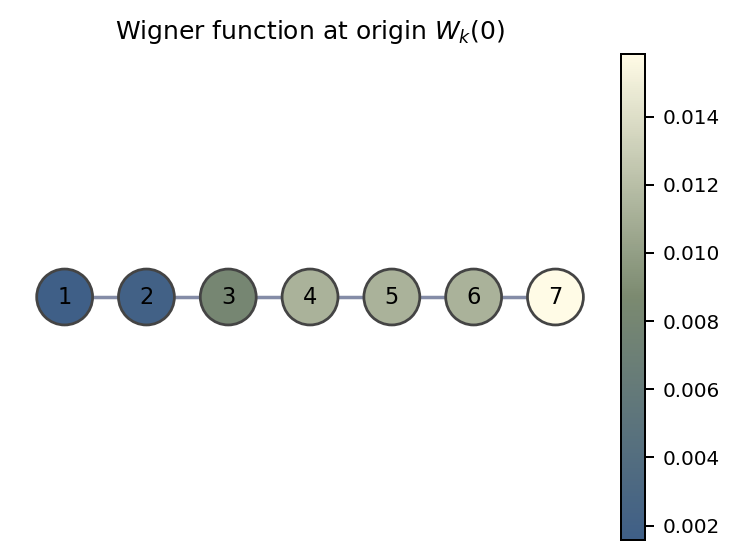

In [51]:
N_vals, W0_vals = nodewise_negativity_quantities(V, A_minus, m)

#print("N_vals =", N_vals)
#print("W0_vals =", W0_vals)
print("min W0_vals =", np.min(W0_vals))
# plot_graph_from_matrix(
#     Adj,
#     node_values=W0_vals,
#     title="Wigner function at origin $W_k(0)$",
#     pos=pos,
#     cmap="nipy_spectral", 
#     vmin=np.min(W0_vals),
#     draw_labels=True
# )



pos = plot_graph_from_matrix(
    Adj,
    node_values=W0_vals,
    title="Wigner function at origin $W_k(0)$",
    pos=pos,
    draw_labels=True
)

In [52]:
def nodewise_gaussian_wigner_origin(V, m):
    WG0 = np.zeros(m)

    for k in range(1, m + 1):
        V_k, _, _ = reduced_matrices(V, np.zeros_like(V), subset=[k], m=m)
        WG0[k - 1] = 1 / ((2 * np.pi) * np.sqrt(np.linalg.det(V_k)))

    return WG0

##### Ploting Wigner function

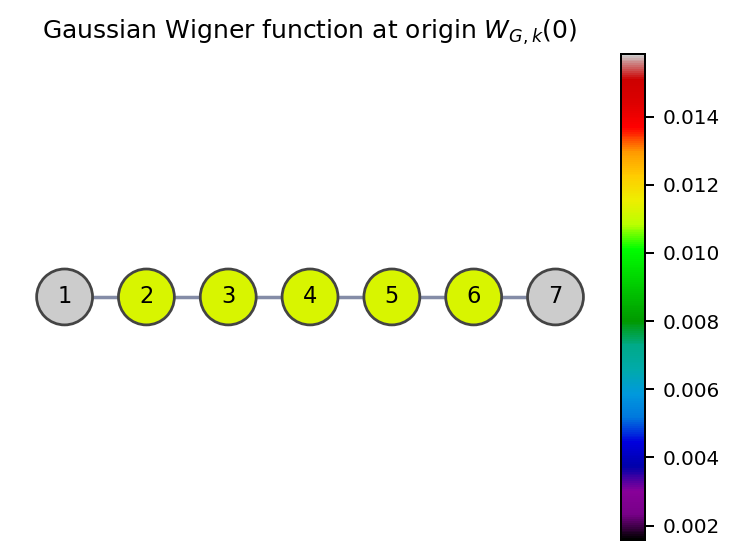

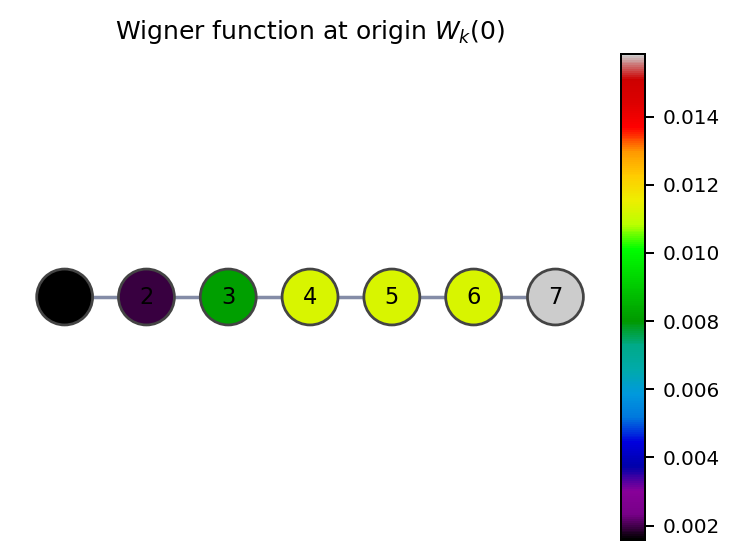

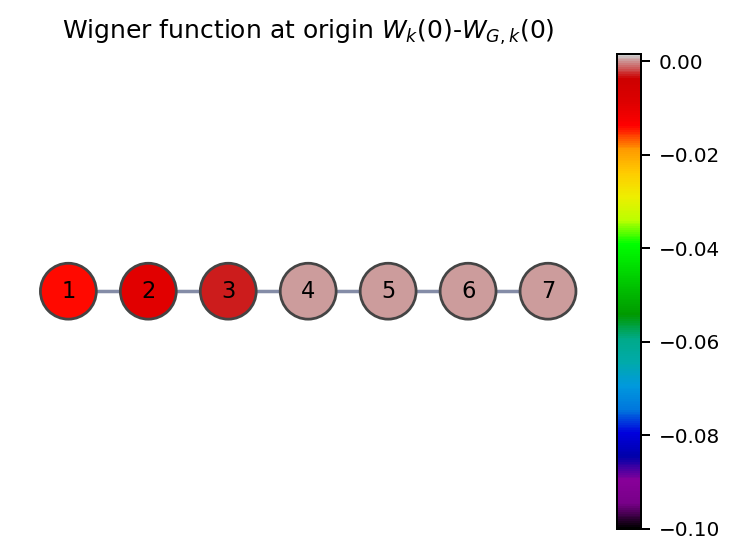

{0: (0.0, 0.0),
 1: (1.5, 0.0),
 2: (3, 0.0),
 3: (4.5, 0.0),
 4: (6, 0.0),
 5: (7.5, 0.0),
 6: (9, 0.0)}

In [53]:
WG0_vals = nodewise_gaussian_wigner_origin(V, m)

pos = plot_graph_from_matrix(
    Adj,
    node_values=WG0_vals,
    cmap="nipy_spectral",
    pos=pos,
    draw_labels=True,
    vmin=np.min(W0_vals),
    title=r"Gaussian Wigner function at origin $W_{G,k}(0)$"
)
plot_graph_from_matrix(
    Adj,
    node_values=W0_vals,
    title="Wigner function at origin $W_k(0)$",
    pos=pos,
    cmap="nipy_spectral", 
    vmin=np.min(W0_vals),
    draw_labels=True
)
plot_graph_from_matrix(
    Adj,
    node_values=W0_vals-WG0_vals,
    title="Wigner function at origin $W_k(0)$-$W_{G,k}(0)$",
    pos=pos,
    cmap="nipy_spectral", 
    vmin=np.min(W0_vals),
    draw_labels=True
)

In [54]:
# Common Wigner plotting utilities.
# Run this cell once, then use the output cell below.

from matplotlib.colors import Normalize, TwoSlopeNorm
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Gaussian Wigner function을 그리기 위해 범위를 지정하고, Gaussian Wigner function 값 계산
def gaussian_wigner_grid(V_k, xlim=10, n=100):
    x = np.linspace(-xlim, xlim, n)
    p = np.linspace(-xlim, xlim, n)
    X, P = np.meshgrid(x, p)
    R = np.stack([X, P], axis=-1)

    V_inv = np.linalg.inv(V_k)
    det_V = np.linalg.det(V_k)
    quad = np.einsum("...i,ij,...j->...", R, V_inv, R)
    W = np.exp(-0.5 * quad) / ((2 * np.pi) * np.sqrt(det_V))

    return X, P, W

# Photon-subtracted Wigner function을 그리기 범위를 지정하고 Photon-subtracted Wigner function 값 계산
def photon_subtracted_wigner_grid(V_k, A_k, xlim=10, n=100):
    X, P, W_gauss = gaussian_wigner_grid(V_k, xlim=xlim, n=n)
    R = np.stack([X, P], axis=-1)

    V_inv = np.linalg.inv(V_k)
    B = V_inv @ A_k @ V_inv
    quad_A = np.einsum("...i,ij,...j->...", R, B, R)
    trace_A = np.trace(V_inv @ A_k)
    W_minus = 0.5 * (quad_A - trace_A + 2) * W_gauss

    return X, P, W_minus

# 앞에서 구한 V와 A_minus 행렬을 single node로 reduce한 후, 해당 x,p,W를 위의 함수로 구한 후 위에서 지정한 범위내에서 최대, 최소를 계산하여 zlim으로 반환하는 함수
def node_wigner_data(V, A, node, m, xlim=10, n=100):
    V_k, A_k, _ = reduced_matrices(V, A, subset=[node], m=m)
    X, P, W_before = gaussian_wigner_grid(V_k, xlim=xlim, n=n)
    _, _, W_after = photon_subtracted_wigner_grid(V_k, A_k, xlim=xlim, n=n)

    z_min = min(np.min(W_before), np.min(W_after))
    z_max = max(np.max(W_before), np.max(W_after))
    z_pad = 0.05 * (z_max - z_min) if not np.isclose(z_min, z_max) else 1e-3
    zlim = (z_min - z_pad, z_max + z_pad)

    return X, P, W_before, W_after, zlim

# Wigner function의 색상 범위를 W의 최소값과 최대값에 따라 자동으로 조절하는 norm 객체를 반환하는 함수, TwoSlopeNorm은 W가 음수와 양수 모두를 포함할 때 0을 중심으로 색상을 조절하는 데 사용되고, Normalize는 W가 모두 양수이거나 모두 음수일 때 사용된다.
# TwoSlopeNorm가 하는 일은 양수일 때와 음수일 때 색상이 다른 그라데이션, Normalize는 양수이거나 음수일 때 중심값 기준으로 다른 그라데이션이 되게 설정해줌
def wigner_color_norm(W):
    w_min = np.min(W)
    w_max = np.max(W)

    if w_min < 0 < w_max:
        return TwoSlopeNorm(vmin=w_min, vcenter=0, vmax=w_max)

    return Normalize(vmin=w_min, vmax=w_max)

# Wigner function을 3D surface plot으로 그리는 함수, zero_plane이 True이면 W=0인 평면도 같이 그려준다.
# 함수 설명 ax: 3D plot이 그려질 matplotlib 축 객체, ax.plot_surface라는 메소드는 3D surface plot을 그리는 메소드이며, ax.countour는 등고선을 그리는 메소드이다. 
# 나중에 plt.figure로 figure 객체를 만들고, fig.add_subplot(1, 2, 1, projection="3d")같이 3D 축 객체를 따로 정의해서 만들고 이 함수를 호출하면 된다.
# 이후 이 객체(3D_subfigure)에 대해서 제목, 축 레이블, 시점 등을 설정할 수 있다. set_zlim은 혹여나 W의 범위가 너무 크거나 작아서 그래프가 잘 안보이는 경우 z축 범위를 수동으로 설정할 때 사용한다.

def plot_wigner_surface_static(ax, X, P, W, title, cmap="inferno", zlim=None, zero_plane=True):
    norm = wigner_color_norm(W)
    ax.plot_surface(X, P, W, cmap=cmap, norm=norm, linewidth=0, antialiased=True)

    if zero_plane and zlim is not None and zlim[0] < 0 < zlim[1]:
        Z0 = np.zeros_like(W)
        ax.plot_surface(X, P, Z0, color="black", alpha=0.12, linewidth=0, shade=False)
        ax.contour(X, P, W, levels=[0], zdir="z", offset=0, colors="black", linewidths=1.1)

    ax.contour(X, P, W, zdir="z", offset=np.min(W), cmap=cmap, linewidths=0.7)
    ax.set_title(f"{title}\nmin={np.min(W):.3g}, max={np.max(W):.3g}")
    ax.set_xlabel("x")
    ax.set_ylabel("p")
    ax.set_zlabel("W")
    ax.view_init(elev=24, azim=-38) # 시점 설정, elev은 z축에 대한 높이, azim은 x축에 대한 회전 각도

    if zlim is not None:
        ax.set_zlim(*zlim)


# 위에서 wigner_surface를 matplotlib으로는 그리는 함수를 호출하는 함수이다. 이때 figure안에 두 sub 객체를 만들어 왼쪽은 Gaussian Wigner function, 오른쪽은 photon-subtracted Wigner function이 그려지게 된다. 
# cmap_before와 cmap_after는 각각 Gaussian Wigner function과 photon-subtracted Wigner function의 색상 맵을 지정하는 인자이다. (가우시안은 항상 양수이니 viridis, photon-subtracted는 양수/음수 모두 나올 수 있으니 coolwarm같은 colormap을 사용)


def plot_node_wigner_3d_static(V, A, node, m, xlim=10, n=100, cmap_before="viridis", cmap_after="coolwarm"):
    X, P, W_before, W_after, zlim = node_wigner_data(V, A, node, m, xlim=xlim, n=n)

    fig = plt.figure(figsize=(14, 5.2))
    ax1 = fig.add_subplot(1, 2, 1, projection="3d")
    ax2 = fig.add_subplot(1, 2, 2, projection="3d")

    plot_wigner_surface_static(ax1, X, P, W_before, f"node {node}: before subtraction", cmap=cmap_before, zlim=zlim, zero_plane=False)
    plot_wigner_surface_static(ax2, X, P, W_after, f"node {node}: after subtraction", cmap=cmap_after, zlim=zlim)

    fig.subplots_adjust(left=0.02, right=0.98, bottom=0.02, top=0.88, wspace=0.04)
    plt.show()

# 위와는 다르게 정적이지 않고 직접 그래프를 회전 시키면서 볼 수 있게 plotly로 그리는 함수이다.
# plotly의 make_subplots 함수를 사용하여 figure 안에 2개의 subplot을 만들고, 각각에 go.Surface를 사용하여 Wigner function의 surface plot을 그린다.(기본 작동원리는 matplotlib처럼 x,y,z축 데이터를 받아 그림)
# 차이점은 figure객체를 정의하는 방식과 plot_surface 대신 go.Surface를 사용한다는 점이다.(go.Surface는 plotly에서 3D surface plot을 그리는 메소드이다.)
# 자세한건 plotly 공식문서의 go.Surface와 make_subplots 설명 참고: https://plotly.com/python/3d-surface-plots/ , https://plotly.com/python/subplots/
def plot_node_wigner_3d_interactive(V, A, node, m, xlim=10, n=100):
    X, P, W_before, W_after, _ = node_wigner_data(V, A, node, m, xlim=xlim, n=n)

    after_abs = max(abs(np.min(W_after)), abs(np.max(W_after)))
    if np.isclose(after_abs, 0):
        after_abs = 1

    fig = make_subplots(
        rows=1,
        cols=2,
        specs=[[{"type": "surface"}, {"type": "surface"}]],
        subplot_titles=(
            f"node {node}: before subtraction<br>min={np.min(W_before):.3g}, max={np.max(W_before):.3g}",
            f"node {node}: after subtraction<br>min={np.min(W_after):.3g}, max={np.max(W_after):.3g}"
        ),
        horizontal_spacing=0.02
    )

    fig.add_trace(
        go.Surface(x=X, y=P, z=W_before, colorscale="Viridis", showscale=False),
        row=1,
        col=1
    )

    fig.add_trace(
        go.Surface(
            x=X,
            y=P,
            z=W_after,
            colorscale="RdBu_r",
            cmin=-after_abs,
            cmax=after_abs,
            showscale=True,
            colorbar=dict(title="W", x=1.02, len=0.75)
        ),
        row=1,
        col=2
    )

    fig.add_trace(
        go.Surface(
            x=X,
            y=P,
            z=np.zeros_like(W_after),
            surfacecolor=np.zeros_like(W_after),
            colorscale=[[0, "black"], [1, "black"]],
            opacity=0.18,
            showscale=False,
            hoverinfo="skip"
        ),
        row=1,
        col=2
    )

    camera = dict(eye=dict(x=0.8, y=1.8, z=0.8))
    scene_style = dict(
        xaxis_title="x",
        yaxis_title="p",
        zaxis_title="W",
        camera=camera,
        aspectmode="cube"
    )

    fig.update_layout(
        width=1150,
        height=560,
        margin=dict(l=0, r=0, t=60, b=0),
        scene=scene_style,
        scene2=scene_style
    )

    fig.show()


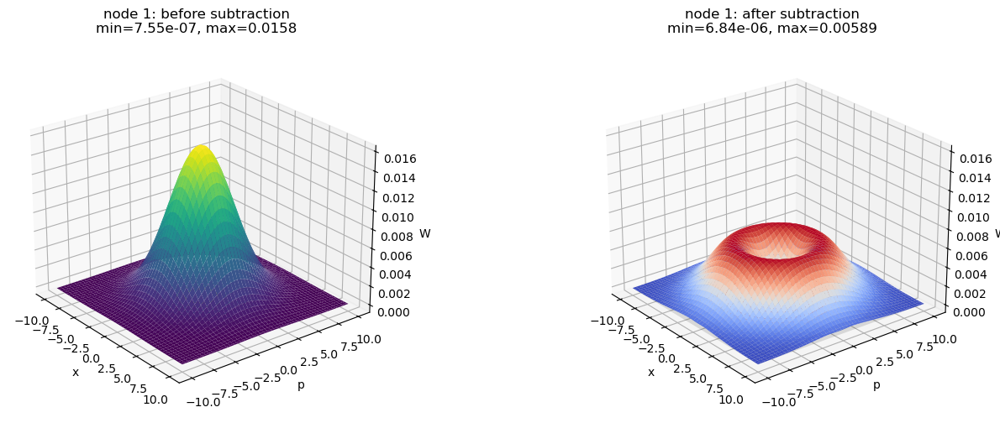

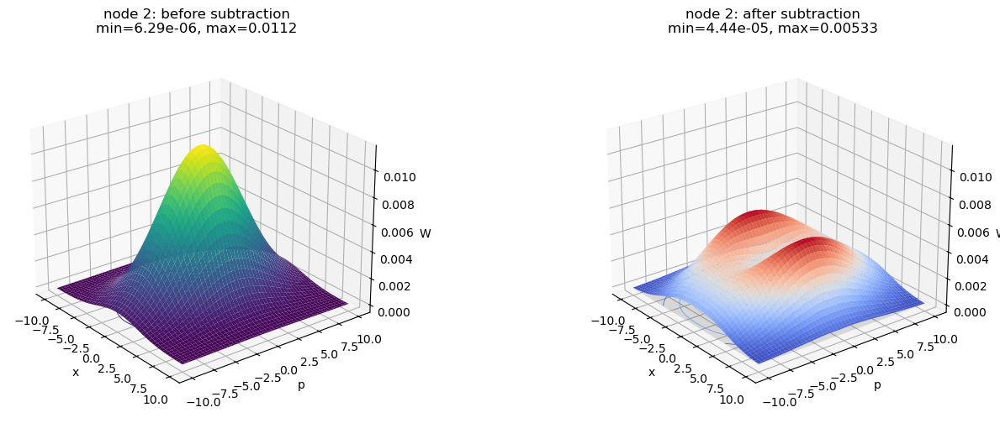

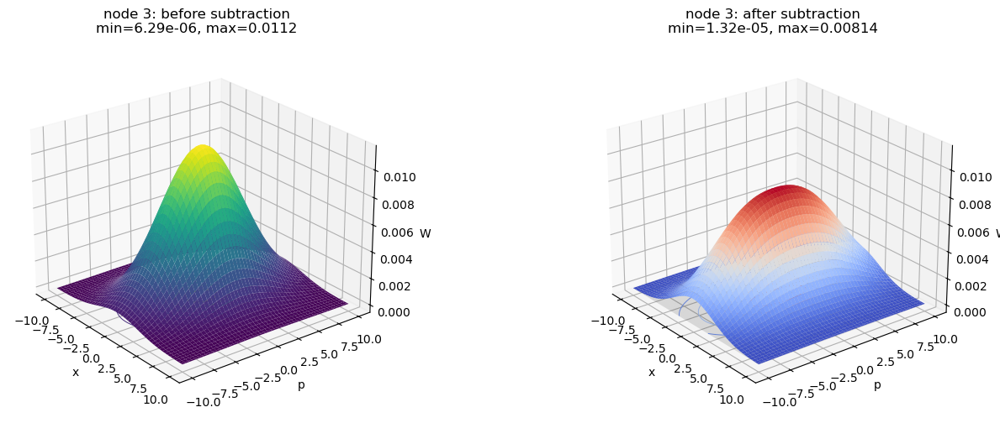

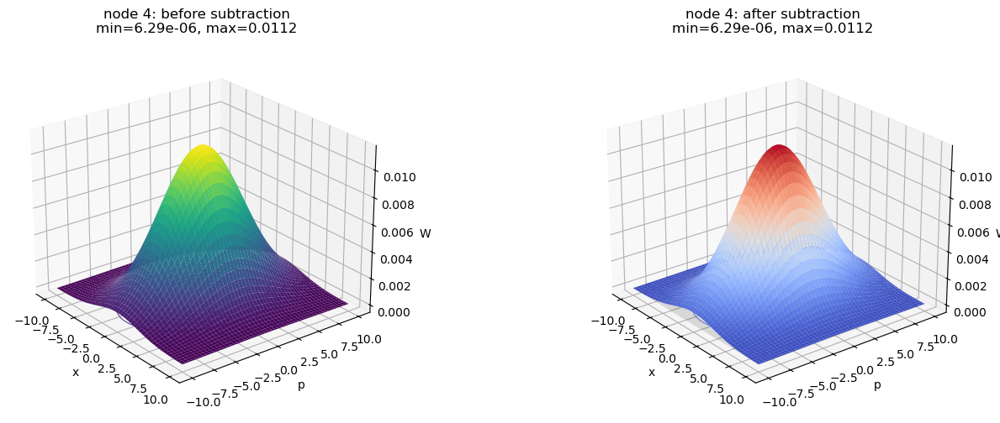

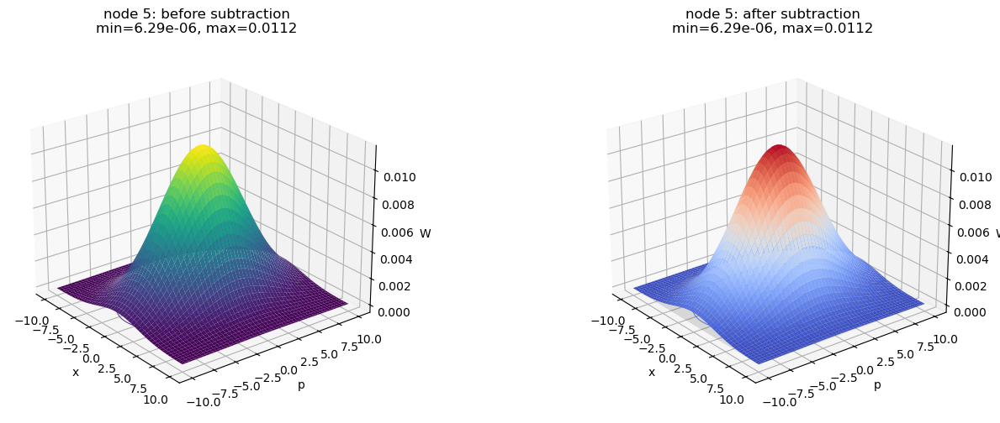

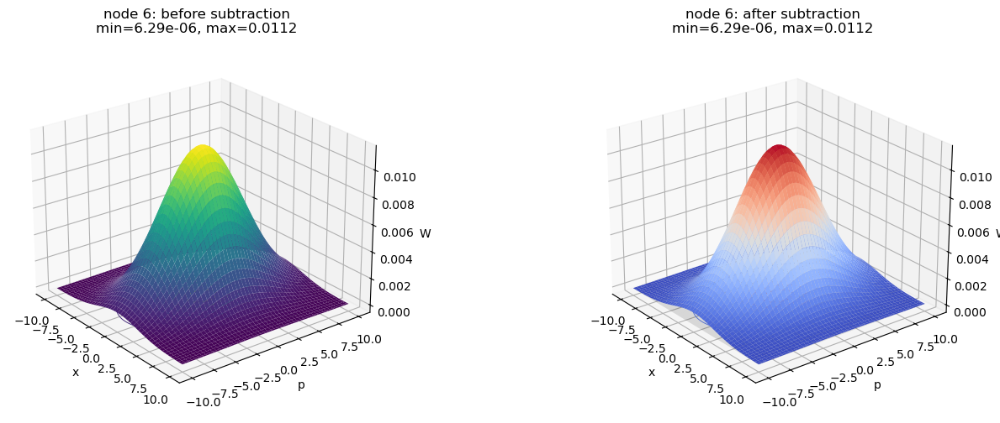

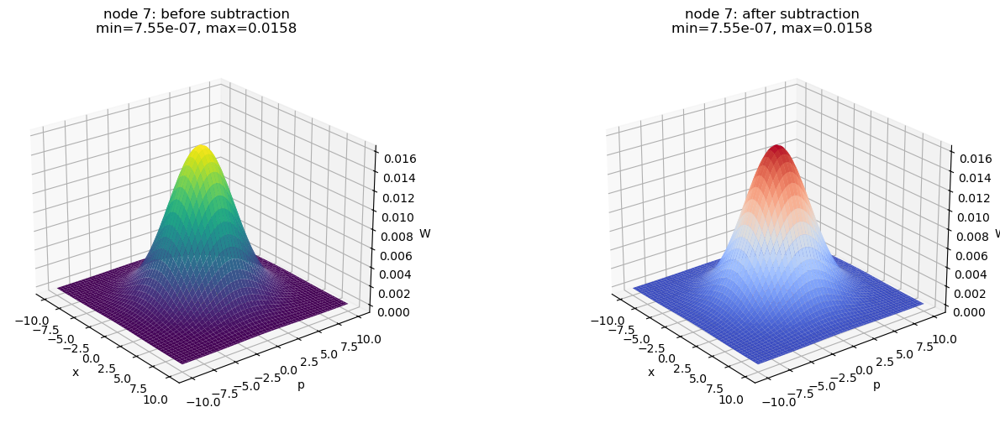

In [55]:

# 1부터 m까지의 노드에 대해, plot_static이 True이면 정적 3D plot을 그리고, plot_interactive이 True이면 인터랙티브 3D plot을 그린다. 
nodes_to_plot = range(1, m + 1)
plot_static = True
plot_interactive = False#True

# 노드별로 그리기 위해서 다음과 같이 정의
for node in nodes_to_plot:
    if plot_static:
        plot_node_wigner_3d_static(V, A_minus, node=node, m=m, xlim=10, n=100)

    if plot_interactive:
        plot_node_wigner_3d_interactive(V, A_minus, node=node, m=m, xlim=10, n=100)


## 3. Homodyne Measurement

####  3.1 Photon subtraction, and afterward, Neighborhood Deletion FeedFoward w/ x measurement(by HOMODYNE)

#####  Initial variable layer

In [56]:
# ============================================================
# 3.1.1 Initial variable layer
# Case a: photon subtraction 먼저 한 경우
# Corrected version: graph-nullifier feedforward
#
# IMPORTANT:
#   Use K_Gamma = [[0], [Gamma_RH]]
#   Do NOT use K_cm = V_qRxH V_xHxH^{-1}
#
# Existing variables:
#   m        : number of modes
#   V        : full Gaussian envelope matrix
#   A_minus  : full non-Gaussian correction matrix after photon subtraction
#   sub_node : photon-subtracted node label, 1-based
#   Gamma_eff or Adj : graph adjacency matrix
#
# ordering:
#   q = (x1,...,xm,p1,...,pm)
# ============================================================

import numpy as np

# ------------------------------------------------------------
# User input
# ------------------------------------------------------------
H = [1]          # deleted / homodyne-measured nodes, 1-based
j = sub_node           # photon-subtracted node, 1-based

# ------------------------------------------------------------
# Use already-defined A_minus
# ------------------------------------------------------------
A_j = A_minus

# ------------------------------------------------------------
# Choose graph adjacency matrix
# ------------------------------------------------------------
if "Gamma_eff" in globals():
    Gamma = Gamma_eff
elif "Adj" in globals():
    Gamma = Adj
else:
    raise NameError("Need graph adjacency matrix: Gamma_eff or Adj")

# ------------------------------------------------------------
# Convert to 0-based node indices
# ------------------------------------------------------------
H0 = np.array([h - 1 for h in H], dtype=int)
j0 = j - 1

R0 = np.array([n for n in range(m) if n not in H0], dtype=int)

r = len(R0)
h = len(H0)

print("H =", list(H0 + 1))
print("R =", list(R0 + 1))
print("photon-subtracted node j =", j)

# ------------------------------------------------------------
# Quadrature indices
# ordering: q = (x1,...,xm,p1,...,pm)
# ------------------------------------------------------------
xR_idx = R0
pR_idx = R0 + m
qR_idx = np.r_[xR_idx, pR_idx]

xH_idx = H0
pH_idx = H0 + m

# ------------------------------------------------------------
# Graph-nullifier feedforward gain
#
# Initial nullifier:
#   delta_R = p_R - Gamma_RR x_R - Gamma_RH x_H
#
# Feedforward:
#   p_R^ff = p_R - Gamma_RH x_H
#
# Therefore:
#   q_R^ff = q_R - K_Gamma x_H
#
# where:
#   K_Gamma = [ 0       ]
#             [ Gamma_RH]
# ------------------------------------------------------------
Gamma_RH = Gamma[np.ix_(R0, H0)]

K_Gamma = np.vstack([
    np.zeros((r, h)),
    Gamma_RH
])

print("Gamma_RH =")
print(Gamma_RH)
print("K_Gamma shape =", K_Gamma.shape)

# ------------------------------------------------------------
# Extract V blocks
# ------------------------------------------------------------
V_qRqR = V[np.ix_(qR_idx, qR_idx)]
V_qRxH = V[np.ix_(qR_idx, xH_idx)]
V_xHqR = V[np.ix_(xH_idx, qR_idx)]
V_xHxH = V[np.ix_(xH_idx, xH_idx)]

# ------------------------------------------------------------
# Correct Gaussian envelope after graph feedforward
#
# V_R_ff = L_Gamma V L_Gamma^T
#
# with
#   L_Gamma = ( I  -K_Gamma  0 )
#
# Block form:
#   V_R_ff
#   = V_qRqR
#     - K_Gamma V_xHqR
#     - V_qRxH K_Gamma^T
#     + K_Gamma V_xHxH K_Gamma^T
# ------------------------------------------------------------
V_R_ff = (
    V_qRqR
    - K_Gamma @ V_xHqR
    - V_qRxH @ K_Gamma.T
    + K_Gamma @ V_xHxH @ K_Gamma.T
)

V_R_ff = 0.5 * (V_R_ff + V_R_ff.T)

# ------------------------------------------------------------
# Extract A_minus blocks
# ------------------------------------------------------------
A_qRqR = A_j[np.ix_(qR_idx, qR_idx)]
A_qRxH = A_j[np.ix_(qR_idx, xH_idx)]
A_xHqR = A_j[np.ix_(xH_idx, qR_idx)]
A_xHxH = A_j[np.ix_(xH_idx, xH_idx)]

# ------------------------------------------------------------
# Correct non-Gaussian correction after graph feedforward
#
# A_R_ff = L_Gamma A_minus L_Gamma^T
# ------------------------------------------------------------
A_R_ff = (
    A_qRqR
    - K_Gamma @ A_xHqR
    - A_qRxH @ K_Gamma.T
    + K_Gamma @ A_xHxH @ K_Gamma.T
)

A_R_ff = 0.5 * (A_R_ff + A_R_ff.T)

# ------------------------------------------------------------
# Actual second moment of the final non-Gaussian state
# ------------------------------------------------------------
V_actual_R_ff = V_R_ff + A_R_ff

# ------------------------------------------------------------
# Target node local index
# If photon-subtracted node is deleted, j_local is None.
# ------------------------------------------------------------
if j0 in R0:
    j_local = int(np.where(R0 == j0)[0][0])
    print("target node remains.")
    print("target original node =", j)
    print("target local node =", j_local + 1)
else:
    j_local = None
    print("target photon-subtracted node is deleted.")

# ------------------------------------------------------------
# Checks
# ------------------------------------------------------------
print("V_R_ff shape =", V_R_ff.shape)
print("A_R_ff shape =", A_R_ff.shape)
print("V_actual_R_ff shape =", V_actual_R_ff.shape)

print("V_R_ff symmetric check:",
      bool(np.linalg.norm(V_R_ff - V_R_ff.T) < 1e-10))

print("A_R_ff symmetric check:",
      bool(np.linalg.norm(A_R_ff - A_R_ff.T) < 1e-10))

print("V_actual_R_ff symmetric check:",
      bool(np.linalg.norm(V_actual_R_ff - V_actual_R_ff.T) < 1e-10))

H = [1]
R = [2, 3, 4, 5, 6, 7]
photon-subtracted node j = 1
Gamma_RH =
[[1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]
K_Gamma shape = (12, 1)
target photon-subtracted node is deleted.
V_R_ff shape = (12, 12)
A_R_ff shape = (12, 12)
V_actual_R_ff shape = (12, 12)
V_R_ff symmetric check: True
A_R_ff symmetric check: True
V_actual_R_ff symmetric check: True


In [57]:
def make_reduced_pos_and_labels(pos_full, R0, label_base=1):
    """
    pos_full : original graph position dict
               예: {0:(...), 1:(...), ..., 5:(...)}
    R0       : remaining nodes in 0-based original indexing
               예: original nodes [2,5,6]이면 R0 = [1,4,5]
    label_base : display label offset. 1이면 원래 node label을 1-based로 표시.

    Returns
    -------
    pos_R    : reduced graph position dict
               keys = 0,1,2,... local reduced indices
    labels_R : reduced graph labels
               keys = 0,1,2,..., values = original node labels
    """
    R0 = list(R0)

    pos_R = {
        local_idx: pos_full[int(orig_idx)]
        for local_idx, orig_idx in enumerate(R0)
    }

    labels_R = {
        local_idx: str(int(orig_idx) + label_base)
        for local_idx, orig_idx in enumerate(R0)
    }

    return pos_R, labels_R

##### A<sub>R</sub><sup>ff</sup>, V<sub>R</sub><sup>ff</sup> matrix layer

Deleted nodes H = [1]
Remaining nodes R = [2, 3, 4, 5, 6, 7]
photon-subtracted node j = 1
Number of remaining modes = 6
V_R_ff shape = (12, 12)
A_R_ff shape = (12, 12)
V_actual_R_ff shape = (12, 12)
V_R_ff symmetric check: True
A_R_ff symmetric check: True
V_actual_R_ff symmetric check: True
V_R^{ff} = 


,1,2,3,4,5,6,7,8,9,10,11,12
1,10.000,0.000,0.000,0.000,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000
2,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000,0.000,0.000
3,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000,0.000
4,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000
5,0.000,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000
6,0.000,0.000,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000
7,0.000,10.000,0.000,0.000,0.000,0.000,10.100,0.000,10.000,0.000,0.000,0.000
8,10.000,0.000,10.000,0.000,0.000,0.000,0.000,20.100,0.000,10.000,0.000,0.000
9,0.000,10.000,0.000,10.000,0.000,0.000,10.000,0.000,20.100,0.000,10.000,0.000
10,0.000,0.000,10.000,0.000,10.000,0.000,0.000,10.000,0.000,20.100,0.000,10.000


(A_g^-)_R^{ff} = 


,1,2,3,4,5,6,7,8,9,10,11,12
1,11.050,0.000,0.000,0.000,0.000,0.000,0.000,11.050,0.000,0.000,0.000,0.000
2,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
5,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
7,0.000,0.000,0.000,0.000,0.000,0.000,0.110,0.000,0.000,0.000,0.000,0.000
8,11.050,0.000,0.000,0.000,0.000,0.000,0.000,11.050,0.000,0.000,0.000,0.000
9,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
10,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


V_actual,R^{ff} = V_R^{ff} + (A_g^-)_R^{ff} = 


,1,2,3,4,5,6,7,8,9,10,11,12
1,21.050,0.000,0.000,0.000,0.000,0.000,0.000,21.050,0.000,0.000,0.000,0.000
2,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000,0.000,0.000
3,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000,0.000
4,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000,0.000
5,0.000,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000,10.000
6,0.000,0.000,0.000,0.000,0.000,10.000,0.000,0.000,0.000,0.000,10.000,0.000
7,0.000,10.000,0.000,0.000,0.000,0.000,10.210,0.000,10.000,0.000,0.000,0.000
8,21.050,0.000,10.000,0.000,0.000,0.000,0.000,31.150,0.000,10.000,0.000,0.000
9,0.000,10.000,0.000,10.000,0.000,0.000,10.000,0.000,20.100,0.000,10.000,0.000
10,0.000,0.000,10.000,0.000,10.000,0.000,0.000,10.000,0.000,20.100,0.000,10.000


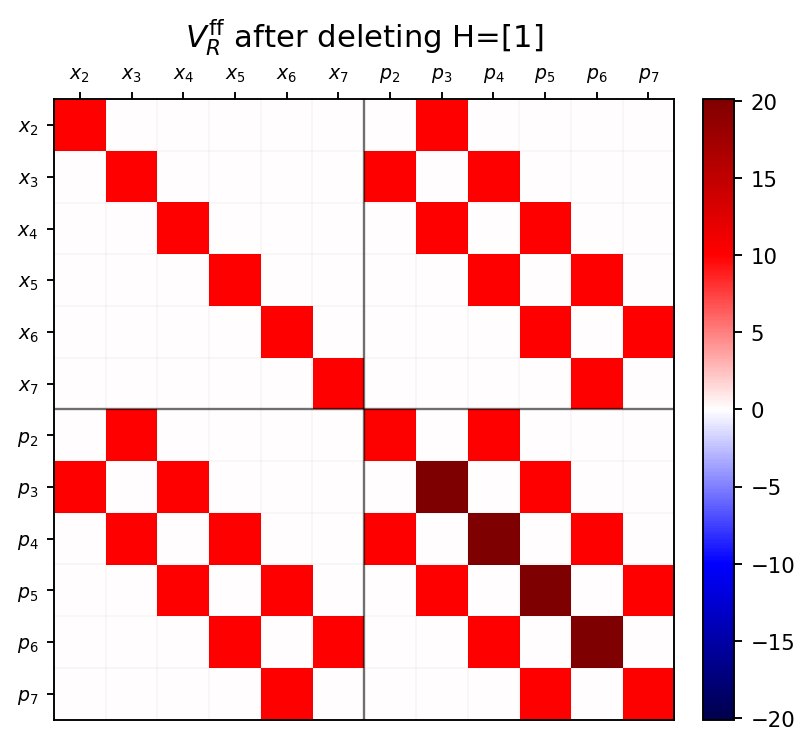

vmin=-20.1, vmax=20.1


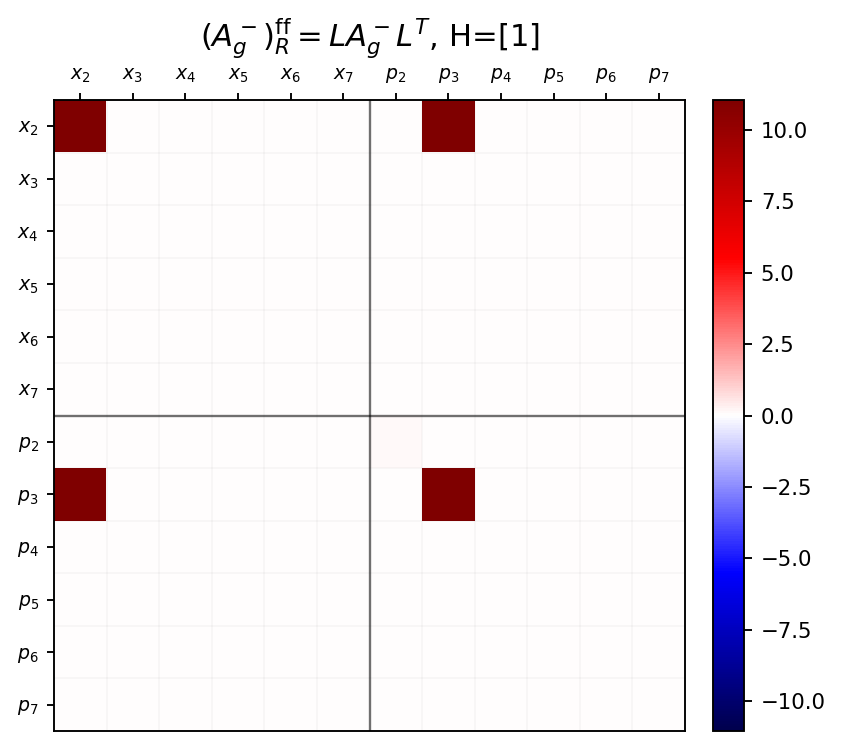

vmin=-11, vmax=11


In [58]:
# ============================================================
# 3.1.2 A_R, V_R matrix layer
# Case a: photon subtraction 먼저 한 경우
#
# Inputs from 3.1.1:
#   V_R_ff
#   A_R_ff
#   V_actual_R_ff
#   R0
#   H
#   j
# ============================================================

# -----------------------------
# Basic labels
# -----------------------------
R_labels = list(R0 + 1)  # 1-based node labels for display
r = len(R_labels)

print("Deleted nodes H =", H)
print("Remaining nodes R =", R_labels)
print("photon-subtracted node j =", j)
print("Number of remaining modes =", r)

# -----------------------------
# Matrix sanity checks
# -----------------------------
print("V_R_ff shape =", V_R_ff.shape)
print("A_R_ff shape =", A_R_ff.shape)
print("V_actual_R_ff shape =", V_actual_R_ff.shape)

print("V_R_ff symmetric check:", np.linalg.norm(V_R_ff - V_R_ff.T) < 1e-10)
print("A_R_ff symmetric check:", np.linalg.norm(A_R_ff - A_R_ff.T) < 1e-10)
print("V_actual_R_ff symmetric check:", np.linalg.norm(V_actual_R_ff - V_actual_R_ff.T) < 1e-10)

# -----------------------------
# Optional: print matrices numerically
# -----------------------------
show_mat(V_R_ff, name=r"V_R^{ff} = ")
show_mat(A_R_ff, name=r"(A_g^-)_R^{ff} = ")
show_mat(V_actual_R_ff, name=r"V_actual,R^{ff} = V_R^{ff} + (A_g^-)_R^{ff} = ")

# -----------------------------
# Draw Gaussian envelope covariance
# Mattia-style V matrix
# -----------------------------
# draw_phase_matrix(
#     V_R_ff,
#     title=rf"$V_R^{{\rm ff}}$ after deleting H={H}",
#     positive=False,
#     cmap="seismic",
#     tick_step=1,
#     figsize=(5, 4.5),
#     grid=True
# )

# -----------------------------
# Draw non-Gaussian correction matrix
# A_R_ff = L A_minus L^T
# -----------------------------
# draw_phase_matrix(
#     A_R_ff,
#     title=rf"$(A_g^-)_R^{{\rm ff}} = L A_g^- L^T$, H={H}",
#     positive=False,
#     cmap="seismic",
#     tick_step=1,
#     figsize=(5, 4.5),
#     grid=True
# )

# -----------------------------
# Draw actual covariance
# This is not Mattia's V.
# This is the actual second moment matrix of the non-Gaussian state.
# -----------------------------
# draw_phase_matrix(
#     V_actual_R_ff,
#     title=rf"$V_{{\rm actual,R}}^{{\rm ff}} = V_R^{{\rm ff}} + (A_g^-)_R^{{\rm ff}}$",
#     positive=False,
#     cmap="seismic",
#     tick_step=1,
#     figsize=(5, 4.5),
#     grid=True
# )



# mode_labels로 원래 노드 번호(1-based)를 전달해서 라벨을 x2,x5,x6 / p2,p5,p6로 표시
draw_phase_matrix(
    V_R_ff,
    title=rf"$V_R^{{\rm ff}}$ after deleting H={H}",
    mode_labels=R_labels,
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True,
)
draw_phase_matrix(
    A_R_ff,
    title=rf"$(A_g^-)_R^{{\rm ff}} = L A_g^- L^T$, H={H}",
    mode_labels=R_labels,
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True,
)
# draw_phase_matrix(
#     V_actual_R_ff,
#     title=rf"$V_{{\rm actual,R}}^{{\rm ff}} = V_R^{{\rm ff}} + (A_g^-)_R^{{\rm ff}}$",
#     mode_labels=R_labels,
#     positive=False,
#     cmap="seismic",
#     tick_step=1,
#     figsize=(5, 4.5),
#     grid=True,
# )

In [59]:
def estimate_effective_adjacency(V_R_ff, tol=1e-12):
    """
    Input:
        V_R_ff: 2r x 2r matrix in ordering (x_R, p_R)

    Returns:
        Gamma_px: adjacency estimate from nullifier delta = p - Gamma x
        V_delta_px: nullifier covariance for delta = p - Gamma x
        Gamma_xp: optional estimate from delta = x - Gamma p
        V_delta_xp: optional diagnostic
    """
    N = V_R_ff.shape[0]
    assert N % 2 == 0, "V_R_ff must be 2r x 2r"
    r = N // 2

    V_xx = V_R_ff[:r, :r]
    V_xp = V_R_ff[:r, r:]
    V_px = V_R_ff[r:, :r]
    V_pp = V_R_ff[r:, r:]

    pinv_xx = np.linalg.pinv(V_xx, rcond=tol)
    pinv_pp = np.linalg.pinv(V_pp, rcond=tol)

    # Main CV graph convention: delta = p - Gamma x
    Gamma_px = V_px @ pinv_xx

    V_delta_px = (
        V_pp
        - Gamma_px @ V_xp
        - V_px @ Gamma_px.T
        + Gamma_px @ V_xx @ Gamma_px.T
    )
    V_delta_px = 0.5 * (V_delta_px + V_delta_px.T)

    # Optional diagnostic only: delta = x - Gamma p
    Gamma_xp = V_xp @ pinv_pp

    V_delta_xp = (
        V_xx
        - Gamma_xp @ V_px
        - V_xp @ Gamma_xp.T
        + Gamma_xp @ V_pp @ Gamma_xp.T
    )
    V_delta_xp = 0.5 * (V_delta_xp + V_delta_xp.T)

    return Gamma_px, np.diag(V_delta_px), V_delta_px, Gamma_xp, np.diag(V_delta_xp), V_delta_xp

Main nullifier: p - Gamma x
nullifier variances: [0.1 0.1 0.1 0.1 0.1 0.1]
Diagnostic alternative: x - Gamma p
alternative nullifier variances: [0.2866664  0.09713334 0.19142839 0.19142839 0.09713334 0.2866664 ]


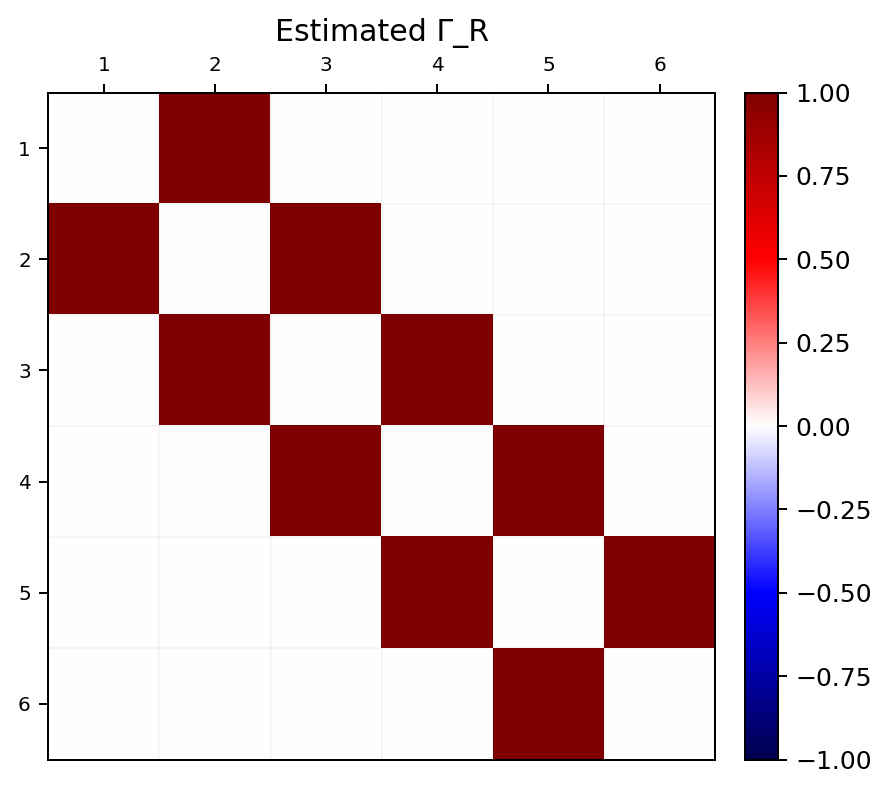

{0: (1.5, 0.0), 1: (3, 0.0), 2: (4.5, 0.0), 3: (6, 0.0), 4: (7.5, 0.0), 5: (9, 0.0)}
{0: '2', 1: '3', 2: '4', 3: '5', 4: '6', 5: '7'}


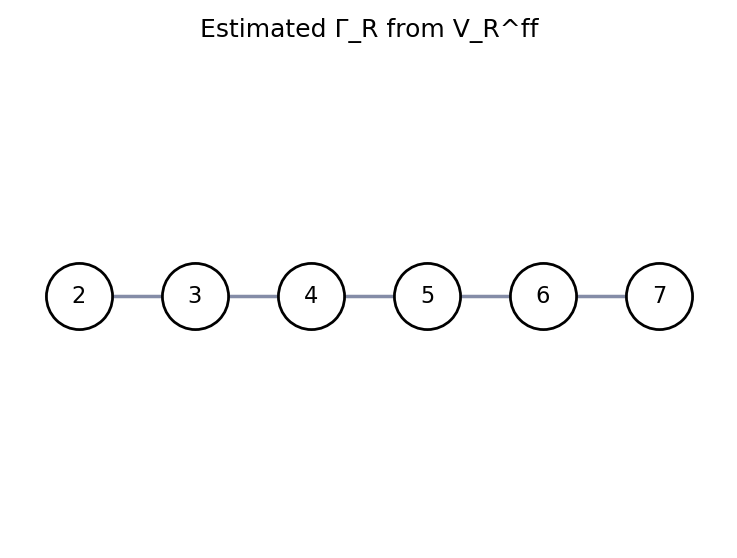

{0: (1.5, 0.0),
 1: (3, 0.0),
 2: (4.5, 0.0),
 3: (6, 0.0),
 4: (7.5, 0.0),
 5: (9, 0.0)}

In [60]:
Gamma_R, nullvar_R, Vdelta_R, Gamma_alt, nullvar_alt, Vdelta_alt = estimate_effective_adjacency(V_R_ff)

print("Main nullifier: p - Gamma x")
print("nullifier variances:", nullvar_R)

print("Diagnostic alternative: x - Gamma p")
print("alternative nullifier variances:", nullvar_alt)

draw_mat(Gamma_R, title="Estimated Γ_R", cmap="seismic", label=False, digits=2, grid=True)
# node 색상에 nullifier variance 표시, 라벨=2,5,6
pos_R, labels_R = make_reduced_pos_and_labels(pos, R0)

print(pos_R)
print(labels_R)
plot_graph_from_matrix(
    Gamma_R,
    #node_values=nullvar_R,
    title="Estimated Γ_R from V_R^ff",
    pos=pos_R,
    draw_labels=True,
    labels=labels_R
)

##### graph layer

R original labels = [2, 3, 4, 5, 6, 7]
Kex_x = [-0.82666832 -0.         -0.         -0.         -0.         -0.        ]
Kex_p = [-3.51342196e-04 -3.77498906e-01 -0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00]


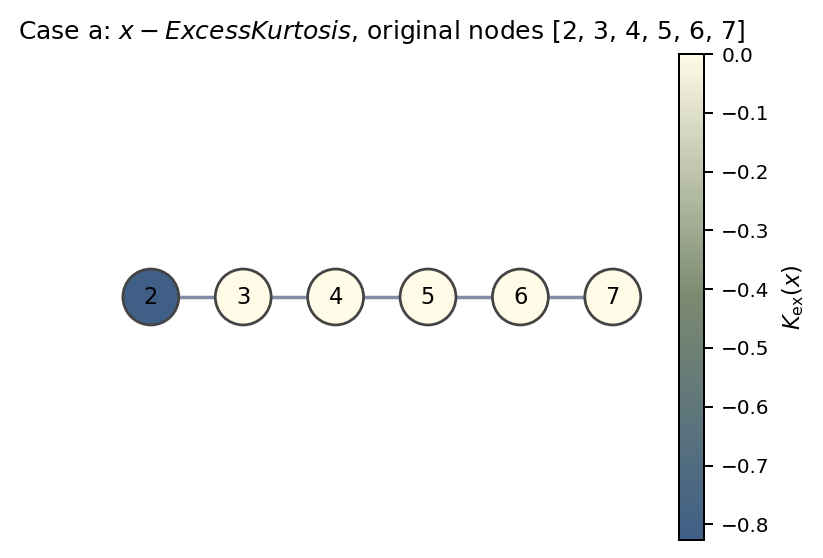

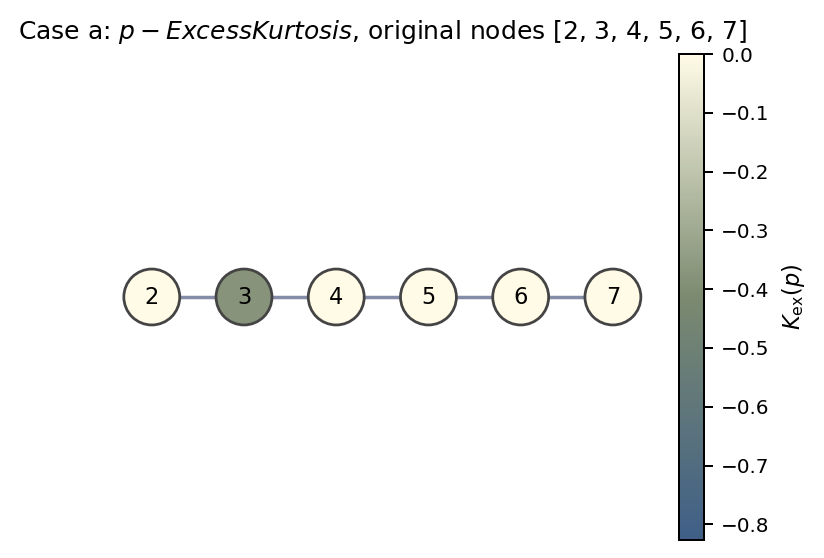

In [61]:
# ============================================================
# 3.1.3 Graph layer - kurtosis reflected graph
# Case a: photon subtraction 먼저 한 경우
#
# Required variables:
#   V_R_ff, A_R_ff, R0, Gamma_R, pos
#   plot_graph_from_matrix(..., labels=labels_R) 로 수정되어 있어야 함
# ============================================================

r = len(R0)

# ------------------------------------------------------------
# 1. Node-wise excess kurtosis
# ------------------------------------------------------------
Kex_x = np.zeros(r)
Kex_p = np.zeros(r)

for k in range(r):
    x_idx = k
    p_idx = k + r

    # x quadrature
    v_x = V_R_ff[x_idx, x_idx]
    a_x = A_R_ff[x_idx, x_idx]
    Kex_x[k] = -3 * a_x**2 / (v_x + a_x)**2

    # p quadrature
    v_p = V_R_ff[p_idx, p_idx]
    a_p = A_R_ff[p_idx, p_idx]
    Kex_p[k] = -3 * a_p**2 / (v_p + a_p)**2

print("R original labels =", list(R0 + 1))
print("Kex_x =", Kex_x)
print("Kex_p =", Kex_p)

# ------------------------------------------------------------
# 2. Reduced graph position and labels
#    Gamma_R node index: 0,1,2,...
#    display label: original node number, e.g. 2,5,6
# ------------------------------------------------------------
pos_R = {
    local_idx: pos[int(original_idx)]
    for local_idx, original_idx in enumerate(R0)
}

labels_R = {
    local_idx: int(original_idx) + 1
    for local_idx, original_idx in enumerate(R0)
}

# common color scale for x and p kurtosis
vmin_K = min(np.nanmin(Kex_x), np.nanmin(Kex_p))
vmax_K = max(np.nanmax(Kex_x), np.nanmax(Kex_p))

# ------------------------------------------------------------
# 3. Draw graph colored by x-quadrature excess kurtosis
# ------------------------------------------------------------
pos_R = plot_graph_from_matrix(
    Gamma_R,
    node_values=Kex_x,
    title=rf"Case a: $x-Excess Kurtosis$, original nodes {list(R0 + 1)}",
    pos=pos_R,
    labels=labels_R,
    draw_labels=True,
    cmap=blue,
    vmin=vmin_K,
    vmax=vmax_K,
    colorbar_label=r"$K_{\rm ex}(x)$"
)

# ------------------------------------------------------------
# 4. Draw graph colored by p-quadrature excess kurtosis
# ------------------------------------------------------------
pos_R = plot_graph_from_matrix(
    Gamma_R,
    node_values=Kex_p,
    title=rf"Case a: $p-Excess Kurtosis$, original nodes {list(R0 + 1)}",
    pos=pos_R,
    labels=labels_R,
    draw_labels=True,
    cmap=blue,
    vmin=vmin_K,
    vmax=vmax_K,
    colorbar_label=r"$K_{\rm ex}(p)$"
)

node local 1, original 2
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[11.04972376  0.        ]
 [ 0.          0.11049724]]
Tr(V^-1 A) = 1.1159126962419998
W(0) condition Tr>2 ? False
min W = 0.0002102612008696454
max W = 0.00960348542108747
has negativity? False


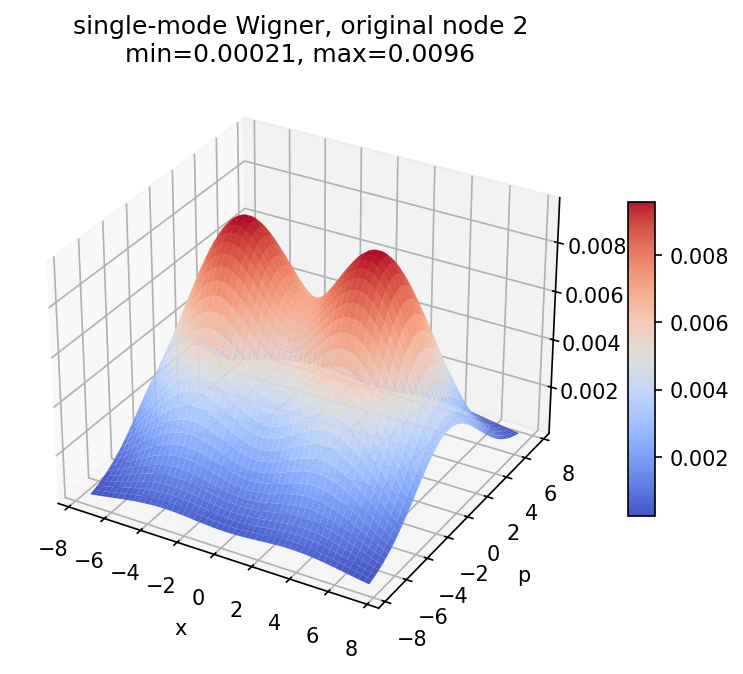

node local 2, original 3
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[ 0.          0.        ]
 [ 0.         11.04972376]]
Tr(V^-1 A) = 0.5497375003435858
W(0) condition Tr>2 ? False
min W = 0.000248618844073363
max W = 0.00813998149833314
has negativity? False


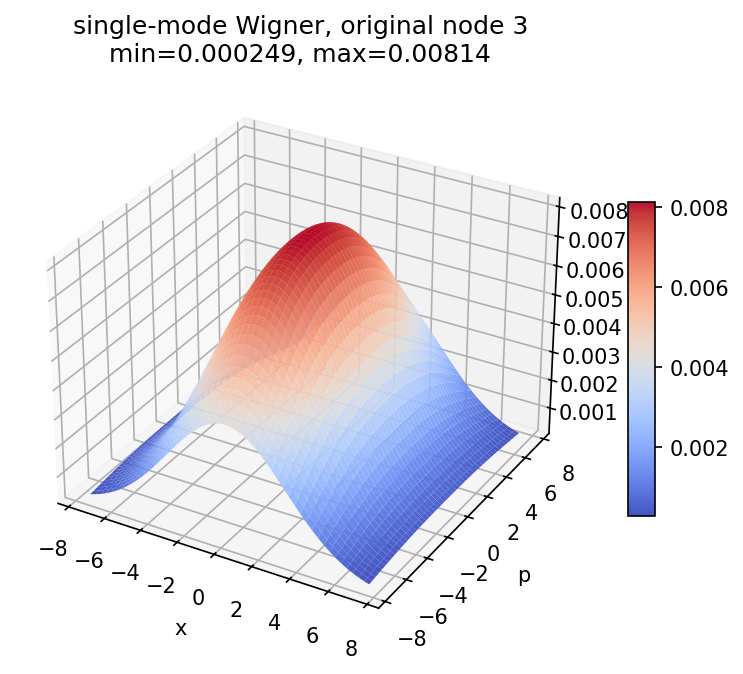

node local 3, original 4
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V^-1 A) = 0.0
W(0) condition Tr>2 ? False
min W = 0.00016637217655150185
max W = 0.011225395285261737
has negativity? False


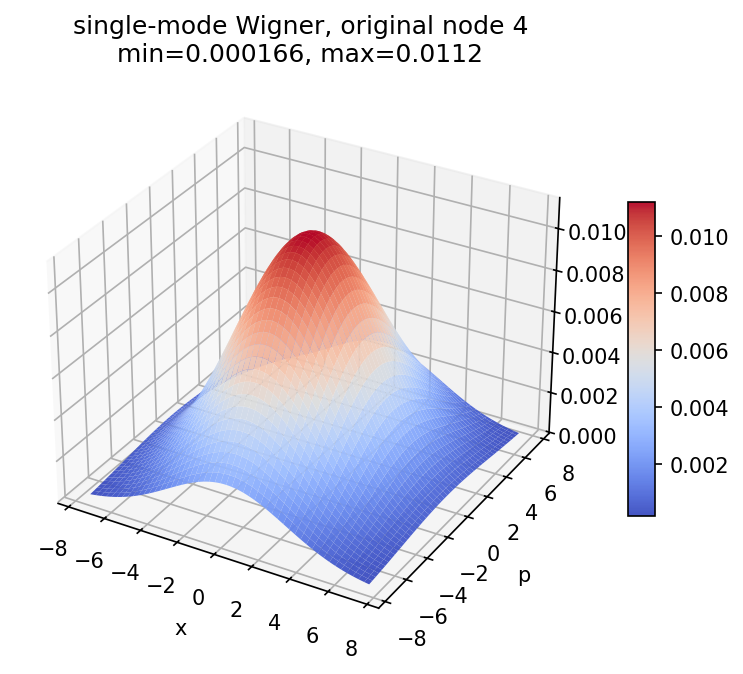

node local 4, original 5
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V^-1 A) = 0.0
W(0) condition Tr>2 ? False
min W = 0.00016637217655150185
max W = 0.011225395285261737
has negativity? False


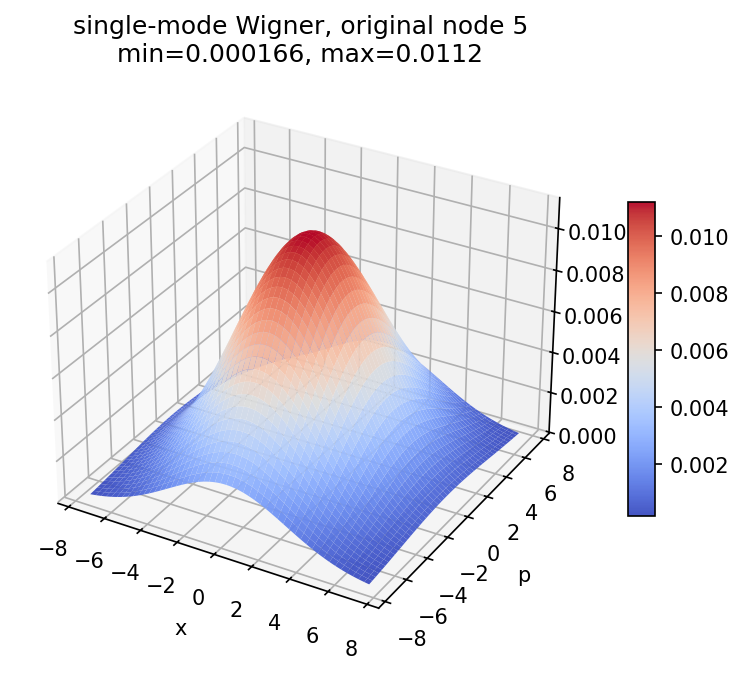

node local 5, original 6
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V^-1 A) = 0.0
W(0) condition Tr>2 ? False
min W = 0.00016637217655150185
max W = 0.011225395285261737
has negativity? False


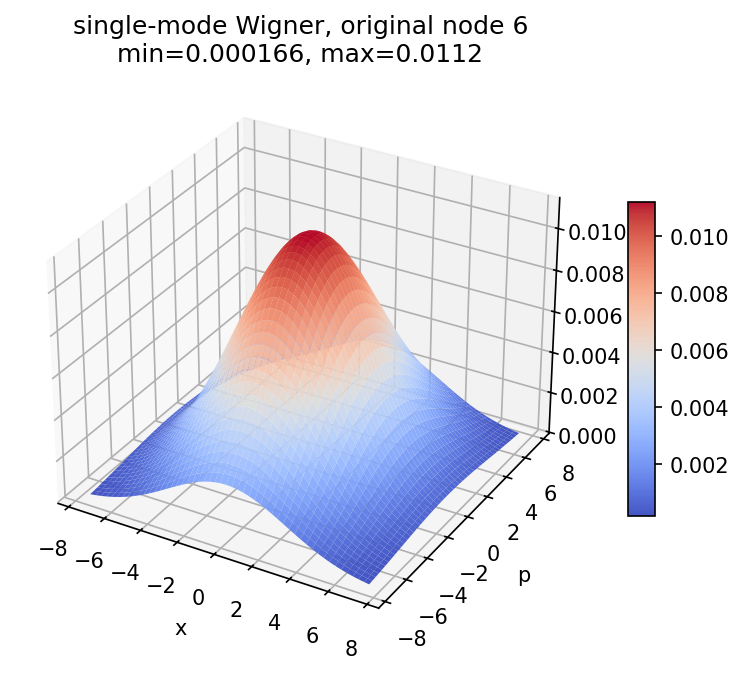

node local 6, original 7
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V^-1 A) = 0.0
W(0) condition Tr>2 ? False
min W = 5.872818516845932e-05
max W = 0.015835517288513918
has negativity? False


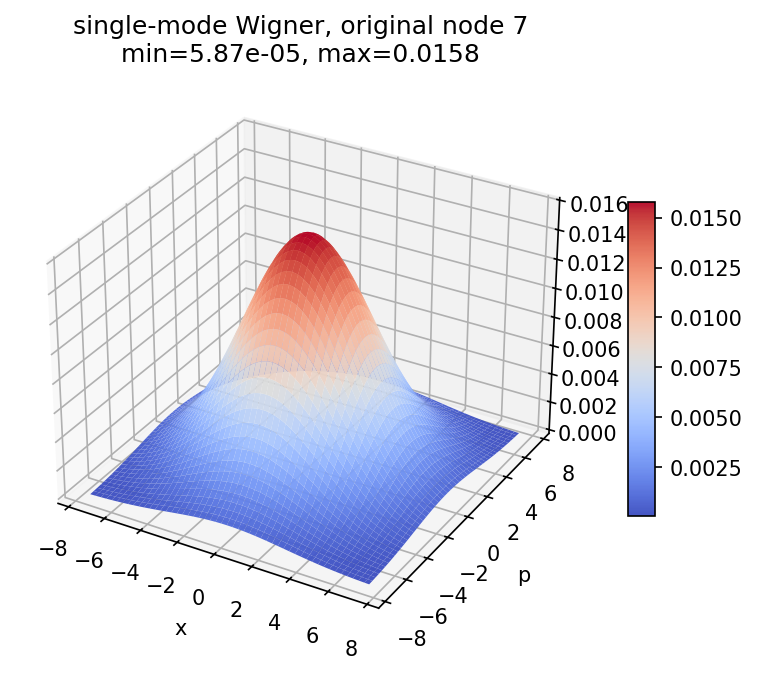

In [62]:
# ============================================================
# 3.1.3 Graph layer - single-mode Wigner function
# Case a: photon subtraction 먼저 한 경우
#
# Inputs:
#   V_R_ff, A_R_ff, R0
#
# ordering in reduced R-space:
#   q_R = (x_R, p_R)
# ============================================================

from mpl_toolkits.mplot3d import Axes3D

def single_mode_wigner_from_VA(V_eff, A_eff, node, m_eff, xlim=10, n=150):
    """
    node  : local node label, 1-based in reduced R-space
    m_eff : number of remaining modes
    V_eff : Gaussian envelope covariance
    A_eff : non-Gaussian correction matrix

    ordering = (x1,...,xm,p1,...,pm)
    """

    k = node - 1
    idx = [k, k + m_eff]

    V1 = V_eff[np.ix_(idx, idx)]
    A1 = A_eff[np.ix_(idx, idx)]

    Vinv = np.linalg.inv(V1)
    detV = np.linalg.det(V1)

    xs = np.linspace(-xlim, xlim, n)
    ps = np.linspace(-xlim, xlim, n)
    X, P = np.meshgrid(xs, ps)

    Z = np.stack([X, P], axis=-1)

    quad = np.einsum("...i,ij,...j->...", Z, Vinv, Z)

    tr_term = np.trace(Vinv @ A1)

    poly_quad = np.einsum(
        "...i,ij,...j->...",
        Z,
        Vinv @ A1 @ Vinv,
        Z
    )

    pref = 1 / (2 * np.pi * np.sqrt(detV))

    W = pref * np.exp(-0.5 * quad) * (
        1 - 0.5 * tr_term + 0.5 * poly_quad
    )

    return X, P, W, V1, A1


def plot_single_mode_wigner_static(V_eff, A_eff, node, m_eff, original_label=None, xlim=10, n=150):
    X, P, W, V1, A1 = single_mode_wigner_from_VA(
        V_eff, A_eff, node=node, m_eff=m_eff, xlim=xlim, n=n
    )

    label = node if original_label is None else original_label

    print(f"node local {node}, original {label}")
    print("V1 =")
    print(V1)
    print("A1 =")
    print(A1)
    print("Tr(V^-1 A) =", np.trace(np.linalg.inv(V1) @ A1))
    print("W(0) condition Tr>2 ?", np.trace(np.linalg.inv(V1) @ A1) > 2)
    print("min W =", np.min(W))
    print("max W =", np.max(W))
    print("has negativity?", np.min(W) < 0)

    fig = plt.figure(figsize=(6, 4.5), dpi=150)
    ax = fig.add_subplot(111, projection="3d")

    surf = ax.plot_surface(
        X, P, W,
        cmap="coolwarm",
        linewidth=0,
        antialiased=True,
        alpha=0.95
    )

    ax.set_title(
        rf"single-mode Wigner, original node {label}" + "\n"
        + rf"min={np.min(W):.3g}, max={np.max(W):.3g}"
    )
    ax.set_xlabel("x")
    ax.set_ylabel("p")
    ax.set_zlabel("W")

    fig.colorbar(surf, shrink=0.55, aspect=12)
    plt.tight_layout()
    plt.show()

    return X, P, W, V1, A1
R_labels = list(R0 + 1)
r = len(R_labels)

for local_node in range(1, r + 1):
    original_node = R_labels[local_node - 1]

    X, P, W, V1, A1 = plot_single_mode_wigner_static(
        V_R_ff,
        A_R_ff,
        node=local_node,
        m_eff=r,
        original_label=original_node,
        xlim=7.5,
        n=300
    )

In [63]:
# ============================================================
# Interactive single-mode Wigner plot
# Case a: photon subtraction 먼저 한 경우
#
# Inputs:
#   V_R_ff, A_R_ff, R0
#
# ordering:
#   q_R = (x_R, p_R)
# ============================================================

import plotly.graph_objects as go
import numpy as np

def single_mode_wigner_grid_from_VA(V_eff, A_eff, node, m_eff, xlim=10, n=150):
    """
    node  : local node label, 1-based in reduced R-space
    m_eff : number of remaining modes
    V_eff : Gaussian envelope matrix
    A_eff : non-Gaussian correction matrix

    ordering = (x1,...,xm,p1,...,pm)
    """

    k = node - 1
    idx = [k, k + m_eff]  # [x_k, p_k]

    V1 = V_eff[np.ix_(idx, idx)]
    A1 = A_eff[np.ix_(idx, idx)]

    Vinv = np.linalg.inv(V1)
    detV = np.linalg.det(V1)

    xs = np.linspace(-xlim, xlim, n)
    ps = np.linspace(-xlim, xlim, n)
    X, P = np.meshgrid(xs, ps)

    Z = np.stack([X, P], axis=-1)

    quad = np.einsum("...i,ij,...j->...", Z, Vinv, Z)

    tr_term = np.trace(Vinv @ A1)

    poly_quad = np.einsum(
        "...i,ij,...j->...",
        Z,
        Vinv @ A1 @ Vinv,
        Z
    )

    pref = 1 / (2 * np.pi * np.sqrt(detV))

    W = pref * np.exp(-0.5 * quad) * (
        1 - 0.5 * tr_term + 0.5 * poly_quad
    )

    return X, P, W, V1, A1


def plot_single_mode_wigner_interactive(
    V_eff,
    A_eff,
    node,
    m_eff,
    original_label=None,
    xlim=10,
    n=160,
):
    """
    Interactive 3D Wigner plot using Plotly.
    """

    X, P, W, V1, A1 = single_mode_wigner_grid_from_VA(
        V_eff,
        A_eff,
        node=node,
        m_eff=m_eff,
        xlim=xlim,
        n=n
    )

    label = node if original_label is None else original_label

    W_min = np.nanmin(W)
    W_max = np.nanmax(W)

    print(f"local node {node} -> original node {label}")
    print("V1 =")
    print(V1)
    print("A1 =")
    print(A1)
    print("Tr(V1^{-1} A1) =", np.trace(np.linalg.inv(V1) @ A1))
    print("W(0) negativity condition Tr > 2 ?",
          np.trace(np.linalg.inv(V1) @ A1) > 2)
    print("min W =", W_min)
    print("max W =", W_max)
    print("has negativity?", W_min < 0)

    fig = go.Figure(
        data=[
            go.Surface(
                x=X,
                y=P,
                z=W,
                colorscale="RdBu",
                reversescale=True,
                colorbar=dict(title="W"),
            )
        ]
    )

    fig.update_layout(
        title=(
            f"Single-mode Wigner, original node {label}<br>"
            f"min={W_min:.3g}, max={W_max:.3g}"
        ),
        scene=dict(
            xaxis_title="x",
            yaxis_title="p",
            zaxis_title="W",
            camera=dict(
                eye=dict(x=1.6, y=-1.8, z=1.2)
            ),
        ),
        width=750,
        height=600,
    )

    fig.show()

    return X, P, W, V1, A1

R_labels = list(R0 + 1)
r = len(R_labels)

for local_node in range(1, r + 1):
    original_node = R_labels[local_node - 1]

    X, P, W, V1, A1 = plot_single_mode_wigner_interactive(
        V_R_ff,
        A_R_ff,
        node=local_node,
        m_eff=r,
        original_label=original_node,
        xlim=10,
        n=160
    )

local node 1 -> original node 2
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[11.04972376  0.        ]
 [ 0.          0.11049724]]
Tr(V1^{-1} A1) = 1.1159126962419998
W(0) negativity condition Tr > 2 ? False
min W = 4.548704313452597e-06
max W = 0.00960220263278452
has negativity? False


local node 2 -> original node 3
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[ 0.          0.        ]
 [ 0.         11.04972376]]
Tr(V1^{-1} A1) = 0.5497375003435858
W(0) negativity condition Tr > 2 ? False
min W = 1.3155554515202297e-05
max W = 0.00813846487956641
has negativity? False


local node 3 -> original node 4
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 6.286590346578302e-06
max W = 0.011222599806309424
has negativity? False


local node 4 -> original node 5
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 6.286590346578302e-06
max W = 0.011222599806309424
has negativity? False


local node 5 -> original node 6
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 6.286590346578302e-06
max W = 0.011222599806309424
has negativity? False


local node 6 -> original node 7
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 7.554650067293951e-07
max W = 0.015830276781641332
has negativity? False


####  3.2 Neighborhood Deletion FeedFoward w/ x measurement(by HOMODYNE), and afterward, Photon subtraction 

#### Initial variable

In [64]:
# ============================================================
# 3.2.1 Initial variable layer
# Case b: HD+FF deletion 먼저, photon subtraction 나중
#
# Inputs from previous cells:
#   V_R_ff : Gaussian envelope after deletion
#   R0     : remaining original nodes, 0-based
#   sub_node or j : photon-subtracted original node label, 1-based
#
# ordering in reduced R-space:
#   q_R = (x1,...,xr,p1,...,pr)
# ============================================================

r = len(R0)
R_labels = list(R0 + 1)

# photon subtraction target
j = sub_node          # original node label, 1-based
j0 = j - 1            # 0-based original node index

if j0 not in R0:
    raise ValueError(f"subtraction node {j} is deleted. Remaining nodes are {R_labels}")

# reduced local index
j_local0 = np.where(R0 == j0)[0][0]     # 0-based local index
j_local = j_local0 + 1                  # 1-based local label

print("Case b: deletion -> photon subtraction")
print("Remaining original nodes R =", R_labels)
print("photon subtraction original node =", j)
print("reduced local node =", j_local)

# ------------------------------------------------------------
# Build reduced projector Pi_g_R
# node-local photon subtraction on reduced node j_local
# ------------------------------------------------------------
g_R = np.zeros(r)
g_R[j_local0] = 1.0

Pi_x_R = np.outer(g_R, g_R)

Pi_g_R = np.block([
    [Pi_x_R,              np.zeros((r, r))],
    [np.zeros((r, r)),    Pi_x_R]
])

print("Pi_g_R projector check:",
      bool(np.linalg.norm(Pi_g_R @ Pi_g_R - Pi_g_R) < 1e-10))

# ------------------------------------------------------------
# A_minus after deletion
# A_minus_post = 2 (V_R_ff - I) Pi_g_R (V_R_ff - I)
#                / Tr[(V_R_ff - I) Pi_g_R]
# ------------------------------------------------------------
I_2r = np.eye(2 * r)

denom_post = np.trace((V_R_ff - I_2r) @ Pi_g_R)

print("denom_post =", denom_post)

if np.isclose(denom_post, 0):
    raise ValueError("denom_post is close to zero: subtraction mode may be vacuum-like after deletion.")

A_minus_post = (
    2 * (V_R_ff - I_2r) @ Pi_g_R @ (V_R_ff - I_2r)
    / denom_post
)

A_minus_post = 0.5 * (A_minus_post + A_minus_post.T)

print("A_minus_post symmetric check:",
      bool(np.linalg.norm(A_minus_post - A_minus_post.T) < 1e-10))

# ------------------------------------------------------------
# Case b final matrices
# ------------------------------------------------------------
V_R_post = V_R_ff
A_R_post = A_minus_post
V_actual_R_post = V_R_post + A_R_post

show_mat(A_R_post, name=r"A_minus_post = ")
show_mat(V_R_post, name=r"V_R_post = ")
show_mat(V_actual_R_post, name=r"V_actual_R_post = ")

ValueError: subtraction node 1 is deleted. Remaining nodes are [2, 3, 4, 5, 6, 7]

#### matrix layer

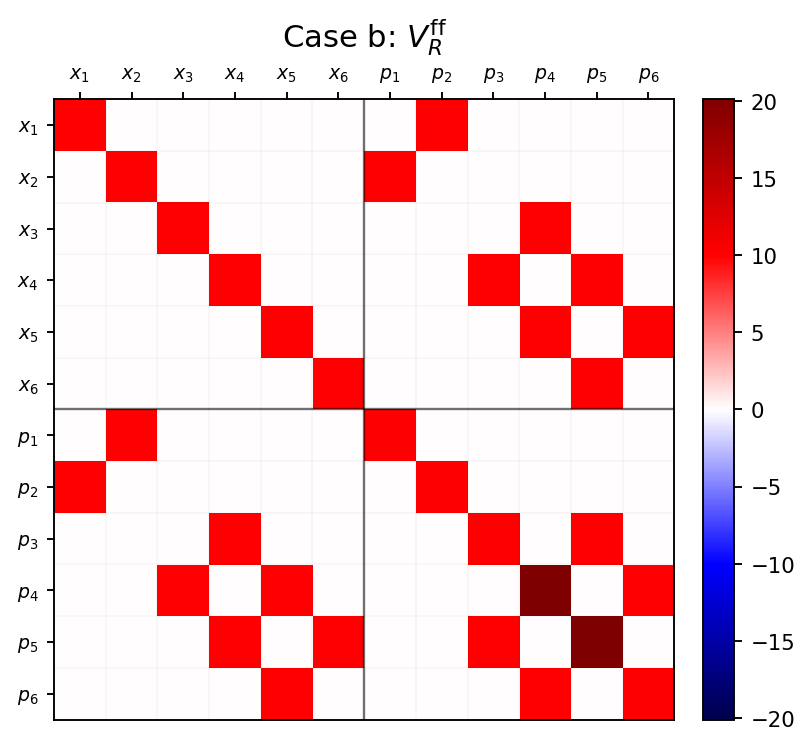

vmin=-20.1, vmax=20.1


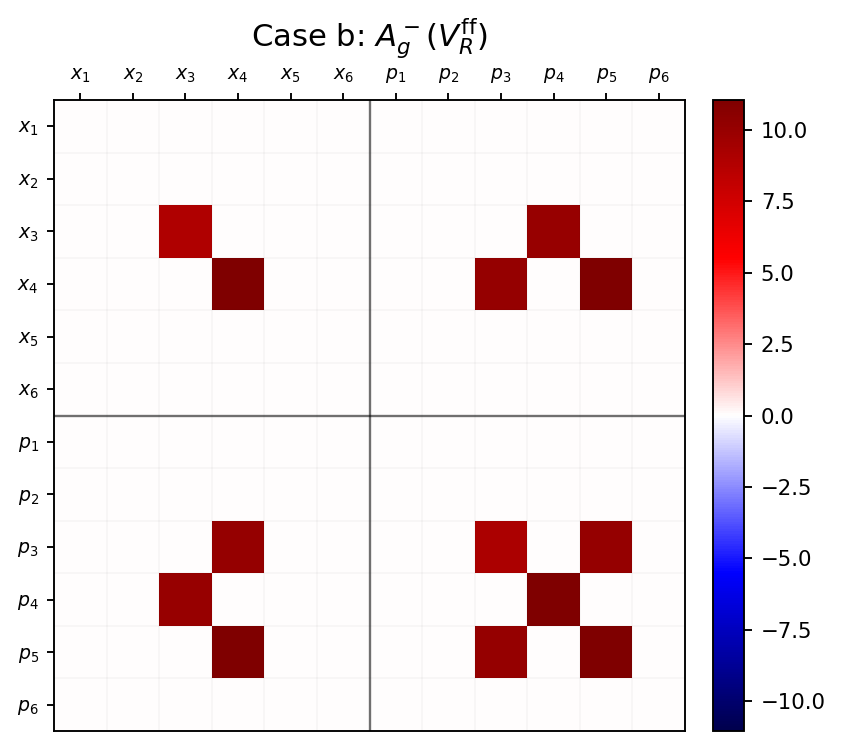

vmin=-11, vmax=11


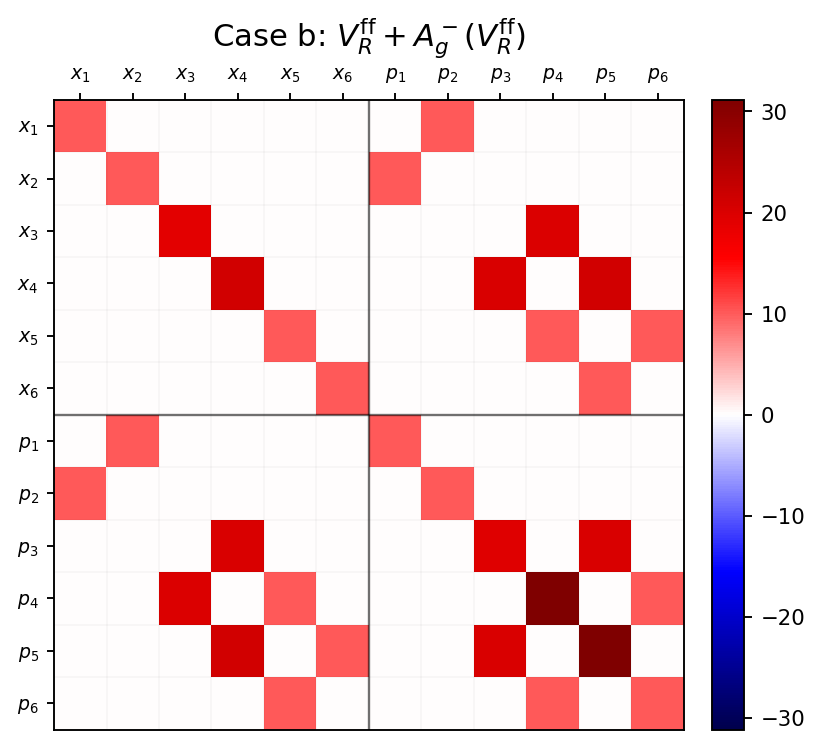

vmin=-31.1, vmax=31.1


In [ ]:
# ============================================================
# 3.2.2 A_R, V_R matrix layer
# Case b: deletion 먼저, photon subtraction 나중
# ============================================================

draw_phase_matrix(
    V_R_post,
    title=rf"Case b: $V_R^{{\rm ff}}$",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)

draw_phase_matrix(
    A_R_post,
    title=rf"Case b: $A^-_g(V_R^{{\rm ff}})$",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)

draw_phase_matrix(
    V_actual_R_post,
    title=rf"Case b: $V_R^{{\rm ff}} + A^-_g(V_R^{{\rm ff}})$",
    positive=False,
    cmap="seismic",
    tick_step=1,
    figsize=(5, 4.5),
    grid=True
)

In [ ]:
# ============================================================
# 3.2.3 Graph layer - kurtosis only
# Case b: deletion 먼저, photon subtraction 나중
#
# Inputs:
#   V_R_post : Gaussian envelope after deletion
#   A_R_post : non-Gaussian correction after photon subtraction on deleted graph
#   R0       : remaining nodes, 0-based original labels
#   j_local0 : target node local index in R-space, 0-based
#
# ordering in reduced R-space:
#   q_R = (x_R, p_R)
# ============================================================

V_eff = V_R_post
A_eff = A_R_post

r = len(R0)
R_labels = list(R0 + 1)   # original node labels, 1-based

def excess_kurtosis_1d(v, a):
    """
    chi(lambda) = exp[-v lambda^2 / 2] * (1 - a lambda^2 / 2)

    actual variance = v + a
    excess kurtosis = -3 a^2 / (v+a)^2
    """
    var = v + a
    if np.isclose(var, 0):
        return np.nan
    return -3 * a**2 / var**2


# node별 x, p kurtosis 계산
Kex_x_post = np.zeros(r)
Kex_p_post = np.zeros(r)

var_x_actual_post = np.zeros(r)
var_p_actual_post = np.zeros(r)

v_x_env_post = np.zeros(r)
v_p_env_post = np.zeros(r)

a_x_post = np.zeros(r)
a_p_post = np.zeros(r)

for k in range(r):
    x_idx = k
    p_idx = k + r

    # x quadrature
    v_x_env_post[k] = V_eff[x_idx, x_idx]
    a_x_post[k] = A_eff[x_idx, x_idx]
    var_x_actual_post[k] = v_x_env_post[k] + a_x_post[k]
    Kex_x_post[k] = excess_kurtosis_1d(v_x_env_post[k], a_x_post[k])

    # p quadrature
    v_p_env_post[k] = V_eff[p_idx, p_idx]
    a_p_post[k] = A_eff[p_idx, p_idx]
    var_p_actual_post[k] = v_p_env_post[k] + a_p_post[k]
    Kex_p_post[k] = excess_kurtosis_1d(v_p_env_post[k], a_p_post[k])


# table
kurtosis_post_df = pd.DataFrame({
    "node": R_labels,
    "v_x_env": v_x_env_post,
    "a_x": a_x_post,
    "var_x_actual": var_x_actual_post,
    "Kex_x": Kex_x_post,
    "v_p_env": v_p_env_post,
    "a_p": a_p_post,
    "var_p_actual": var_p_actual_post,
    "Kex_p": Kex_p_post,
})

display(kurtosis_post_df.style.format("{:.4f}", subset=kurtosis_post_df.columns[1:]))

print("target original node =", j)
print("target local index =", j_local)
print("target Kex_x =", Kex_x_post[j_local0])
print("target Kex_p =", Kex_p_post[j_local0])

,node,v_x_env,a_x,var_x_actual,Kex_x,v_p_env,a_p,var_p_actual,Kex_p
0,2,10.0000,0.0000,10.0000,-0.0000,10.1000,0.0000,10.1000,-0.0000
1,3,10.0000,0.0000,10.0000,-0.0000,10.1000,0.0000,10.1000,-0.0000
2,4,10.0000,8.9503,18.9503,-0.6692,10.1000,9.1503,19.2503,-0.6778
3,5,10.0000,11.0497,21.0497,-0.8267,20.1000,11.0497,31.1497,-0.3775
4,6,10.0000,0.0000,10.0000,-0.0000,20.1000,11.0497,31.1497,-0.3775
5,7,10.0000,0.0000,10.0000,-0.0000,10.1000,0.0000,10.1000,-0.0000


target original node = 1
target local index = None
target Kex_x = -0.6692109580191925
target Kex_p = -0.6778221137904278


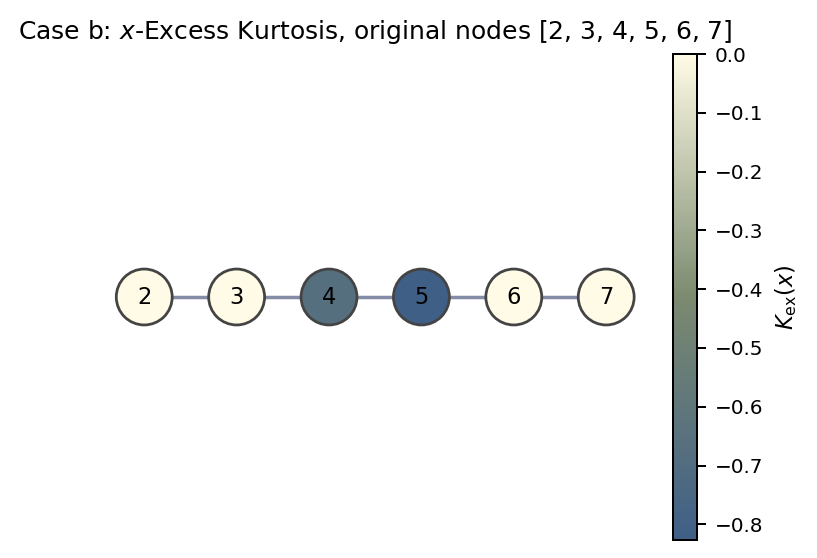

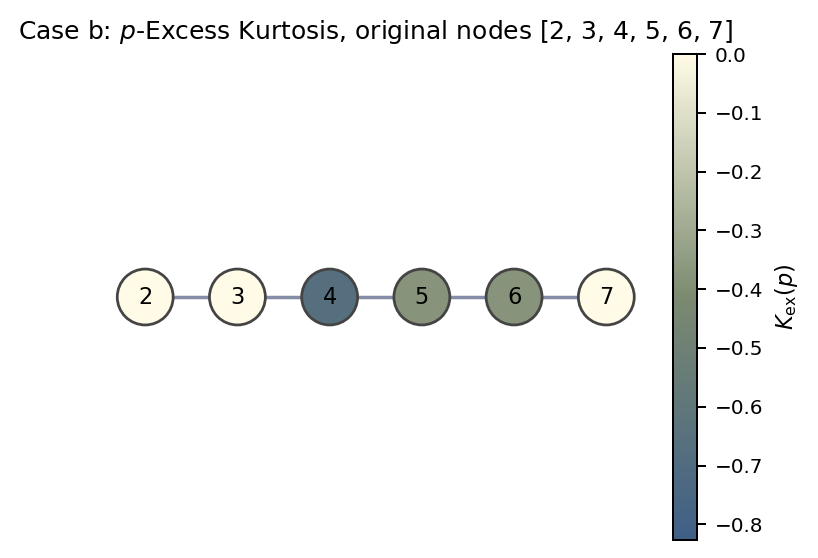

In [ ]:
# ============================================================
# 3.2.3 Graph layer - kurtosis reflected graph
# Case b: deletion 먼저, photon subtraction 나중
# ============================================================

# Reduced graph position and labels
pos_R = {
    local_idx: pos[int(original_idx)]
    for local_idx, original_idx in enumerate(R0)
}

labels_R = {
    local_idx: int(original_idx) + 1
    for local_idx, original_idx in enumerate(R0)
}

# common color scale for x and p kurtosis
vmin_K_post = min(np.nanmin(Kex_x_post), np.nanmin(Kex_p_post))
vmax_K_post = max(np.nanmax(Kex_x_post), np.nanmax(Kex_p_post))

# x-quadrature excess kurtosis graph
pos_R = plot_graph_from_matrix(
    Gamma_R,
    node_values=Kex_x_post,
    title=rf"Case b: $x$-Excess Kurtosis, original nodes {list(R0 + 1)}",
    pos=pos_R,
    labels=labels_R,
    draw_labels=True,
    cmap=blue,
    vmin=vmin_K_post,
    vmax=vmax_K_post,
    colorbar_label=r"$K_{\rm ex}(x)$"
)

# p-quadrature excess kurtosis graph
pos_R = plot_graph_from_matrix(
    Gamma_R,
    node_values=Kex_p_post,
    title=rf"Case b: $p$-Excess Kurtosis, original nodes {list(R0 + 1)}",
    pos=pos_R,
    labels=labels_R,
    draw_labels=True,
    cmap=blue,
    vmin=vmin_K_post,
    vmax=vmax_K_post,
    colorbar_label=r"$K_{\rm ex}(p)$"
)

reduced node 1  <->  original node 2


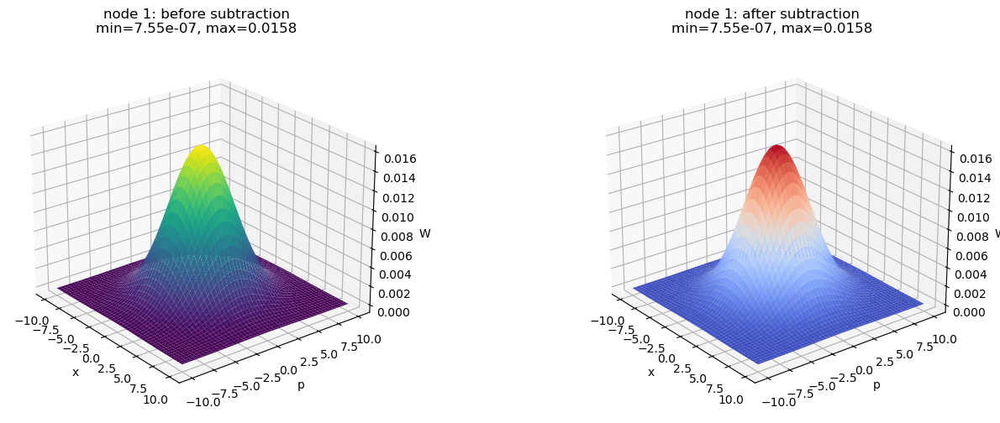

reduced node 2  <->  original node 3


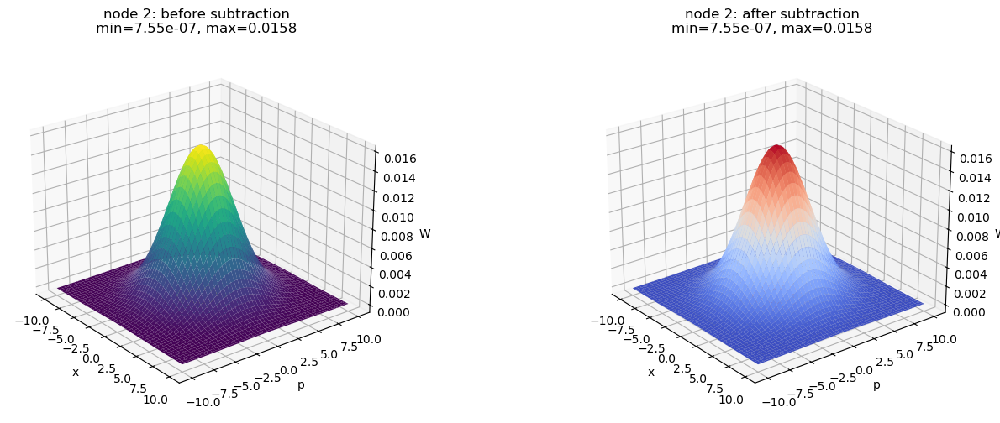

reduced node 3  <->  original node 4


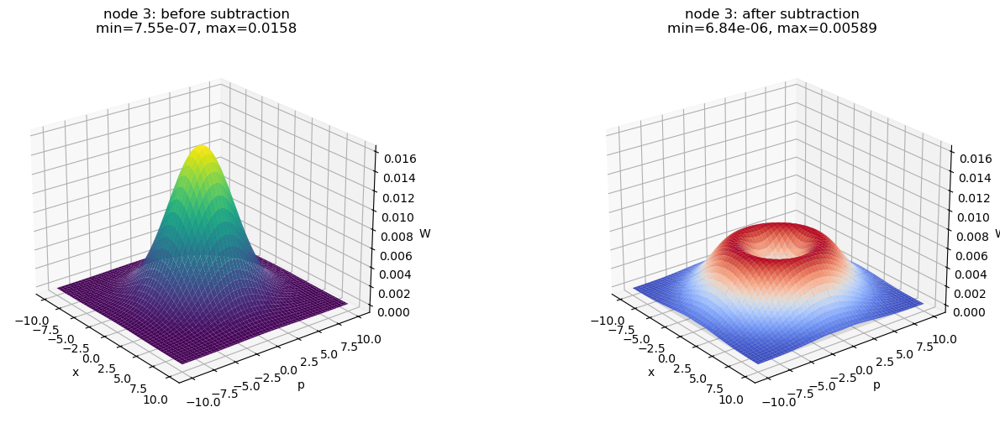

reduced node 4  <->  original node 5


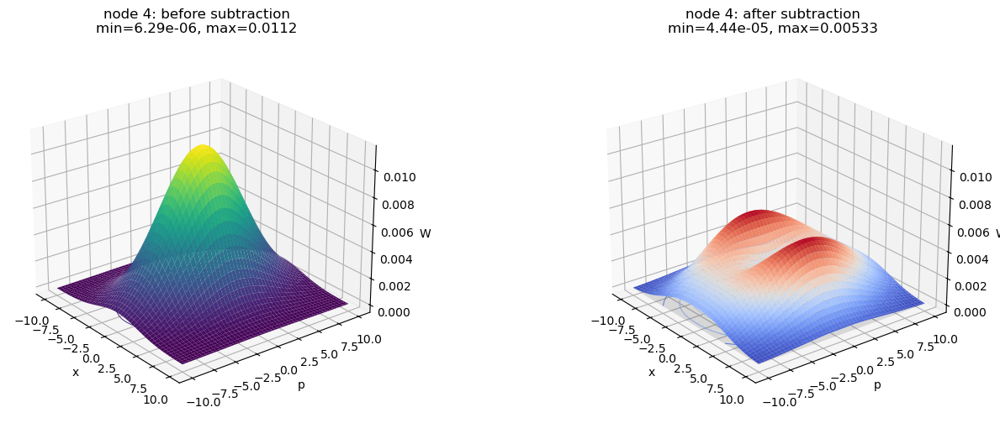

reduced node 5  <->  original node 6


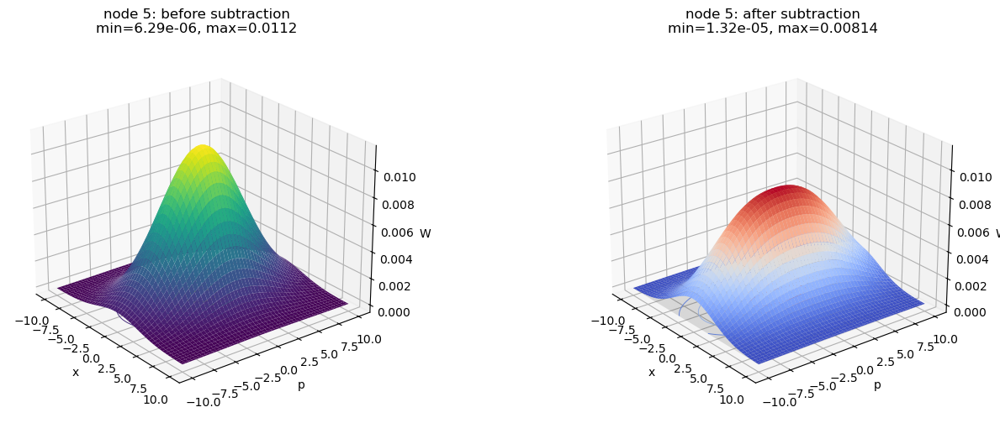

reduced node 6  <->  original node 7


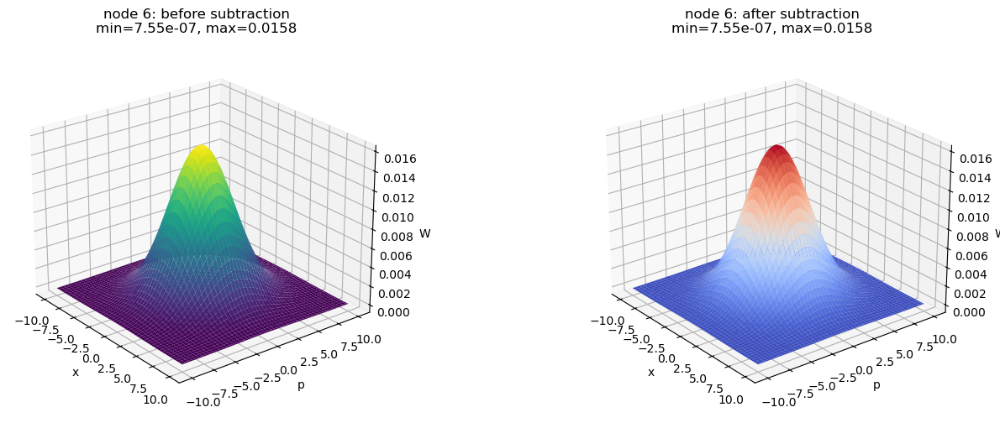

In [ ]:
# ============================================================
# 3.2.3 Graph layer - single-mode Wigner function
# Case b: deletion 먼저, photon subtraction 나중
#
# V_eff = V_R_post
# A_eff = A_R_post
# node index는 reduced-space 기준: 1,2,...,r
# ============================================================

V_eff = V_R_post
A_eff = A_R_post

r = len(R0)
R_labels = list(R0 + 1)

nodes_to_plot = range(1, r + 1)

plot_static = True
plot_interactive = False

for node in nodes_to_plot:
    original_node = R_labels[node - 1]

    print("=" * 60)
    print(f"reduced node {node}  <->  original node {original_node}")

    if plot_static:
        plot_node_wigner_3d_static(
            V_eff,
            A_eff,
            node=node,
            m=r,
            xlim=10,
            n=100
        )

    if plot_interactive:
        plot_node_wigner_3d_interactive(
            V_eff,
            A_eff,
            node=node,
            m=r,
            xlim=10,
            n=100
        )

In [ ]:
# ============================================================
# Interactive single-mode Wigner plot
# Case b: deletion 먼저, photon subtraction 나중
#
# Inputs:
#   V_R_post, A_R_post, R0
#
# ordering:
#   q_R = (x_R, p_R)
# ============================================================

R_labels = list(R0 + 1)
r = len(R_labels)

for local_node in range(1, r + 1):
    original_node = R_labels[local_node - 1]

    X, P, W, V1, A1 = plot_single_mode_wigner_interactive(
        V_R_post,
        A_R_post,
        node=local_node,
        m_eff=r,
        original_label=original_node,
        xlim=10,
        n=160
    )

local node 1 -> original node 2
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 7.554650067293951e-07
max W = 0.015830276781641332
has negativity? False


local node 2 -> original node 3
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 7.554650067293965e-07
max W = 0.015830276781641332
has negativity? False


local node 3 -> original node 4
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[8.95027624 0.        ]
 [0.         9.15027624]]
Tr(V1^{-1} A1) = 1.800995569170177
W(0) negativity condition Tr > 2 ? False
min W = 6.844233562060688e-06
max W = 0.005890457170118681
has negativity? False


local node 4 -> original node 5
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[11.04972376  0.        ]
 [ 0.         11.04972376]]
Tr(V1^{-1} A1) = 1.6547098760341934
W(0) negativity condition Tr > 2 ? False
min W = 4.44148435313375e-05
max W = 0.005334565578090022
has negativity? False


local node 5 -> original node 6
V1 =
[[10.   0. ]
 [ 0.  20.1]]
A1 =
[[ 0.          0.        ]
 [ 0.         11.04972376]]
Tr(V1^{-1} A1) = 0.5497375003435858
W(0) negativity condition Tr > 2 ? False
min W = 1.3155554515202297e-05
max W = 0.00813846487956641
has negativity? False


local node 6 -> original node 7
V1 =
[[10.   0. ]
 [ 0.  10.1]]
A1 =
[[0. 0.]
 [0. 0.]]
Tr(V1^{-1} A1) = 0.0
W(0) negativity condition Tr > 2 ? False
min W = 7.554650067293951e-07
max W = 0.015830276781641332
has negativity? False


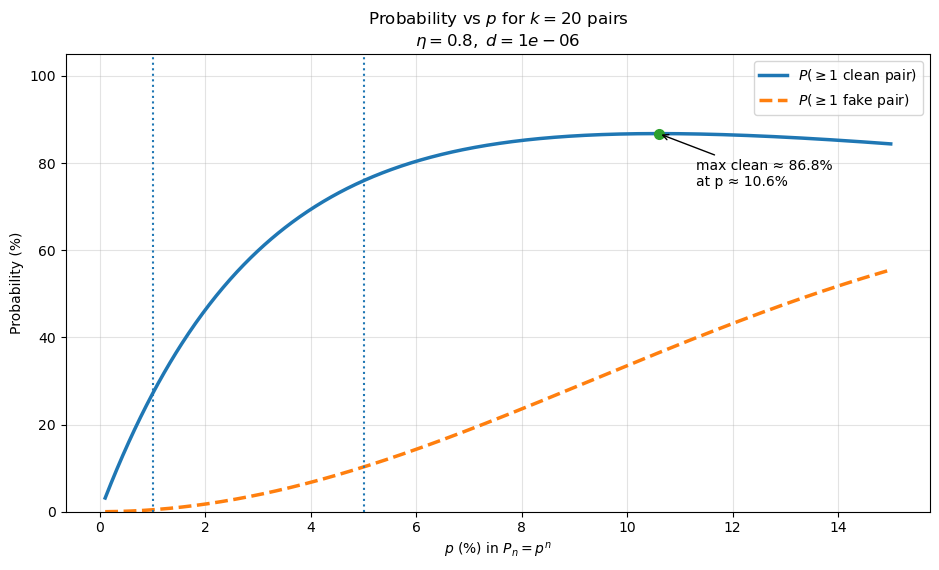

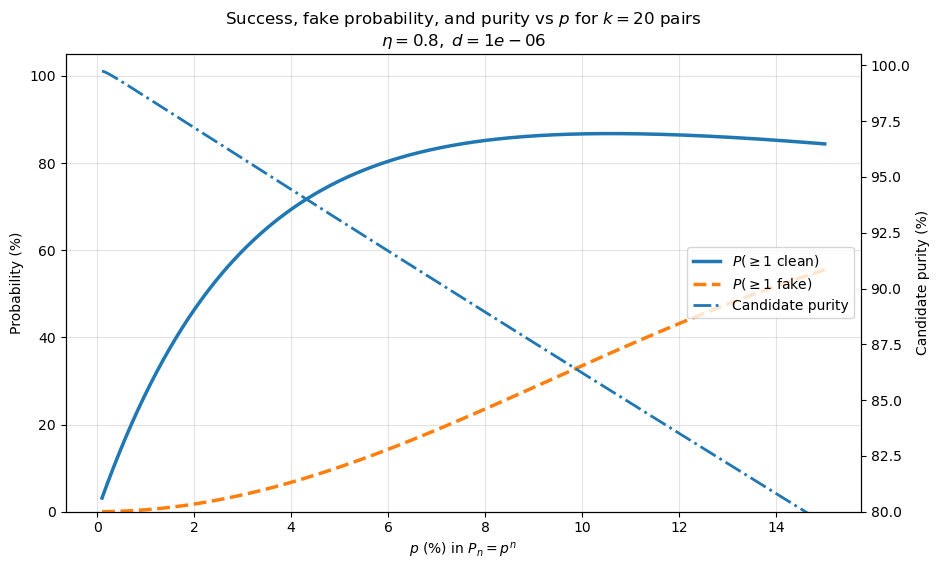

k = 20, eta = 0.8, dark count = 1e-06
Max clean point: p ≈ 10.599%
P(≥1 clean) ≈ 86.766%

p =  0.5% : P(≥1 clean) =  14.71% , P(≥1 fake) =   0.12% , candidate purity =  99.28%
p =  1.0% : P(≥1 clean) =  27.11% , P(≥1 fake) =   0.45% , candidate purity =  98.59%
p =  2.0% : P(≥1 clean) =  46.34% , P(≥1 fake) =   1.76% , candidate purity =  97.20%
p =  5.0% : P(≥1 clean) =  75.95% , P(≥1 fake) =  10.27% , candidate purity =  93.06%
p = 10.0% : P(≥1 clean) =  86.70% , P(≥1 fake) =  33.52% , candidate purity =  86.22%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================
# Parameters
# =========================
k = 20          # number of outer pairs
eta = 0.8       # detector quantum efficiency
d = 1e-6        # dark count probability per gate

# p range: 0.1% ~ 15%
p_vals = np.linspace(0.001, 0.15, 800)

# =========================
# Exact model for P_n = p^n
# =========================
def compute_probs(p, k=20, eta=0.8, d=1e-6):
    """
    Model:
        P_n = p^n, n >= 1
        P_0 = 1 - sum_{n>=1} p^n

    Detector:
        C_n = 1 - (1-d)(1-eta)^n

    Returns:
        P_clean_exist : probability of at least one clean pair
        P_fake_exist  : probability of at least one fake pair
        purity         : clean fraction among observed candidates
    """

    # Total no-subtraction probability
    P0 = 1 - p / (1 - p)

    # Safety: this model only makes sense for p < 0.5
    if P0 < 0:
        return np.nan, np.nan, np.nan

    # Detector click probability for n photons
    def C(n):
        return 1 - (1 - d) * (1 - eta)**n

    # Exact infinite sums
    # sum_{n>=1} P_n = p/(1-p)
    sum_Pn = p / (1 - p)

    # sum_{n>=1} p^n (1-eta)^n
    sum_Pn_no_detect_factor = p * (1 - eta) / (1 - p * (1 - eta))

    # Observed click probability for one node
    C_obs = (
        P0 * d
        + sum_Pn
        - (1 - d) * sum_Pn_no_detect_factor
    )

    # Observed no-click probability for one node
    N_obs = 1 - C_obs

    # Clean no-click node:
    # physically no subtraction and no dark click
    S0 = P0 * (1 - d)

    # Clean one-subtraction detected node:
    # exactly one subtraction and detected click
    S1 = p * C(1)

    # Pair-level clean event:
    # one side S1, the other side S0
    q_clean = 2 * S0 * S1

    # Pair-level observed 10/01 candidate:
    # one side observed click, other side observed no-click
    q_obs = 2 * C_obs * N_obs

    # Fake candidate probability
    q_fake = q_obs - q_clean
    q_fake = max(q_fake, 0)

    # Protocol-level probability:
    # center node must be observed no-click
    P_clean_exist = N_obs * (1 - (1 - q_clean)**k)
    P_fake_exist = N_obs * (1 - (1 - q_fake)**k)

    # Candidate purity
    purity = q_clean / q_obs if q_obs > 0 else np.nan

    return P_clean_exist, P_fake_exist, purity


# =========================
# Compute curves
# =========================
P_clean = []
P_fake = []
purity = []

for p in p_vals:
    Pc, Pf, pur = compute_probs(p, k=k, eta=eta, d=d)
    P_clean.append(Pc)
    P_fake.append(Pf)
    purity.append(pur)

P_clean = np.array(P_clean)
P_fake = np.array(P_fake)
purity = np.array(purity)

# Find max clean probability point
idx_max = np.nanargmax(P_clean)
p_opt = p_vals[idx_max]
P_clean_opt = P_clean[idx_max]

# =========================
# Plot 1: clean/fake probability vs p
# =========================
plt.figure(figsize=(9.5, 5.8))

plt.plot(
    p_vals * 100,
    P_clean * 100,
    linewidth=2.5,
    label=r"$P(\geq 1\ \mathrm{clean\ pair})$"
)

plt.plot(
    p_vals * 100,
    P_fake * 100,
    linewidth=2.5,
    linestyle="--",
    label=r"$P(\geq 1\ \mathrm{fake\ pair})$"
)

# Useful reference lines
plt.axvline(1, linestyle=":", linewidth=1.5)
plt.axvline(5, linestyle=":", linewidth=1.5)

# Mark max point
plt.plot(p_opt * 100, P_clean_opt * 100, marker="o", markersize=7)

plt.annotate(
    f"max clean ≈ {100*P_clean_opt:.1f}%\n"
    f"at p ≈ {100*p_opt:.1f}%",
    xy=(p_opt * 100, P_clean_opt * 100),
    xytext=(p_opt * 100 + 0.7, P_clean_opt * 100 - 12),
    fontsize=10,
    arrowprops=dict(arrowstyle="->", lw=1)
)

plt.xlabel(r"$p$ (%) in $P_n=p^n$")
plt.ylabel("Probability (%)")
plt.title(
    rf"Probability vs $p$ for $k={k}$ pairs"
    "\n"
    rf"$\eta={eta},\ d={d}$"
)
plt.grid(True, alpha=0.35)
plt.legend()
plt.ylim(0, 105)
plt.tight_layout()
plt.show()


# =========================
# Plot 2: same graph + purity on right axis
# =========================
fig, ax1 = plt.subplots(figsize=(9.5, 5.8))

line1, = ax1.plot(
    p_vals * 100,
    P_clean * 100,
    linewidth=2.5,
    label=r"$P(\geq 1\ \mathrm{clean})$"
)

line2, = ax1.plot(
    p_vals * 100,
    P_fake * 100,
    linewidth=2.5,
    linestyle="--",
    label=r"$P(\geq 1\ \mathrm{fake})$"
)

ax1.set_xlabel(r"$p$ (%) in $P_n=p^n$")
ax1.set_ylabel("Probability (%)")
ax1.grid(True, alpha=0.35)
ax1.set_ylim(0, 105)

ax2 = ax1.twinx()

line3, = ax2.plot(
    p_vals * 100,
    purity * 100,
    linewidth=2.0,
    linestyle="-.",
    label="Candidate purity"
)

ax2.set_ylabel("Candidate purity (%)")
ax2.set_ylim(80, 100.5)

lines = [line1, line2, line3]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc="center right")

plt.title(
    rf"Success, fake probability, and purity vs $p$ for $k={k}$ pairs"
    "\n"
    rf"$\eta={eta},\ d={d}$"
)
plt.tight_layout()
plt.show()


# =========================
# Print reference values
# =========================
print(f"k = {k}, eta = {eta}, dark count = {d}")
print(f"Max clean point: p ≈ {100*p_opt:.3f}%")
print(f"P(≥1 clean) ≈ {100*P_clean_opt:.3f}%")
print()

for p_ref in [0.005, 0.01, 0.02, 0.05, 0.10]:
    Pc, Pf, pur = compute_probs(p_ref, k=k, eta=eta, d=d)
    print(
        f"p = {100*p_ref:4.1f}% : "
        f"P(≥1 clean) = {100*Pc:6.2f}% , "
        f"P(≥1 fake) = {100*Pf:6.2f}% , "
        f"candidate purity = {100*pur:6.2f}%"
    )

========== Node-level probabilities ==========
P0      = 0.99497487  (99.4975%)
C_obs   = 0.00402512  (0.4025%)
N_obs   = 0.99597488  (99.5975%)
S0      = 0.99497388  (99.4974%)
S1      = 0.00400000  (0.4000%)

========== Pair-level probabilities ==========
q_clean = 0.00795979  (0.7960% per pair)
q_fake  = 0.00005804  (0.0058% per pair)
q_obs   = 0.00801784  (0.8018% per pair)
candidate purity = 99.2761%


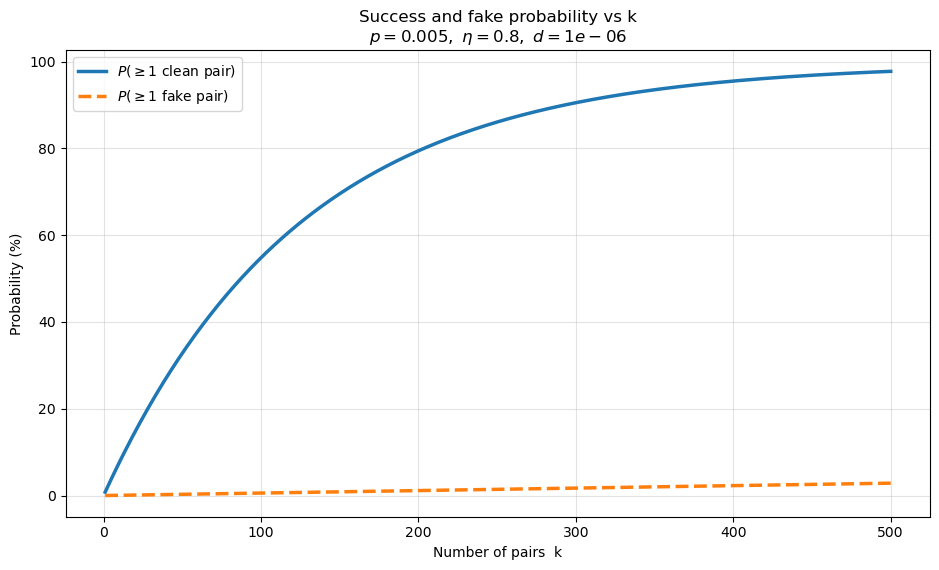

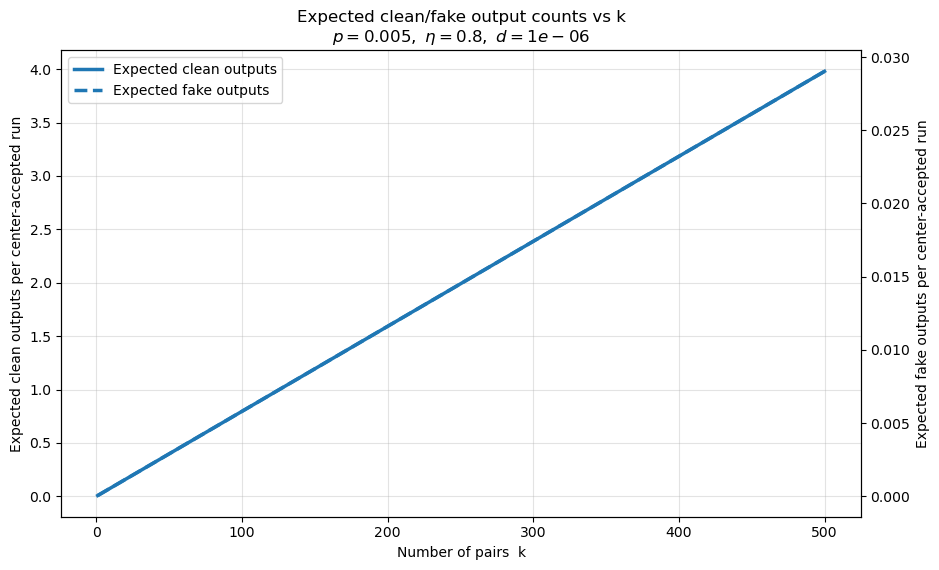

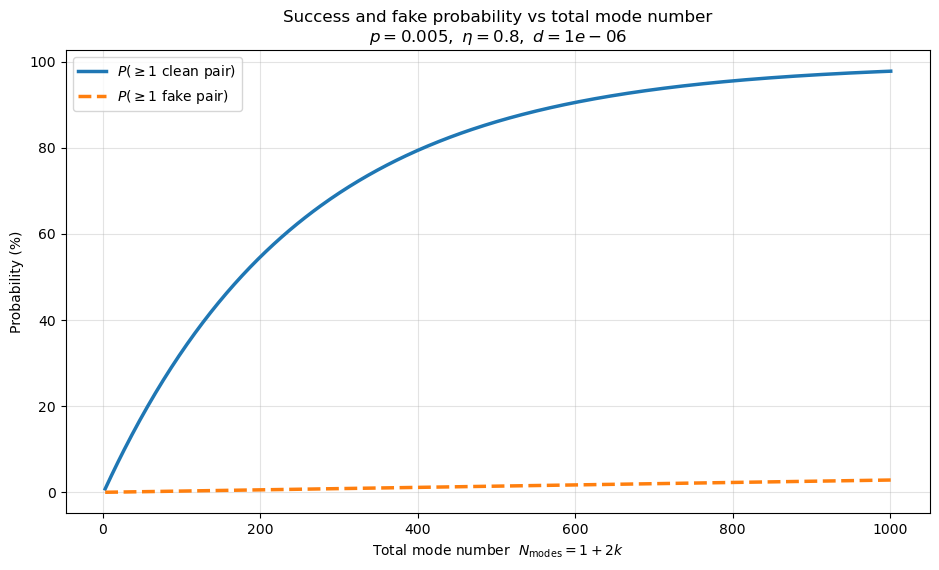


========== Reference values ==========
k=  10, N_modes=  21 | P_clean=  7.650% | P_fake=  0.058% | E_clean=  0.080 | E_fake= 0.0006
k=  20, N_modes=  41 | P_clean= 14.712% | P_fake=  0.116% | E_clean=  0.159 | E_fake= 0.0012
k=  40, N_modes=  81 | P_clean= 27.251% | P_fake=  0.231% | E_clean=  0.318 | E_fake= 0.0023
k= 100, N_modes= 201 | P_clean= 54.808% | P_fake=  0.576% | E_clean=  0.796 | E_fake= 0.0058
k= 200, N_modes= 401 | P_clean= 79.455% | P_fake=  1.150% | E_clean=  1.592 | E_fake= 0.0116
k= 500, N_modes=1001 | P_clean= 97.766% | P_fake=  2.849% | E_clean=  3.980 | E_fake= 0.0290


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Parameters
# ============================================================
p = 0.005      # fixed: P_n = p^n, so p=0.005 means 0.5%
eta = 0.8      # detector quantum efficiency
d = 1e-6       # dark count probability per gate

# k = number of outer pairs
# total mode number is roughly N_modes = 1 + 2k
k_vals = np.arange(1, 501)   # change this range if needed


# ============================================================
# Node and pair probability model
# ============================================================
def compute_pair_probabilities(p, eta=0.8, d=1e-6):
    """
    Model:
        P_n = p^n, n >= 1
        P_0 = 1 - sum_{n>=1} p^n

    Detector:
        C_n = 1 - (1-d)(1-eta)^n

    Clean candidate:
        one node = exactly one photon subtraction and detected click
        other node = truly no subtraction and no dark click

    Fake candidate:
        observed 10/01 candidate but not clean.
        This includes:
            - double or more photon subtraction in one node
            - dark count
            - hidden missed subtraction on no-click side
            - etc.
    """

    # No-subtraction probability
    # sum_{n=1}^\infty p^n = p / (1-p)
    P0 = 1 - p / (1 - p)

    if P0 < 0:
        raise ValueError("This model requires p < 0.5 so that P0 >= 0.")

    # On/off detector click probability given n photons
    def C(n):
        return 1 - (1 - d) * (1 - eta)**n

    # Exact infinite sums
    sum_Pn = p / (1 - p)

    # sum_{n>=1} p^n (1-eta)^n
    sum_Pn_no_detection_factor = p * (1 - eta) / (1 - p * (1 - eta))

    # Observed click probability for one node
    # C_obs = P0*C0 + sum_{n>=1} P_n*C_n
    C_obs = (
        P0 * d
        + sum_Pn
        - (1 - d) * sum_Pn_no_detection_factor
    )

    # Observed no-click probability for one node
    N_obs = 1 - C_obs

    # Clean no-click node:
    # physically no subtraction and no dark count
    S0 = P0 * (1 - d)

    # Clean click node:
    # exactly one photon subtraction and detected click
    S1 = p * C(1)

    # Pair-level clean candidate:
    # 10 or 01, where click side is clean single subtraction
    # and no-click side is truly vacuum/no subtraction
    q_clean = 2 * S1 * S0

    # Pair-level observed 10/01 candidate:
    # one node observed click, the other observed no-click
    q_obs = 2 * C_obs * N_obs

    # Fake observed candidate
    q_fake = q_obs - q_clean
    q_fake = max(q_fake, 0.0)

    purity = q_clean / q_obs if q_obs > 0 else np.nan

    return {
        "P0": P0,
        "C_obs": C_obs,
        "N_obs": N_obs,
        "S0": S0,
        "S1": S1,
        "q_clean": q_clean,
        "q_obs": q_obs,
        "q_fake": q_fake,
        "purity": purity,
    }


probs = compute_pair_probabilities(p, eta=eta, d=d)

P0 = probs["P0"]
C_obs = probs["C_obs"]
N_obs = probs["N_obs"]
S0 = probs["S0"]
S1 = probs["S1"]
q_clean = probs["q_clean"]
q_obs = probs["q_obs"]
q_fake = probs["q_fake"]
purity = probs["purity"]

print("========== Node-level probabilities ==========")
print(f"P0      = {P0:.8f}  ({100*P0:.4f}%)")
print(f"C_obs   = {C_obs:.8f}  ({100*C_obs:.4f}%)")
print(f"N_obs   = {N_obs:.8f}  ({100*N_obs:.4f}%)")
print(f"S0      = {S0:.8f}  ({100*S0:.4f}%)")
print(f"S1      = {S1:.8f}  ({100*S1:.4f}%)")

print("\n========== Pair-level probabilities ==========")
print(f"q_clean = {q_clean:.8f}  ({100*q_clean:.4f}% per pair)")
print(f"q_fake  = {q_fake:.8f}  ({100*q_fake:.4f}% per pair)")
print(f"q_obs   = {q_obs:.8f}  ({100*q_obs:.4f}% per pair)")
print(f"candidate purity = {100*purity:.4f}%")


# ============================================================
# Protocol-level probabilities vs k
# ============================================================
# Center node must be observed no-click
N_center = N_obs

# Probability that at least one clean pair exists
P_at_least_one_clean = N_center * (1 - (1 - q_clean)**k_vals)

# Probability that at least one fake candidate exists
P_at_least_one_fake = N_center * (1 - (1 - q_fake)**k_vals)

# Expected number of clean/fake candidates per center-accepted run
E_clean_cond_center = k_vals * q_clean
E_fake_cond_center = k_vals * q_fake

# Expected number of clean/fake candidates per total run
E_clean_total = N_center * k_vals * q_clean
E_fake_total = N_center * k_vals * q_fake


# ============================================================
# Plot 1: Probability vs number of pairs
# ============================================================
plt.figure(figsize=(9.5, 5.8))

plt.plot(
    k_vals,
    100 * P_at_least_one_clean,
    linewidth=2.5,
    label=r"$P(\geq 1\ \mathrm{clean\ pair})$"
)

plt.plot(
    k_vals,
    100 * P_at_least_one_fake,
    linewidth=2.5,
    linestyle="--",
    label=r"$P(\geq 1\ \mathrm{fake\ pair})$"
)

plt.xlabel("Number of pairs  k")
plt.ylabel("Probability (%)")
plt.title(
    rf"Success and fake probability vs k"
    "\n"
    rf"$p={p},\ \eta={eta},\ d={d}$"
)
plt.grid(True, alpha=0.35)
plt.legend()
plt.tight_layout()
plt.show()


# ============================================================
# Plot 2: Expected number of clean/fake outputs vs k
# ============================================================
fig, ax1 = plt.subplots(figsize=(9.5, 5.8))

line1, = ax1.plot(
    k_vals,
    E_clean_cond_center,
    linewidth=2.5,
    label="Expected clean outputs"
)

ax1.set_xlabel("Number of pairs  k")
ax1.set_ylabel("Expected clean outputs per center-accepted run")
ax1.grid(True, alpha=0.35)

ax2 = ax1.twinx()

line2, = ax2.plot(
    k_vals,
    E_fake_cond_center,
    linewidth=2.5,
    linestyle="--",
    label="Expected fake outputs"
)

ax2.set_ylabel("Expected fake outputs per center-accepted run")

lines = [line1, line2]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc="upper left")

plt.title(
    rf"Expected clean/fake output counts vs k"
    "\n"
    rf"$p={p},\ \eta={eta},\ d={d}$"
)
plt.tight_layout()
plt.show()


# ============================================================
# Plot 3: Same as Plot 1, but x-axis as total mode number
# ============================================================
N_modes = 1 + 2 * k_vals

plt.figure(figsize=(9.5, 5.8))

plt.plot(
    N_modes,
    100 * P_at_least_one_clean,
    linewidth=2.5,
    label=r"$P(\geq 1\ \mathrm{clean\ pair})$"
)

plt.plot(
    N_modes,
    100 * P_at_least_one_fake,
    linewidth=2.5,
    linestyle="--",
    label=r"$P(\geq 1\ \mathrm{fake\ pair})$"
)

plt.xlabel(r"Total mode number  $N_{\mathrm{modes}} = 1+2k$")
plt.ylabel("Probability (%)")
plt.title(
    rf"Success and fake probability vs total mode number"
    "\n"
    rf"$p={p},\ \eta={eta},\ d={d}$"
)
plt.grid(True, alpha=0.35)
plt.legend()
plt.tight_layout()
plt.show()


# ============================================================
# Print reference values
# ============================================================
print("\n========== Reference values ==========")
for k_ref in [10, 20, 40, 100, 200, 500]:
    N_ref = 1 + 2 * k_ref
    P_clean_ref = N_center * (1 - (1 - q_clean)**k_ref)
    P_fake_ref = N_center * (1 - (1 - q_fake)**k_ref)
    E_clean_ref = k_ref * q_clean
    E_fake_ref = k_ref * q_fake

    print(
        f"k={k_ref:4d}, N_modes={N_ref:4d} | "
        f"P_clean={100*P_clean_ref:7.3f}% | "
        f"P_fake={100*P_fake_ref:7.3f}% | "
        f"E_clean={E_clean_ref:7.3f} | "
        f"E_fake={E_fake_ref:7.4f}"
    )

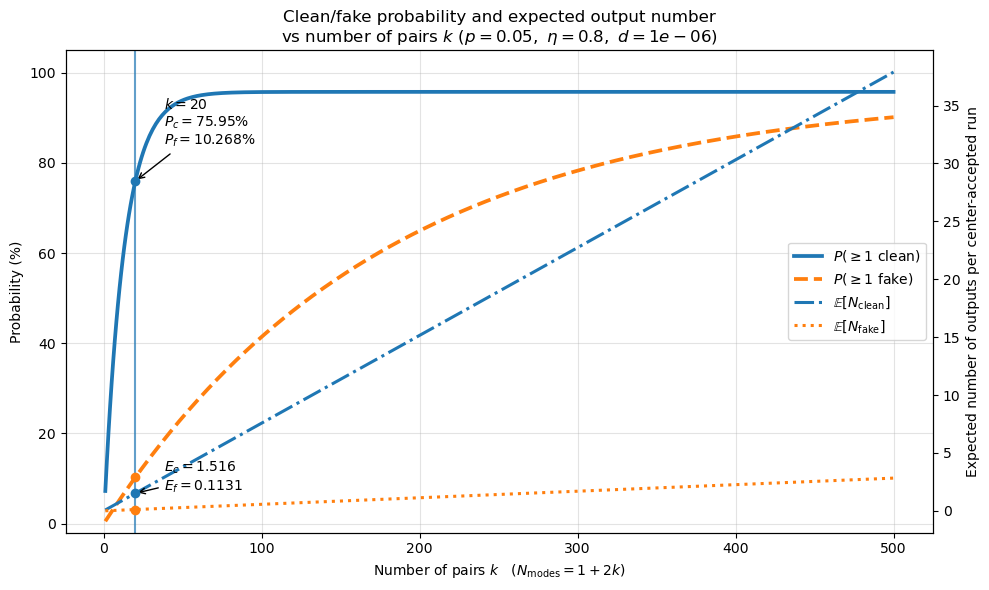

========== Fixed parameters ==========
p = 0.05 (5.000%)
eta = 0.8
dark count = 1e-06

========== Pair-level ==========
q_clean = 0.07578942  (7.5789% per pair)
q_fake  = 0.00565577  (0.5656% per pair)
q_obs   = 0.08144519  (8.1445% per pair)
candidate purity = 93.0557%

========== k=20 ==========
N_modes = 41
P(>=1 clean) = 75.9524%
P(>=1 fake)  = 10.2678%
E[N_clean]   = 1.515788
E[N_fake]    = 0.113115

========== Reference values ==========
k=  10, N_modes=  21 | P_clean= 52.212% | P_fake= 5.2795% | E_clean= 0.7579 | E_fake= 0.05656
k=  20, N_modes=  41 | P_clean= 75.952% | P_fake=10.2678% | E_clean= 1.5158 | E_fake= 0.11312
k=  40, N_modes=  81 | P_clean= 91.655% | P_fake=19.4345% | E_clean= 3.0316 | E_fake= 0.22623
k= 100, N_modes= 201 | P_clean= 95.711% | P_fake=41.4468% | E_clean= 7.5789 | E_fake= 0.56558
k= 200, N_modes= 401 | P_clean= 95.747% | P_fake=64.9522% | E_clean=15.1579 | E_fake= 1.13115
k= 500, N_modes=1001 | P_clean= 95.747% | P_fake=90.1299% | E_clean=37.8947 | E_fa

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# Fixed parameters
# ============================================================
p = 0.05      # P_n = p^n, p=0.05 = 5%
eta = 0.8      # detector quantum efficiency
d = 1e-6       # dark count probability per gate

# k = number of outer pairs
k_vals = np.arange(1, 501)
N_modes = 1 + 2 * k_vals


# ============================================================
# Probability model
# ============================================================
def compute_probabilities(p, eta=0.8, d=1e-6):
    """
    Node subtraction model:
        P_n = p^n, n >= 1
        P_0 = 1 - sum_{n>=1} p^n

    Detector:
        C_n = 1 - (1-d)(1-eta)^n

    Clean pair:
        exactly one node has single-photon subtraction and detected click,
        the other node has true no-subtraction and no dark count.

    Fake pair:
        observed 10/01 candidate but not clean.
        This includes:
            - double or more photon subtraction in one node
            - dark count
            - missed hidden subtraction on no-click side
            - detector inefficiency effects
    """

    if p >= 0.5:
        raise ValueError("This P_n = p^n model requires p < 0.5.")

    # no-subtraction probability
    P0 = 1 - p / (1 - p)

    def C(n):
        return 1 - (1 - d) * (1 - eta)**n

    # infinite sums
    sum_Pn = p / (1 - p)
    sum_Pn_no_detect_factor = p * (1 - eta) / (1 - p * (1 - eta))

    # observed node click / no-click
    C_obs = (
        P0 * d
        + sum_Pn
        - (1 - d) * sum_Pn_no_detect_factor
    )
    N_obs = 1 - C_obs

    # clean node events
    S0 = P0 * (1 - d)       # true no subtraction + no dark count
    S1 = p * C(1)           # exactly one subtraction + detected click

    # pair-level probabilities
    q_clean = 2 * S0 * S1
    q_obs = 2 * C_obs * N_obs
    q_fake = max(q_obs - q_clean, 0)

    purity = q_clean / q_obs

    return P0, C_obs, N_obs, S0, S1, q_clean, q_fake, q_obs, purity


P0, C_obs, N_obs, S0, S1, q_clean, q_fake, q_obs, purity = compute_probabilities(
    p, eta, d
)

# ============================================================
# Curves vs k
# ============================================================
# center node should be observed no-click
N_center = N_obs

# probability that at least one clean/fake pair exists
P_clean_exist = N_center * (1 - (1 - q_clean)**k_vals)
P_fake_exist = N_center * (1 - (1 - q_fake)**k_vals)

# expected number of clean/fake outputs per center-accepted run
E_clean = k_vals * q_clean
E_fake = k_vals * q_fake


# ============================================================
# Single summary plot
# ============================================================
fig, ax1 = plt.subplots(figsize=(10, 6))

# Left axis: probabilities
line1, = ax1.plot(
    k_vals,
    100 * P_clean_exist,
    linewidth=2.7,
    label=r"$P(\geq 1\ \mathrm{clean})$"
)

line2, = ax1.plot(
    k_vals,
    100 * P_fake_exist,
    linewidth=2.7,
    linestyle="--",
    label=r"$P(\geq 1\ \mathrm{fake})$"
)

ax1.set_xlabel(r"Number of pairs $k$   $(N_{\rm modes}=1+2k)$")
ax1.set_ylabel("Probability (%)")
ax1.grid(True, alpha=0.35)
ax1.set_ylim(-2, 105)

# Right axis: expected counts
ax2 = ax1.twinx()

line3, = ax2.plot(
    k_vals,
    E_clean,
    linewidth=2.2,
    linestyle="-.",
    label=r"$\mathbb{E}[N_{\rm clean}]$"
)

line4, = ax2.plot(
    k_vals,
    E_fake,
    linewidth=2.2,
    linestyle=":",
    label=r"$\mathbb{E}[N_{\rm fake}]$"
)

ax2.set_ylabel("Expected number of outputs per center-accepted run")

# Mark k=20
k_mark = 20
P_clean_mark = N_center * (1 - (1 - q_clean)**k_mark)
P_fake_mark = N_center * (1 - (1 - q_fake)**k_mark)
E_clean_mark = k_mark * q_clean
E_fake_mark = k_mark * q_fake

ax1.axvline(k_mark, linewidth=1.5, alpha=0.7)
ax1.scatter([k_mark], [100 * P_clean_mark], zorder=5)
ax1.scatter([k_mark], [100 * P_fake_mark], zorder=5)
ax2.scatter([k_mark], [E_clean_mark], zorder=5)
ax2.scatter([k_mark], [E_fake_mark], zorder=5)

ax1.annotate(
    rf"$k={k_mark}$"
    "\n"
    rf"$P_c={100*P_clean_mark:.2f}\%$"
    "\n"
    rf"$P_f={100*P_fake_mark:.3f}\%$",
    xy=(k_mark, 100 * P_clean_mark),
    xytext=(k_mark + 18, 100 * P_clean_mark + 8),
    arrowprops=dict(arrowstyle="->", lw=1),
    fontsize=10
)

ax2.annotate(
    rf"$E_c={E_clean_mark:.3f}$"
    "\n"
    rf"$E_f={E_fake_mark:.4f}$",
    xy=(k_mark, E_clean_mark),
    xytext=(k_mark + 18, E_clean_mark + 0.25),
    arrowprops=dict(arrowstyle="->", lw=1),
    fontsize=10
)

# Combined legend
lines = [line1, line2, line3, line4]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc="center right")

plt.title(
    rf"Clean/fake probability and expected output number"
    "\n"
    rf"vs number of pairs $k$ ($p={p},\ \eta={eta},\ d={d}$)"
)

plt.tight_layout()
plt.show()


# ============================================================
# Print useful numbers
# ============================================================
print("========== Fixed parameters ==========")
print(f"p = {p} ({100*p:.3f}%)")
print(f"eta = {eta}")
print(f"dark count = {d}")

print("\n========== Pair-level ==========")
print(f"q_clean = {q_clean:.8f}  ({100*q_clean:.4f}% per pair)")
print(f"q_fake  = {q_fake:.8f}  ({100*q_fake:.4f}% per pair)")
print(f"q_obs   = {q_obs:.8f}  ({100*q_obs:.4f}% per pair)")
print(f"candidate purity = {100*purity:.4f}%")

print("\n========== k=20 ==========")
print(f"N_modes = {1 + 2*k_mark}")
print(f"P(>=1 clean) = {100*P_clean_mark:.4f}%")
print(f"P(>=1 fake)  = {100*P_fake_mark:.4f}%")
print(f"E[N_clean]   = {E_clean_mark:.6f}")
print(f"E[N_fake]    = {E_fake_mark:.6f}")

print("\n========== Reference values ==========")
for k_ref in [10, 20, 40, 100, 200, 500]:
    Pc = N_center * (1 - (1 - q_clean)**k_ref)
    Pf = N_center * (1 - (1 - q_fake)**k_ref)
    Ec = k_ref * q_clean
    Ef = k_ref * q_fake
    print(
        f"k={k_ref:4d}, N_modes={1+2*k_ref:4d} | "
        f"P_clean={100*Pc:7.3f}% | "
        f"P_fake={100*Pf:7.4f}% | "
        f"E_clean={Ec:7.4f} | "
        f"E_fake={Ef:8.5f}"
    )

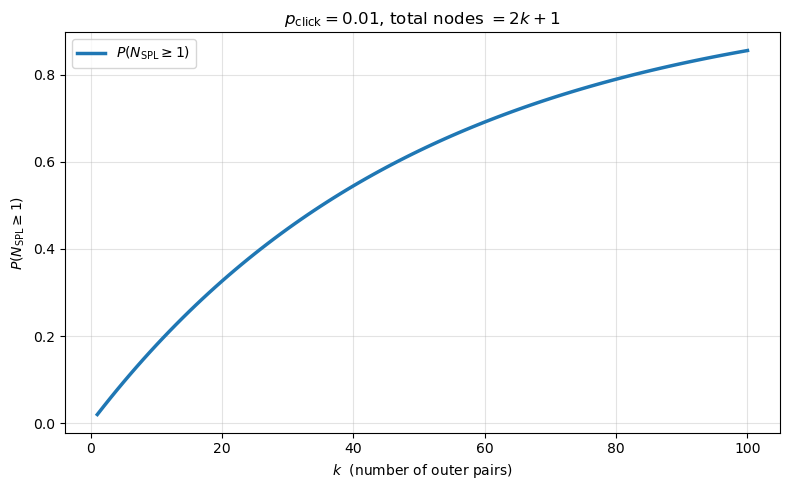

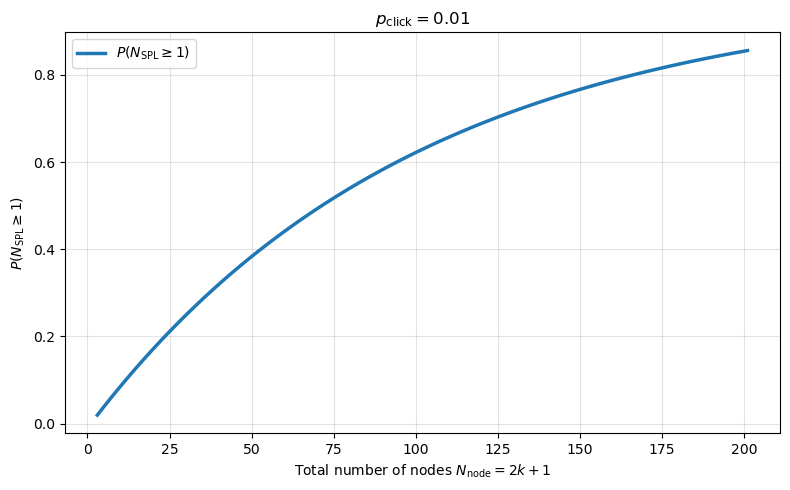

k =   1, N_node =   3, P(N_SPL >= 1) = 0.019602 (1.96%)
k =   5, N_node =  11, P(N_SPL >= 1) = 0.094205 (9.42%)
k =  10, N_node =  21, P(N_SPL >= 1) = 0.179446 (17.94%)
k =  20, N_node =  41, P(N_SPL >= 1) = 0.326365 (32.64%)
k =  50, N_node = 101, P(N_SPL >= 1) = 0.625775 (62.58%)
k = 100, N_node = 201, P(N_SPL >= 1) = 0.856000 (85.60%)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================
# Parameters
# =========================
p_click = 0.01          # photon-subtraction click probability per node
k_max = 100             # maximum number of outer pairs

# =========================
# k and total node number
# =========================
k = np.arange(1, k_max + 1)
N_node = 2 * k + 1

# =========================
# Probability
# =========================
P_single_photon_like = (1 - p_click) * (
    1 - (p_click**2 + (1 - p_click)**2)**k
)

# =========================
# Plot vs k
# =========================
plt.figure(figsize=(8, 5))

plt.plot(
    k,
    P_single_photon_like,
    linewidth=2.5,
    label=r"$P(N_{\rm SPL}\geq 1)$"
)

plt.xlabel(r"$k$  (number of outer pairs)")
plt.ylabel(r"$P(N_{\rm SPL}\geq 1)$")
plt.title(rf"$p_{{\rm click}}={p_click}$, total nodes $=2k+1$")
plt.grid(True, alpha=0.35)
plt.legend()
plt.tight_layout()
plt.show()

# =========================
# Plot vs total node number
# =========================
plt.figure(figsize=(8, 5))

plt.plot(
    N_node,
    P_single_photon_like,
    linewidth=2.5,
    label=r"$P(N_{\rm SPL}\geq 1)$"
)

plt.xlabel(r"Total number of nodes $N_{\rm node}=2k+1$")
plt.ylabel(r"$P(N_{\rm SPL}\geq 1)$")
plt.title(rf"$p_{{\rm click}}={p_click}$")
plt.grid(True, alpha=0.35)
plt.legend()
plt.tight_layout()
plt.show()

# =========================
# Print useful values
# =========================
for k_ref in [1, 5, 10, 20, 50, 100]:
    P_ref = (1 - p_click) * (
        1 - (p_click**2 + (1 - p_click)**2)**k_ref
    )
    print(
        f"k = {k_ref:3d}, "
        f"N_node = {2*k_ref+1:3d}, "
        f"P(N_SPL >= 1) = {P_ref:.6f} "
        f"({100*P_ref:.2f}%)"
    )

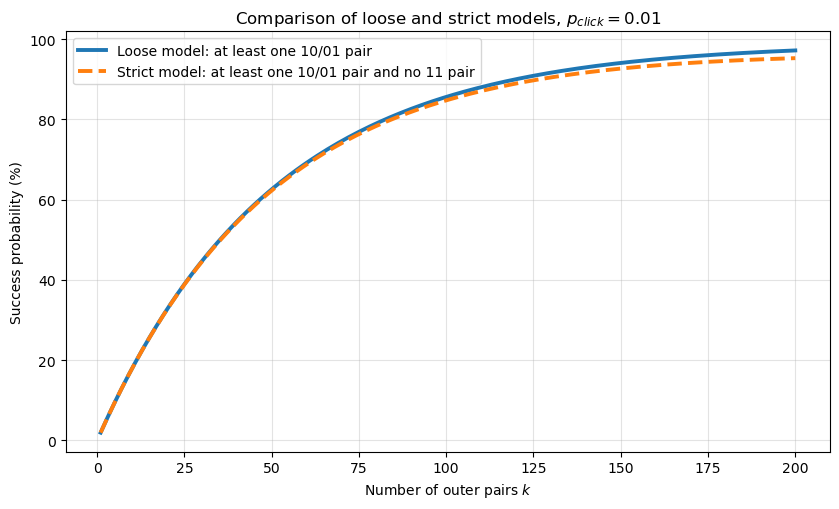

p_click = 0.01

k=  1, N_node=  3, P_loose=  1.960%, P_strict=  1.960%
k=  5, N_node= 11, P_loose=  9.420%, P_strict=  9.417%
k= 10, N_node= 21, P_loose= 17.945%, P_strict= 17.928%
k= 20, N_node= 41, P_loose= 32.637%, P_strict= 32.574%
k= 50, N_node=101, P_loose= 62.577%, P_strict= 62.269%
k=100, N_node=201, P_loose= 85.600%, P_strict= 84.751%
k=200, N_node=401, P_loose= 97.186%, P_strict= 95.262%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================
# Parameters
# =========================
p_click = 0.01
k_max = 200

k = np.arange(1, k_max + 1)
N_node = 2 * k + 1

# =========================
# Loose model
# At least one 10/01 pair.
# Other 11 pairs are ignored.
# =========================
P_loose = (1 - p_click) * (
    1 - (p_click**2 + (1 - p_click)**2)**k
)

# =========================
# Strict model
# At least one 10/01 pair AND no 11 pair in all k pairs.
# =========================
P_strict = (1 - p_click) * (
    (1 - p_click**2)**k - (1 - p_click)**(2 * k)
)

# =========================
# Plot
# =========================
plt.figure(figsize=(8.5, 5.2))

plt.plot(
    k,
    100 * P_loose,
    linewidth=2.8,
    label="Loose model: at least one 10/01 pair"
)

plt.plot(
    k,
    100 * P_strict,
    linewidth=2.8,
    linestyle="--",
    label="Strict model: at least one 10/01 pair and no 11 pair"
)

plt.xlabel(r"Number of outer pairs $k$")
plt.ylabel(r"Success probability (%)")
plt.title(rf"Comparison of loose and strict models, $p_{{click}}={p_click}$")
plt.grid(True, alpha=0.35)
plt.legend()
plt.tight_layout()
plt.show()

# =========================
# Reference values
# =========================
print("p_click =", p_click)
print()

for k_ref in [1, 5, 10, 20, 50, 100, 200]:
    P_l = (1 - p_click) * (
        1 - (p_click**2 + (1 - p_click)**2)**k_ref
    )
    P_s = (1 - p_click) * (
        (1 - p_click**2)**k_ref - (1 - p_click)**(2 * k_ref)
    )
    print(
        f"k={k_ref:3d}, "
        f"N_node={2*k_ref+1:3d}, "
        f"P_loose={100*P_l:7.3f}%, "
        f"P_strict={100*P_s:7.3f}%"
    )

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# ============================================================
# Phase-space convention
# q = (x1,...,xm,p1,...,pm)
# [x,p] = 2i
# vacuum covariance = I
# ============================================================


def chain_adjacency(n_nodes, g=1.0):
    Adj = np.zeros((n_nodes, n_nodes), dtype=float)
    for j in range(n_nodes - 1):
        Adj[j, j + 1] = g
        Adj[j + 1, j] = g
    return Adj


def graph_covariance_from_adj(Adj, squeezing_db):
    m = Adj.shape[0]

    squeezing_db = np.asarray(squeezing_db, dtype=float)
    if squeezing_db.ndim == 0:
        squeezing_db = np.full(m, float(squeezing_db))

    s_var = 10 ** (squeezing_db / 10)

    I = np.eye(m)
    Z = np.zeros((m, m))

    G = np.block([
        [I, Z],
        [Adj, I]
    ])

    V0 = np.diag(np.concatenate([s_var, 1 / s_var]))
    V = G @ V0 @ G.T

    d = np.zeros(2 * m)

    return V, d


def photon_subtraction_polynomial(V, sub_node):
    """
    Photon-subtracted Wigner:
        W(q) = P(q) W_G(q;V,d)

    Here P(q) = q^T Bp q + lp^T q + cp.
    Initial state is zero-mean before displacement.
    """
    m = V.shape[0] // 2
    sub_idx = sub_node - 1

    Pi = np.zeros((2 * m, 2 * m))
    Pi[sub_idx, sub_idx] = 1.0
    Pi[m + sub_idx, m + sub_idx] = 1.0

    I2m = np.eye(2 * m)

    A = (
        2 * (V - I2m) @ Pi @ (V - I2m)
        / np.trace((V - I2m) @ Pi)
    )

    Vinv = np.linalg.inv(V)
    B = Vinv @ A @ Vinv
    c = 2.0 - np.trace(Vinv @ A)

    # W = 1/2 (q^T B q + c) W_G
    Bp = 0.5 * B
    lp = np.zeros(2 * m)
    cp = 0.5 * c

    return Bp, lp, cp, A


def gaussian_condition_x(V, d, Bp, lp, cp, measured_node, outcome):
    """
    Condition W(q)=P(q)G(q;V,d) on x_measured_node = outcome.

    Returns normalized conditional:
        W_R(q_R)=P_R(q_R) G(q_R;V_R,d_R)
    """
    m = V.shape[0] // 2

    h = measured_node - 1  # x index
    R0 = np.array([i for i in range(m) if i != h], dtype=int)

    inds_R = np.concatenate([R0, m + R0])
    inds_h = np.array([h], dtype=int)

    V_RR = V[np.ix_(inds_R, inds_R)]
    V_Rh = V[np.ix_(inds_R, inds_h)]
    V_hR = V[np.ix_(inds_h, inds_R)]
    V_hh = V[h, h]

    d_R0 = d[inds_R]
    d_h = d[h]

    V_cond = V_RR - V_Rh @ V_hR / V_hh
    d_cond = d_R0 + (V_Rh[:, 0] / V_hh) * (outcome - d_h)

    # Polynomial substitution q_full = Pmat q_R + hvec
    nR = len(inds_R)
    nF = 2 * m

    Pmat = np.zeros((nF, nR))
    for local_i, full_i in enumerate(inds_R):
        Pmat[full_i, local_i] = 1.0

    hvec = np.zeros(nF)
    hvec[h] = outcome

    B_R = Pmat.T @ Bp @ Pmat
    l_R = Pmat.T @ (lp + 2 * Bp @ hvec)
    c_R = hvec @ Bp @ hvec + lp @ hvec + cp

    # Normalize conditional Wigner
    norm = (
        np.trace(B_R @ V_cond)
        + d_cond @ B_R @ d_cond
        + l_R @ d_cond
        + c_R
    )

    B_R = B_R / norm
    l_R = l_R / norm
    c_R = c_R / norm

    return V_cond, d_cond, B_R, l_R, c_R, R0


def local_index_from_original(R0, original_node):
    original_idx = original_node - 1
    hits = np.where(R0 == original_idx)[0]
    if len(hits) == 0:
        raise ValueError(
            f"original node {original_node} is not in remaining nodes {list(R0 + 1)}"
        )
    return int(hits[0])


def apply_displacement_poly(V, d, Bp, lp, cp, shift):
    """
    Active displacement:
        q -> q + shift

    W_new(q) = W_old(q - shift)

    This changes d and also shifts the polynomial center.
    """
    shift = np.asarray(shift, dtype=float)

    d_new = d + shift

    B_new = Bp.copy()
    l_new = lp - 2 * Bp @ shift
    c_new = shift @ Bp @ shift - lp @ shift + cp

    return V, d_new, B_new, l_new, c_new


def make_shift_vector(R0, shifts):
    """
    shifts:
        list of tuples:
            ("x", original_node, amount)
            ("p", original_node, amount)

    Returns shift vector in reduced ordering:
        (x_R, p_R)
    """
    r = len(R0)
    shift = np.zeros(2 * r)

    for quad, node, amount in shifts:
        k = local_index_from_original(R0, node)

        if quad == "x":
            shift[k] += amount
        elif quad == "p":
            shift[r + k] += amount
        else:
            raise ValueError("quad must be 'x' or 'p'.")

    return shift


def marginal_single_mode_poly(V, d, Bp, lp, cp, keep_local_node):
    """
    Marginalize polynomial-Gaussian Wigner to one mode.

    keep_local_node:
        local node label in remaining system, 1-based
    """
    r = len(d) // 2
    k = keep_local_node - 1

    keep = np.array([k, r + k], dtype=int)
    trace = np.array([i for i in range(2 * r) if i not in keep], dtype=int)

    V_kk = V[np.ix_(keep, keep)]
    d_k = d[keep]

    if len(trace) == 0:
        return V_kk, d_k, Bp, lp, cp

    V_tt = V[np.ix_(trace, trace)]
    V_tk = V[np.ix_(trace, keep)]
    V_kt = V[np.ix_(keep, trace)]

    d_t = d[trace]

    inv_Vkk = np.linalg.inv(V_kk)

    # conditional trace variables t | k
    C_t_given_k = V_tt - V_tk @ inv_Vkk @ V_kt
    L = V_tk @ inv_Vkk
    b = d_t - L @ d_k

    # full q mean conditional on q_k:
    # q_full = A q_k + b_full + noise_in_trace
    A_full = np.zeros((2 * r, 2))
    b_full = np.zeros(2 * r)
    C_full = np.zeros((2 * r, 2 * r))

    A_full[keep, :] = np.eye(2)
    b_full[keep] = 0.0

    A_full[trace, :] = L
    b_full[trace] = b
    C_full[np.ix_(trace, trace)] = C_t_given_k

    B1 = A_full.T @ Bp @ A_full
    l1 = A_full.T @ (2 * Bp @ b_full + lp)
    c1 = (
        b_full @ Bp @ b_full
        + lp @ b_full
        + cp
        + np.trace(Bp @ C_full)
    )

    # normalize marginal polynomial
    norm = (
        np.trace(B1 @ V_kk)
        + d_k @ B1 @ d_k
        + l1 @ d_k
        + c1
    )

    B1 = B1 / norm
    l1 = l1 / norm
    c1 = c1 / norm

    return V_kk, d_k, B1, l1, c1


def wigner_grid_poly_gaussian(V1, d1, B1, l1, c1, xlim=6, n=250):
    xs = np.linspace(-xlim, xlim, n)
    ps = np.linspace(-xlim, xlim, n)

    X, P = np.meshgrid(xs, ps)
    Q = np.stack([X, P], axis=-1)

    DQ = Q - d1

    Vinv = np.linalg.inv(V1)
    detV = np.linalg.det(V1)

    quad_g = np.einsum("...i,ij,...j->...", DQ, Vinv, DQ)

    Wg = (1 / (2 * np.pi * np.sqrt(detV))) * np.exp(-0.5 * quad_g)

    poly = (
        np.einsum("...i,ij,...j->...", Q, B1, Q)
        + np.einsum("i,...i->...", l1, Q)
        + c1
    )

    W = poly * Wg

    return X, P, W


def compare_ff_single_mode_wigners(
    n_nodes=3,
    g=0.3,
    squeezing_db=0.015,
    sub_node=1,
    measured_node=2,
    x_outcome=1.0,
    case_Z_shifts=None,
    case_X_shifts=None,
    plot_original_nodes=None,
    xlim=6,
    ngrid=250
):
    """
    General comparison.

    Example for 3-node chain:
        measure node 2, compare p-ff vs x-ff.

    case_Z_shifts and case_X_shifts use original node labels:
        [("p", 1, -g*x_outcome)]
        [("x", 3, +x_outcome)]
    """

    Adj = chain_adjacency(n_nodes, g=g)
    V, d = graph_covariance_from_adj(Adj, squeezing_db=squeezing_db)

    Bp, lp, cp, A = photon_subtraction_polynomial(V, sub_node=sub_node)

    Vc, dc, Bc, lc, cc, R0 = gaussian_condition_x(
        V, d, Bp, lp, cp,
        measured_node=measured_node,
        outcome=x_outcome
    )

    if case_Z_shifts is None:
        case_Z_shifts = []

    if case_X_shifts is None:
        case_X_shifts = []

    shift_Z = make_shift_vector(R0, case_Z_shifts)
    shift_X = make_shift_vector(R0, case_X_shifts)

    VZ, dZ, BZ, lZ, cZ = apply_displacement_poly(Vc, dc, Bc, lc, cc, shift_Z)
    VX, dX, BX, lX, cX = apply_displacement_poly(Vc, dc, Bc, lc, cc, shift_X)

    R_labels = list(R0 + 1)

    if plot_original_nodes is None:
        plot_original_nodes = R_labels

    print("Remaining original nodes =", R_labels)
    print("d after x-homodyne only =", dc)
    print("d_Z =", dZ)
    print("d_X =", dX)
    print("max |VZ - VX| =", np.max(np.abs(VZ - VX)))
    print("max |dZ - dX| =", np.max(np.abs(dZ - dX)))
    print()

    fig, axes = plt.subplots(
        len(plot_original_nodes),
        3,
        figsize=(13, 4 * len(plot_original_nodes)),
        constrained_layout=True
    )

    if len(plot_original_nodes) == 1:
        axes = np.array([axes])

    for row, original_node in enumerate(plot_original_nodes):
        local_node = local_index_from_original(R0, original_node) + 1

        V1_Z, d1_Z, B1_Z, l1_Z, c1_Z = marginal_single_mode_poly(
            VZ, dZ, BZ, lZ, cZ, keep_local_node=local_node
        )

        V1_X, d1_X, B1_X, l1_X, c1_X = marginal_single_mode_poly(
            VX, dX, BX, lX, cX, keep_local_node=local_node
        )

        Xg, Pg, WZ = wigner_grid_poly_gaussian(
            V1_Z, d1_Z, B1_Z, l1_Z, c1_Z,
            xlim=xlim,
            n=ngrid
        )

        _, _, WX = wigner_grid_poly_gaussian(
            V1_X, d1_X, B1_X, l1_X, c1_X,
            xlim=xlim,
            n=ngrid
        )

        Wdiff = WX - WZ

        print(f"original node {original_node}")
        print("  local node =", local_node)
        print("  d1_Z =", d1_Z)
        print("  d1_X =", d1_X)
        print("  max |V1_Z - V1_X| =", np.max(np.abs(V1_Z - V1_X)))
        print("  max |W_X - W_Z| =", np.max(np.abs(Wdiff)))
        print("  min W_Z =", np.min(WZ), ", min W_X =", np.min(WX))
        print()

        vmax = max(np.max(WZ), np.max(WX))
        vmin = min(np.min(WZ), np.min(WX))

        ax = axes[row, 0]
        c0 = ax.contourf(Xg, Pg, WZ, levels=70, cmap="RdBu_r", vmin=vmin, vmax=vmax)
        ax.set_title(f"Z case: original node {original_node}")
        ax.set_xlabel("x")
        ax.set_ylabel("p")
        fig.colorbar(c0, ax=ax)

        ax = axes[row, 1]
        c1 = ax.contourf(Xg, Pg, WX, levels=70, cmap="RdBu_r", vmin=vmin, vmax=vmax)
        ax.set_title(f"X case: original node {original_node}")
        ax.set_xlabel("x")
        ax.set_ylabel("p")
        fig.colorbar(c1, ax=ax)

        ax = axes[row, 2]
        c2 = ax.contourf(Xg, Pg, Wdiff, levels=70, cmap="RdBu_r")
        ax.set_title(f"Difference W_X - W_Z\noriginal node {original_node}")
        ax.set_xlabel("x")
        ax.set_ylabel("p")
        fig.colorbar(c2, ax=ax)

    plt.show()

    return {
        "R0": R0,
        "R_labels": R_labels,
        "VZ": VZ,
        "dZ": dZ,
        "BZ": BZ,
        "lZ": lZ,
        "cZ": cZ,
        "VX": VX,
        "dX": dX,
        "BX": BX,
        "lX": lX,
        "cX": cX,
    }

Remaining original nodes = [1, 3]
d after x-homodyne only = [0.  0.  0.3 0.3]
d_Z = [0.  0.  0.  0.3]
d_X = [0.  1.  0.3 0.3]
max |VZ - VX| = 0.0
max |dZ - dX| = 1.0

original node 1
  local node = 1
  d1_Z = [0. 0.]
  d1_X = [0.  0.3]
  max |V1_Z - V1_X| = 0.0
  max |W_X - W_Z| = 0.017796935950027827
  min W_Z = -9.980965007486247e-07 , min W_X = -9.976637150986804e-07

original node 3
  local node = 2
  d1_Z = [0.  0.3]
  d1_X = [1.  0.3]
  max |V1_Z - V1_X| = 0.0
  max |W_X - W_Z| = 0.059360573538770695
  min W_Z = 1.1290301058049707e-16 , min W_X = 2.347626702425548e-19



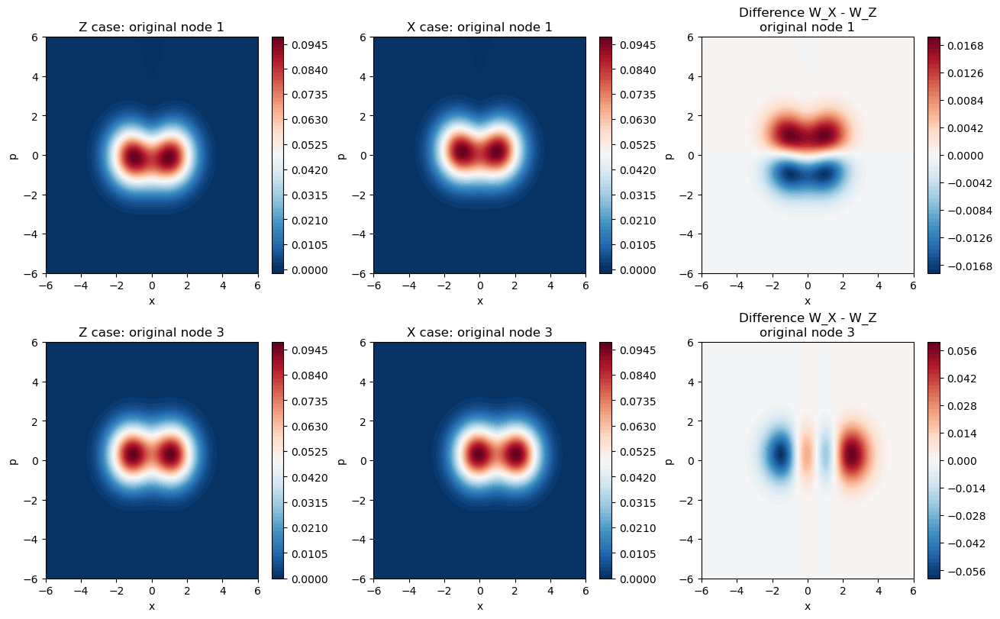

In [ ]:
g = 0.3
squeezing_db = 0.015
x_outcome = 1.0

result = compare_ff_single_mode_wigners(
    n_nodes=3,
    g=g,
    squeezing_db=squeezing_db,
    sub_node=1,
    measured_node=2,
    x_outcome=x_outcome,

    # case Z: p-feed-forward on node 1
    case_Z_shifts=[
        ("p", 1, -g * x_outcome)
    ],

    # case X: x-feed-forward on node 3
    case_X_shifts=[
        ("x", 3, +x_outcome)
    ],

    plot_original_nodes=[1, 3],
    xlim=6,
    ngrid=250
)

Remaining original nodes = [2, 3, 4]
d after x-homodyne only = [0.  0.  0.  0.3 0.  0. ]
d_Z = [0. 0. 0. 0. 0. 0.]
d_X = [0.  1.  0.  0.3 0.  0. ]
max |VZ - VX| = 0.0
max |dZ - dX| = 1.0

original node 2
  local node = 1
  d1_Z = [0. 0.]
  d1_X = [0.  0.3]
  max |V1_Z - V1_X| = 0.0
  max |W_X - W_Z| = 0.022292713475714057
  min W_Z = 5.816113445467792e-16 , min W_X = 1.1470092434452966e-16

original node 3
  local node = 2
  d1_Z = [0. 0.]
  d1_X = [1. 0.]
  max |V1_Z - V1_X| = 0.0
  max |W_X - W_Z| = 0.15950688769061513
  min W_Z = -0.12457814358539002 , min W_X = -0.12466869966084446

original node 4
  local node = 3
  d1_Z = [0. 0.]
  d1_X = [0. 0.]
  max |V1_Z - V1_X| = 0.0
  max |W_X - W_Z| = 1.3877787807814457e-17
  min W_Z = 5.506530760248891e-16 , min W_X = 5.506530760248891e-16



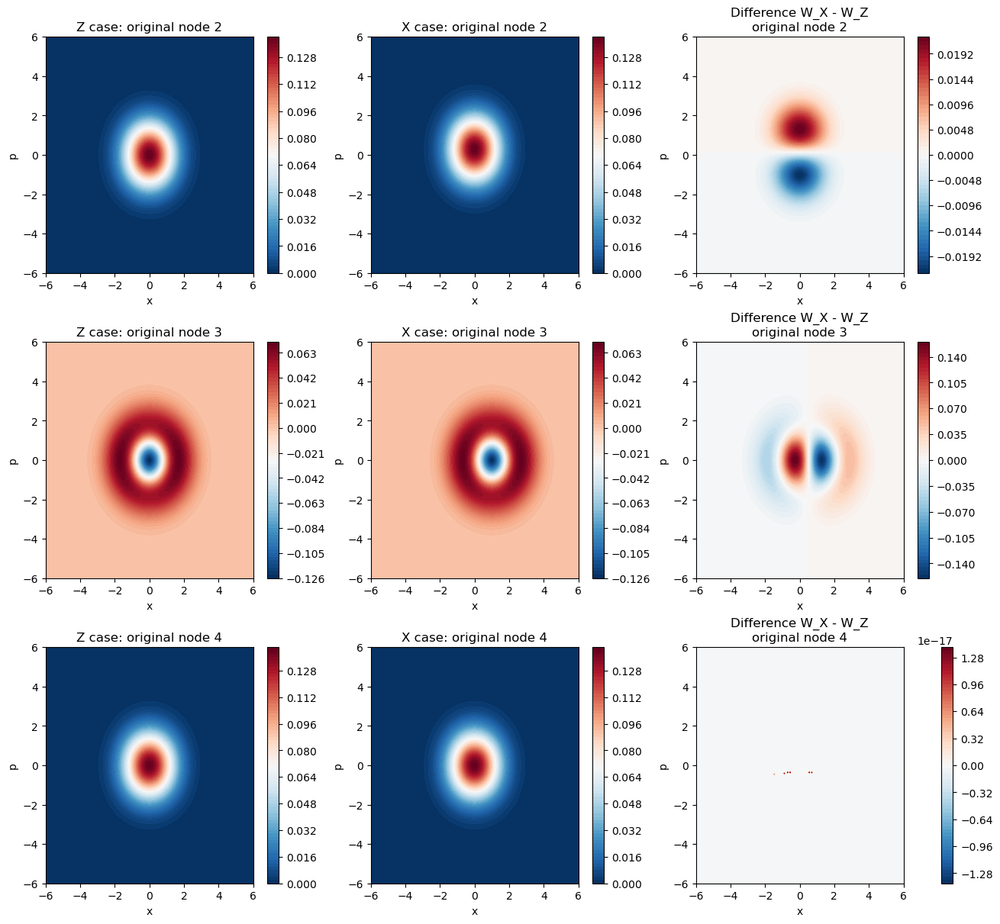

In [ ]:
g = 0.3
squeezing_db = 0.015
x_outcome = 1.0

result_1234 = compare_ff_single_mode_wigners(
    n_nodes=4,
    g=g,
    squeezing_db=squeezing_db,
    sub_node=4,
    measured_node=1,
    x_outcome=x_outcome,

    # standard p-feed-forward on node 2
    case_Z_shifts=[
        ("p", 2, -g * x_outcome)
    ],

    # alternative x-feed-forward on node 3 only
    case_X_shifts=[
        ("x", 3, +x_outcome)
    ],

    plot_original_nodes=[2, 3, 4],
    xlim=6,
    ngrid=250
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import minimize_scalar

# ============================================================
# Fidelity function if not already defined
# ============================================================

def fock01_fidelity_from_VA(V_k, A_k):
    """
    V_k, A_k: single-mode reduced matrices, shape (2,2)

    Returns:
        F0 = <0|rho|0>
        F1 = <1|rho|1>

    Convention:
        [x,p] = 2i
        vacuum covariance = I
    """

    V_k = np.asarray(V_k, dtype=float)
    A_k = np.asarray(A_k, dtype=float)

    if V_k.shape != (2, 2) or A_k.shape != (2, 2):
        raise ValueError("V_k and A_k must be 2x2 single-mode matrices.")

    I2 = np.eye(2)

    M = np.linalg.inv(V_k)
    B = M @ A_k @ M
    c0 = 2.0 - np.trace(M @ A_k)

    K = M + I2
    Sigma = np.linalg.inv(K)

    I0 = 2 * np.pi / np.sqrt(np.linalg.det(K))
    C = 1.0 / (2 * np.pi * np.sqrt(np.linalg.det(V_k)))

    I_B = I0 * np.trace(B @ Sigma)
    I_I = I0 * np.trace(Sigma)

    I_BI = I0 * (
        np.trace(B @ Sigma) * np.trace(Sigma)
        + 2 * np.trace(B @ Sigma @ Sigma)
    )

    F0 = C * (I_B + c0 * I0)

    F1 = C * (
        I_BI
        - I_B
        + c0 * (I_I - I0)
    )

    return float(np.real_if_close(F0)), float(np.real_if_close(F1))


# ============================================================
# Reduced matrix helper if not already defined
# ============================================================

def reduced_matrices_basic(V, A, subset, m):
    """
    subset: physical node labels, 1-based
    ordering: (x1,...,xm,p1,...,pm)
    """
    subset = np.array(subset, dtype=int) - 1
    inds = np.concatenate([subset, m + subset])

    V_sub = V[np.ix_(inds, inds)]
    A_sub = A[np.ix_(inds, inds)]

    return V_sub, A_sub, inds


# ============================================================
# Exact 2-node photon-subtraction fidelity
# ============================================================

def F1_two_node_exact(
    g,
    squeezing_db,
    sub_node=1,
    target_node=2
):
    """
    Exact 2-node calculation using V,A Wigner formula.

    Graph:
        1 -- 2 with edge weight g

    Photon subtraction:
        sub_node

    Fidelity:
        F1 on target_node

    Convention:
        q = (x1,x2,p1,p2)
        vacuum covariance = I
        [x,p] = 2i
    """

    m = 2

    Adj = np.array([
        [0.0, g],
        [g, 0.0]
    ])

    I = np.eye(m)
    Z = np.zeros((m, m))

    G = np.block([
        [I, Z],
        [Adj, I]
    ])

    s_var = 10 ** (squeezing_db / 10)
    s_arr = np.full(m, s_var, dtype=float)

    V0 = np.diag(np.concatenate([s_arr, 1 / s_arr]))
    V = G @ V0 @ G.T

    sub_idx = sub_node - 1

    Pi = np.zeros((2 * m, 2 * m))
    Pi[sub_idx, sub_idx] = 1.0
    Pi[m + sub_idx, m + sub_idx] = 1.0

    I2m = np.eye(2 * m)

    denom = np.trace((V - I2m) @ Pi)

    if np.abs(denom) < 1e-14:
        return np.nan

    A_minus = (
        2 * (V - I2m) @ Pi @ (V - I2m)
        / denom
    )

    V_k, A_k, inds = reduced_matrices_basic(
        V,
        A_minus,
        subset=[target_node],
        m=m
    )

    F0, F1 = fock01_fidelity_from_VA(V_k, A_k)

    return F1


# ============================================================
# Optimize squeezing for each g
# ============================================================

def find_optimal_s_for_g(
    g,
    db_min=0.0,
    db_max=0.5,
    sub_node=1,
    target_node=2
):
    """
    Find squeezing_db that maximizes F1 for fixed g.
    """

    def objective(db):
        F1 = F1_two_node_exact(
            g,
            db,
            sub_node=sub_node,
            target_node=target_node
        )

        if np.isnan(F1):
            return 1e9

        return -F1

    res = minimize_scalar(
        objective,
        bounds=(db_min, db_max),
        method="bounded",
        options={"xatol": 1e-10}
    )

    db_opt = res.x
    F1_opt = -res.fun
    s_opt = 10 ** (db_opt / 10)

    return s_opt, db_opt, F1_opt


# ============================================================
# Scan over g
# ============================================================

g_values = np.linspace(0.01, 0.30, 120)

s_opt_values = []
db_opt_values = []
F1_opt_values = []

for g in g_values:
    s_opt, db_opt, F1_opt = find_optimal_s_for_g(
        g,
        db_min=0.0,
        db_max=0.2,
        sub_node=1,
        target_node=2
    )

    s_opt_values.append(s_opt)
    db_opt_values.append(db_opt)
    F1_opt_values.append(F1_opt)

s_opt_values = np.array(s_opt_values)
db_opt_values = np.array(db_opt_values)
F1_opt_values = np.array(F1_opt_values)

df_opt = pd.DataFrame({
    "g": g_values,
    "s_opt": s_opt_values,
    "squeezing_db_opt": db_opt_values,
    "F1_max": F1_opt_values,
})

display(df_opt)

print("global max F1 =", np.max(F1_opt_values))
print("at g =", g_values[np.argmax(F1_opt_values)])
print("s_opt =", s_opt_values[np.argmax(F1_opt_values)])
print("squeezing_db_opt =", db_opt_values[np.argmax(F1_opt_values)])

,g,s_opt,squeezing_db_opt,F1_max
0,0.010000,1.000050,0.000217,0.999950
1,0.012437,1.000077,0.000336,0.999923
2,0.014874,1.000111,0.000480,0.999889
3,0.017311,1.000150,0.000651,0.999850
4,0.019748,1.000195,0.000847,0.999805
...,...,...,...,...
115,0.290252,1.040316,0.171652,0.956672
116,0.292689,1.040947,0.174287,0.955924
117,0.295126,1.041582,0.176933,0.955169
118,0.297563,1.042219,0.179589,0.954407


global max F1 = 0.999949998125984
at g = 0.01
s_opt = 1.0000499984190152
squeezing_db_opt = 0.00021713494666478523


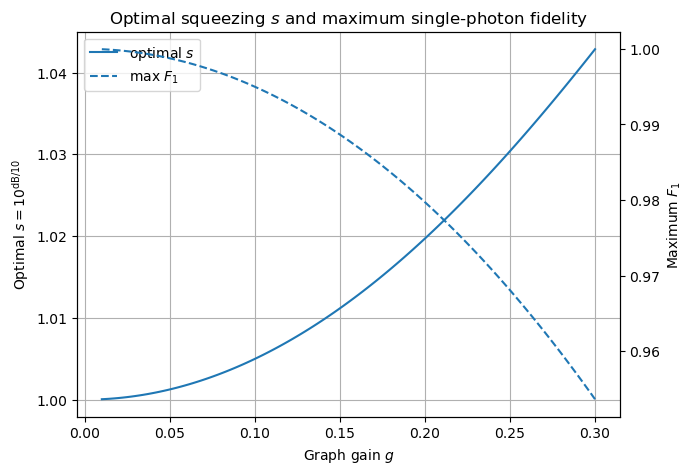

In [ ]:
# ============================================================
# Plot optimal s and maximum fidelity versus g
# ============================================================

fig, ax1 = plt.subplots(figsize=(7, 5))

ax1.plot(g_values, s_opt_values, label=r"optimal $s$")
ax1.set_xlabel(r"Graph gain $g$")
ax1.set_ylabel(r"Optimal $s=10^{\mathrm{dB}/10}$")
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(g_values, F1_opt_values, linestyle="--", label=r"max $F_1$")
ax2.set_ylabel(r"Maximum $F_1$")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

ax1.legend(lines1 + lines2, labels1 + labels2, loc="best")

plt.title(r"Optimal squeezing $s$ and maximum single-photon fidelity")
plt.show()

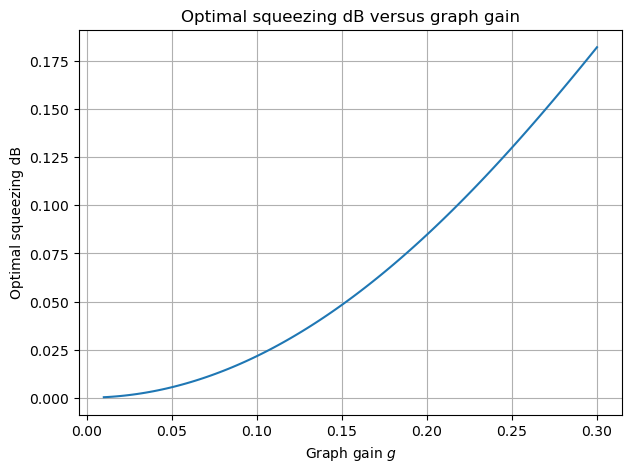

In [ ]:
plt.figure(figsize=(7, 5))
plt.plot(g_values, db_opt_values)
plt.xlabel(r"Graph gain $g$")
plt.ylabel("Optimal squeezing dB")
plt.grid(True)
plt.title("Optimal squeezing dB versus graph gain")
plt.show()

In [ ]:
mask = F1_opt_values >= 0.99

df_above_099 = df_opt[mask]

display(df_above_099)

if len(df_above_099) > 0:
    print("g range with F1 >= 0.99:")
    print(df_above_099["g"].min(), "~", df_above_099["g"].max())
else:
    print("No g values in this scan reach F1 >= 0.99.")

,g,s_opt,squeezing_db_opt,F1_max
0,0.010000,1.000050,0.000217,0.999950
1,0.012437,1.000077,0.000336,0.999923
2,0.014874,1.000111,0.000480,0.999889
3,0.017311,1.000150,0.000651,0.999850
4,0.019748,1.000195,0.000847,0.999805
5,0.022185,1.000246,0.001068,0.999754
6,0.024622,1.000303,0.001316,0.999697
7,0.027059,1.000366,0.001589,0.999634
8,0.029496,1.000435,0.001888,0.999565
9,0.031933,1.000510,0.002213,0.999490


g range with F1 >= 0.99:
0.01 ~ 0.1391596638655462
